## HR Analytics Project

In [1]:
#Importing necessary libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Importing the dataset
df=pd.read_csv(r'D:\Files\HR_Analytics.csv')
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


This data frame contains information related to **HR Analytics**. It contains **1470 rows and 35 columns** out of which **34 columns are inputs** and **1 column is target variable** i.e. **'Attrition' column**.  
The data frame contains both  **numeric and catagorical data.** Target variable has catagorical data thus it represents a **Classification Problem**.  
***The goal is to predict Attrition.***    

In [3]:
df.columns#checking columns of data frame

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [4]:
#Checking data type of columns
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

There are **two types** of data present in this data frame which are **int64, and object**. **Majority** of the data types are **'int64'**.

In [5]:
#checking for whitespace characters in columns of data frame
col=df.columns.tolist() #Storing columns name as list in 'col' variable

space=''#Initilizing empty 'space' variable
validation=0#Initilizaing variable

for i in col:#Iterating through columns
    
    for a in range(1,11): #Iterating for 10 number of times i.e. it can detect upto 10 number of whitespaces per row
        space+=' ' #Incrementing one white space character per iteration
        
        if not df.loc[df[i]==space].empty:#Checking if any row contains white space characters
            
            validation+=1#increasing 1 in 'validation' variable
            
            print(f'There are white space characters present in {i} Column with length of  {len(space)}  white space characters')#Printing if a column contains white space character along with number of  white space characters present in a single row(Note:It does not print total number of white space characters present in a column)
            
    space=''#Reseting 'space' variable
    
if validation==0:#Using 'if' to check whether 'validation' variable's value matches to '0' or not.
    print('This data frame does not contains any whitespace characters.')

This data frame does not contains any whitespace characters.


In [6]:
df.isnull().sum() #Checking if null values are present in data frame 

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

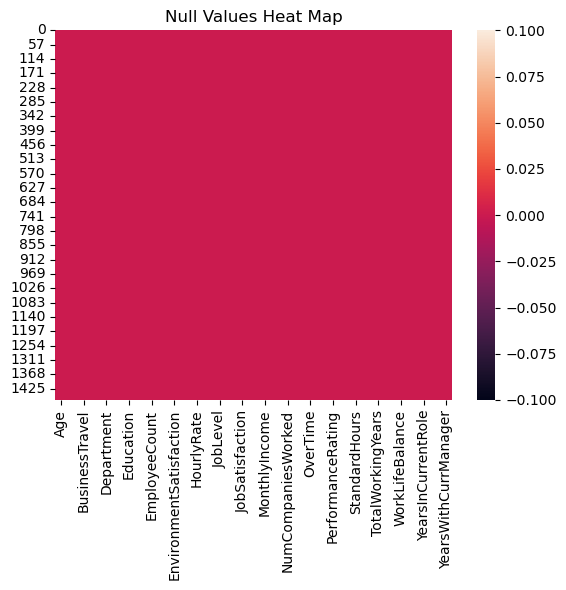

In [7]:
sb.heatmap(df.isnull())#Visualizing null values via Heatmap
plt.title('Null Values Heat Map')
plt.show()

We can confirm that this **data frame does not have null values present in it.**

In [8]:
#creating a function named 'dup' to check for duplicates values in data frame

def dup(x):#takes one argument i.e variable which stores data frame
    
    a=x.duplicated().sum()#storing sum of duplicate values in 'a' variable
    
    if a==0:#first condition
        print('This data frame does not contains duplicate values.')#printing
    
    elif a==1:#second condition
        print('There is only 1 duplicate value present in the data frame.')#printing
    
    else:
        print(f'Total duplicates values present in DataFrame are {x.duplicated().sum()}.')#printing
    
dup(df)

This data frame does not contains duplicate values.


In [9]:
df.info()#Checking more information related to data frame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

This shows **information** related to the **columns** and about their **Non-null count** and **Dtype.** It also shows the memory usage , which is **402.1+ KB** in this case.

In [10]:
#fetching details of columns, such as Unique values, Number of unique values and their value counts 
for i in col:#Iterating through 'col' variable
    print('\n',i,':-\nUnique values:',df[i].unique(),'\nNumber of unique values:',df[i].nunique(),'\n\n',df[i].value_counts().to_frame('Value Counts'))#Printing


 Age :-
Unique values: [41 49 37 33 27 32 59 30 38 36 35 29 31 34 28 22 53 24 21 42 44 46 39 43
 50 26 48 55 45 56 23 51 40 54 58 20 25 19 57 52 47 18 60] 
Number of unique values: 43 

     Value Counts
35            78
34            77
36            69
31            69
29            68
32            61
30            60
33            58
38            58
40            57
37            50
27            48
28            48
42            46
39            42
45            41
41            40
26            39
44            33
46            33
43            32
50            30
25            26
24            26
49            24
47            24
55            22
51            19
53            19
48            19
54            18
52            18
22            16
56            14
23            14
58            14
21            13
20            11
59            10
19             9
18             8
60             5
57             4

 Attrition :-
Unique values: ['Yes' 'No'] 
Number of unique val

This gives a breif information about **unique values, count of unique values and value counts** of each column present in the data frame.  
**All  values** present in **'EmployeeCount'** feature are **same** i.e **1**, thus , it can be dropped.  
**All  values** present in **'StandardHours'** feature are **same** i.e **80**, thus , it can be dropped.  
**All  values** present in **'Over18'** feature are **same** i.e **'Y'**, thus , it can be dropped.  
**All values** present in **'EmployeeNumber'** features are unique.  
**Target variable**'s data is **imbalanced** as there is high difference between the counts of values.

In [11]:
a=['EmployeeCount', 'Over18' , 'StandardHours']#creating list 
df.drop(a,axis=1,inplace=True)#dropping columns
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,2061,3,...,3,3,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,2062,4,...,3,1,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2064,2,...,4,2,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,2065,4,...,3,4,0,17,3,2,9,6,0,8


**'EmployeeCount', 'Over18' , 'StandardHours'** features are dropped successfully. Now the data frame has **32 columns** out of which **31 columns are inputs** and **1 column is target variable** i.e. **'Attrition' column.**

In [12]:
pd.set_option('display.max_columns',None)#Setting the display option to show all columns in the data frame
df.describe()#Using describe function on data frame

,Age,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


This gives the statistical information of the numerical columns. From the above description we can observe the following:   
1)There are no missing values.    
2)Mean is oddly greater than 50% in **'MonthlyIncome' and 'MonthlyRate'** features which means that the data **might** be **skewed to the right** in these features.  
3)There is huge jump between max and 75% in **'DailyRate', 'EmployeeNumber', 'MonthlyIncome' and 'MonthlyRate'** features which means that there **might** be **outliers present** in these features.

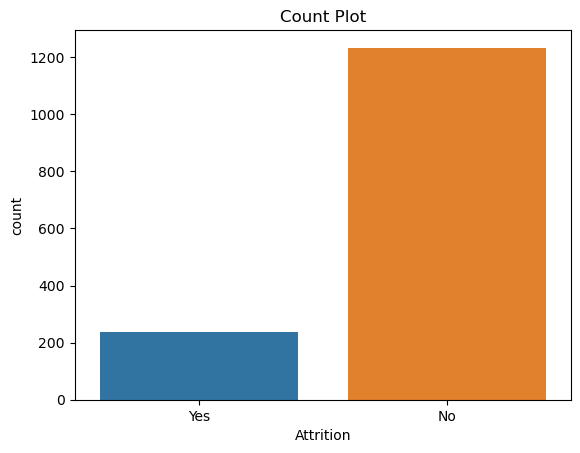

In [13]:
#checking count of values present in 'Attrition' target variable
sb.countplot(data=df,x='Attrition')
plt.title('Count Plot')
plt.show()

Number of **'No'** values are **highly greater** than number of **'Yes'** values which mean that this data is **imbalanced**. 

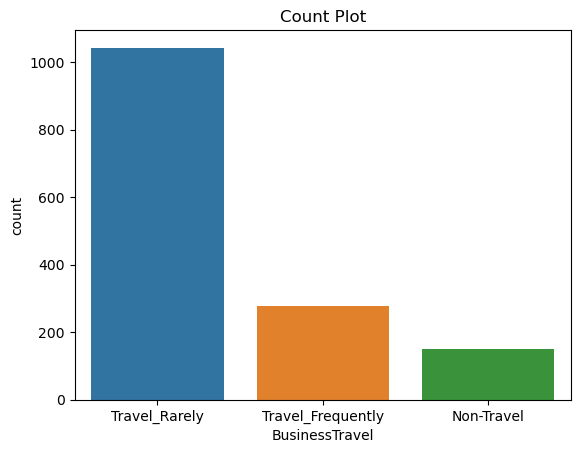

In [14]:
#checking count of values present in 'BusinessTravel' feature
sb.countplot(data=df,x='BusinessTravel')
plt.title('Count Plot')
plt.show()

Most the employee travel rarely.

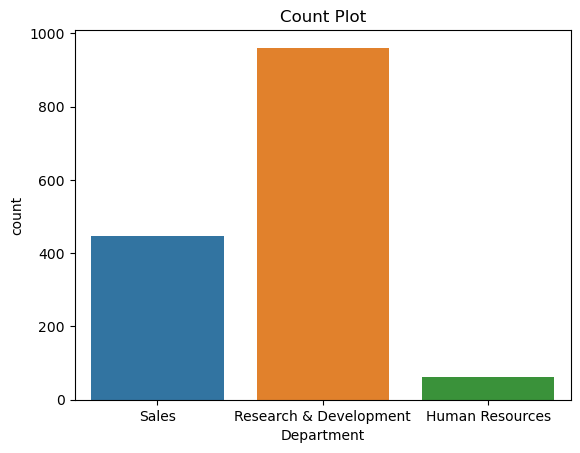

In [15]:
#checking count of values present in 'Department' feature
sb.countplot(data=df,x='Department')
plt.title('Count Plot')
plt.show()

Most of the employee are from **Research & Development Department**

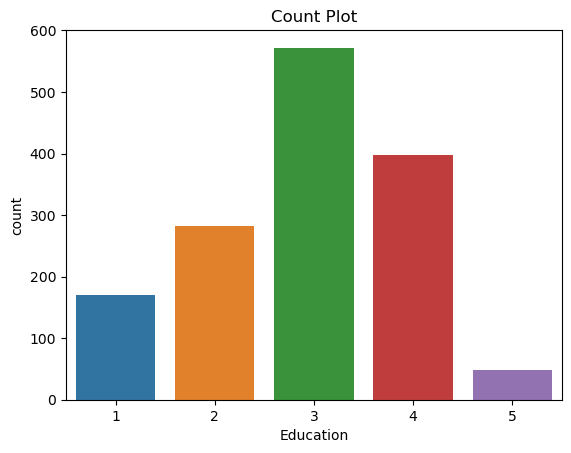

In [16]:
#checking count of values present in 'Education' feature
sb.countplot(data=df,x='Education')
plt.title('Count Plot')
plt.show()

Most of the employee have **'3'** education.**'4'** education is fairly less than **'3'** education

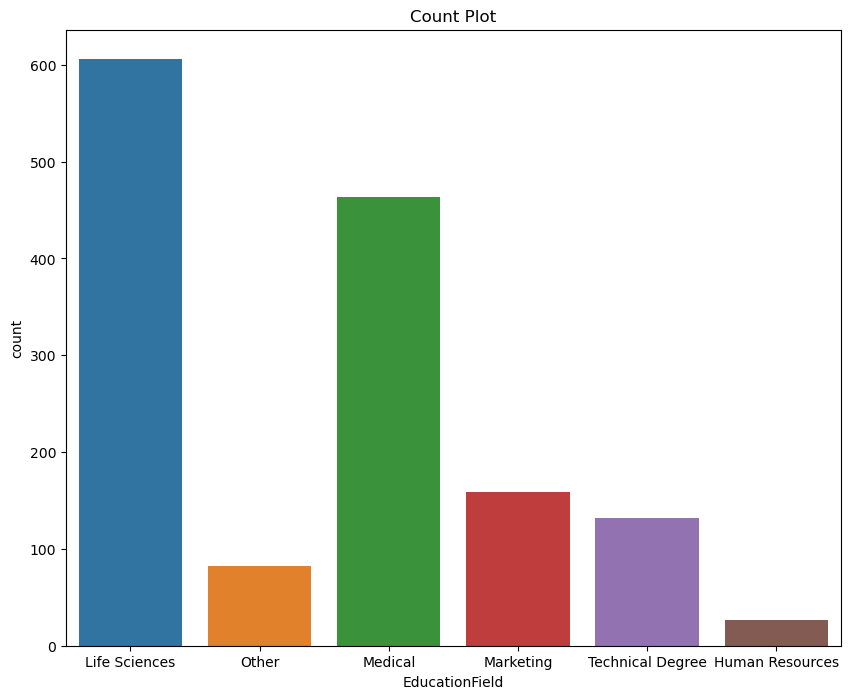

In [17]:
#checking count of values present in 'EducationField' feature
plt.figure(figsize=(10,8))
sb.countplot(data=df,x='EducationField')
plt.title('Count Plot')
plt.show()

Most of the employee are from **'Life Sciences'** and **'Medical'** education field. **'Medical'** education field is fairly less than **'Life Sciences'** education field.

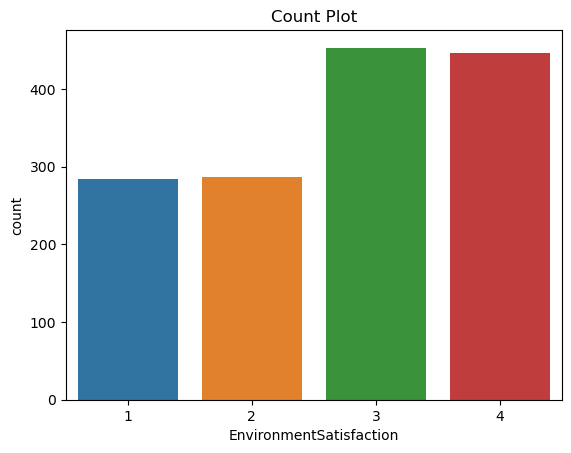

In [18]:
#checking count of values present in 'EnvironmentSatisfaction' feature
sb.countplot(data=df,x='EnvironmentSatisfaction')
plt.title('Count Plot')
plt.show()

Most of the employe have **'3' and '4'** environment satisfaction.**'3' environment satisfaction is bit high than and '4'** environment.

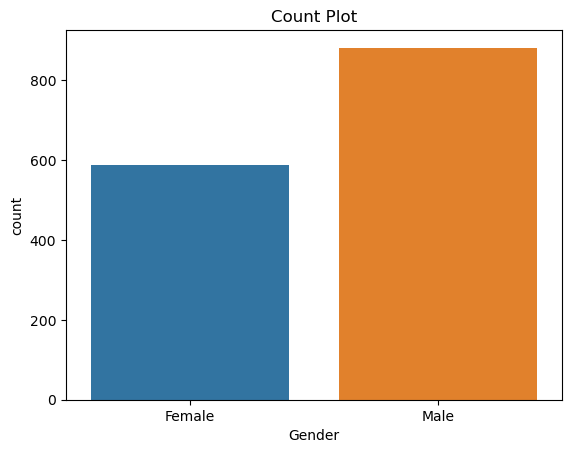

In [19]:
#checking count of values present in 'Gender' feature
sb.countplot(data=df,x='Gender')
plt.title('Count Plot')
plt.show()

Most of the employee are **Male**.

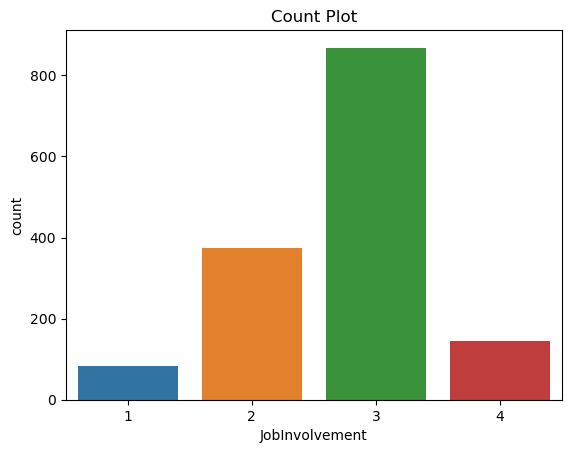

In [20]:
#checking count of values present in 'JobInvolvement' feature
sb.countplot(data=df,x='JobInvolvement')
plt.title('Count Plot')
plt.show()

Most of the employee have **'3'** job involvement.

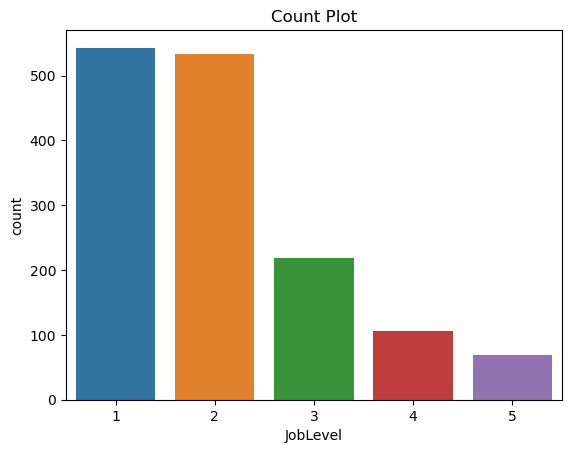

In [21]:
#checking count of values present in 'JobLevel' feature
sb.countplot(data=df,x='JobLevel')
plt.title('Count Plot')
plt.show()

Most of the employee have **'1' and '2'** job level. **'1'** job level is bit high than **'2'** job level.

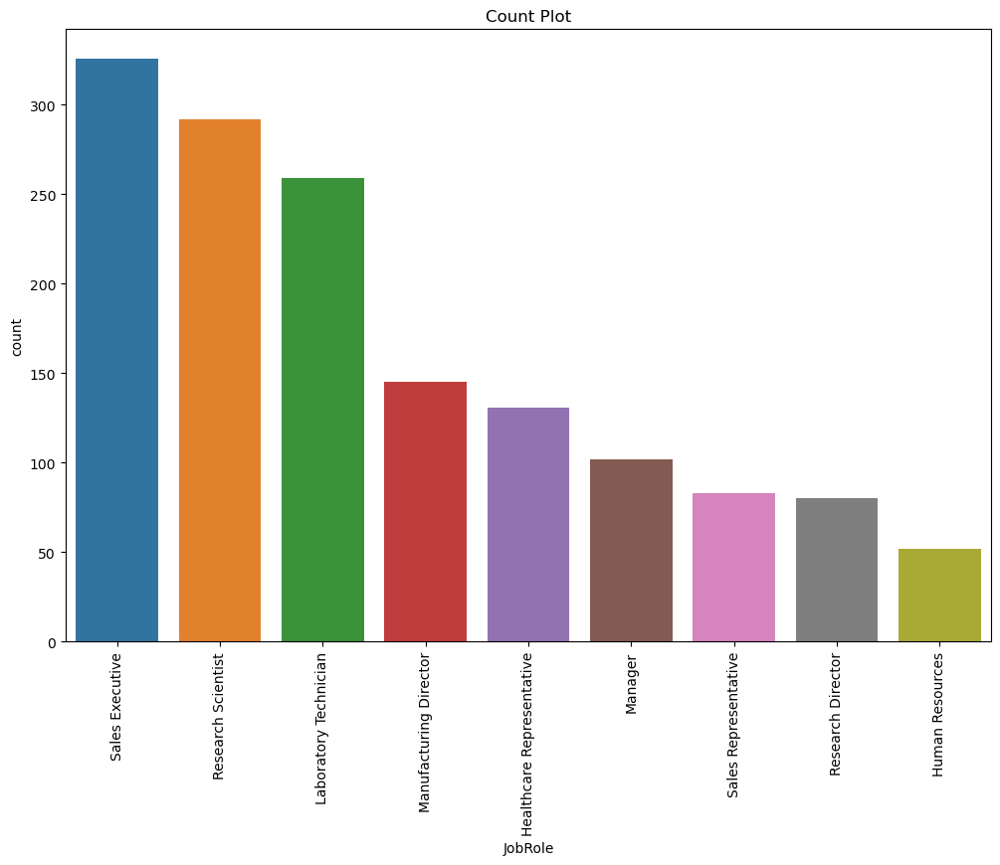

In [22]:
#checking count of values present in 'JobRole' feature
plt.figure(figsize=(12,8))
sb.countplot(data=df,x='JobRole')
plt.xticks(rotation=90)
plt.title('Count Plot')
plt.show()

Most of the employee are have **'Sales Executive', 'Research Scientist' and 'Laboratory Technician'** role. Among of these roles, **'Sales Executive'** is **highest followed** by **'Research Scientist' and 'Laboratory Technician'** 

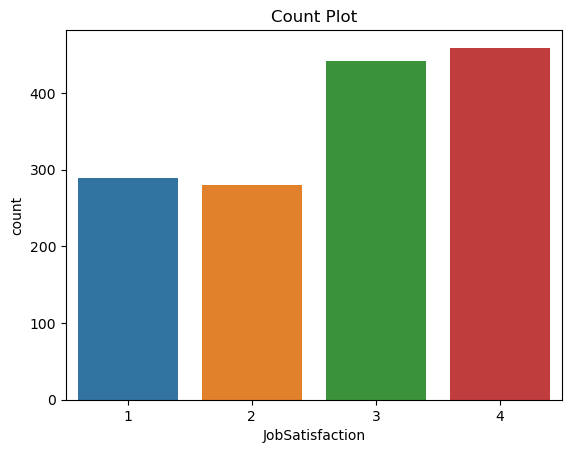

In [23]:
#checking count of values present in 'JobSatisfaction' feature
sb.countplot(data=df,x='JobSatisfaction')
plt.title('Count Plot')
plt.show()

Most employee have **'3' and '4'** job satisfaction. **'4'** job satisfaction is bit high than **'3'** job satisfaction.

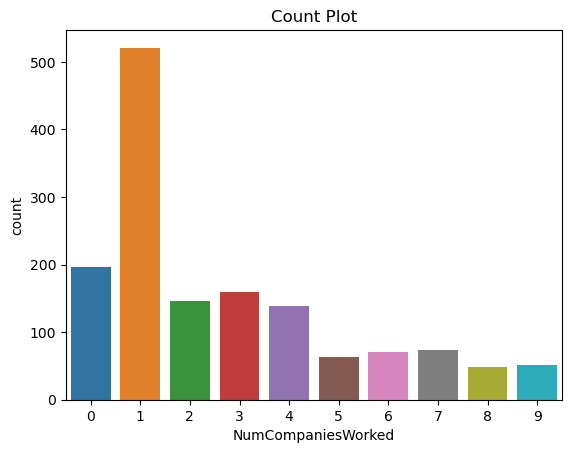

In [24]:
#checking count of values present in 'NumCompaniesWorked' feature
sb.countplot(data=df,x='NumCompaniesWorked')
plt.title('Count Plot')
plt.show()

Most employee have worked in **1** number of companies.

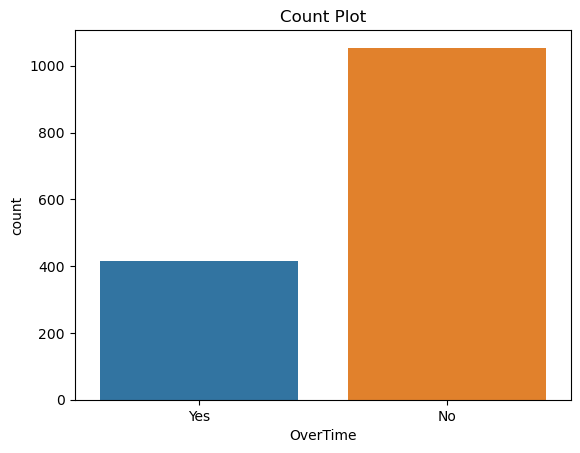

In [25]:
#checking count of values present in 'OverTime' feature
sb.countplot(data=df,x='OverTime')
plt.title('Count Plot')
plt.show()

Most of the employee **do not** work **over time**.

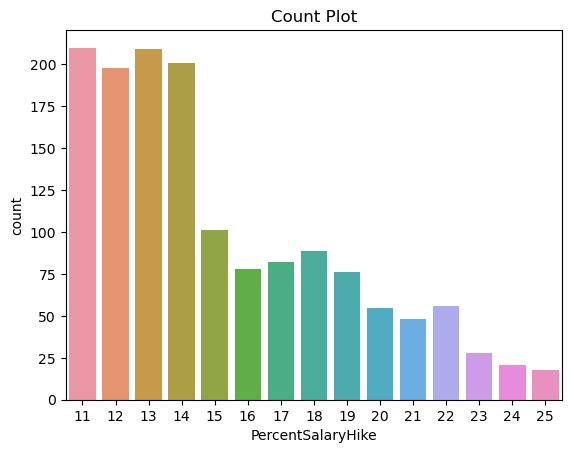

In [26]:
#checking count of values present in 'PercentSalaryHike' feature
sb.countplot(data=df,x='PercentSalaryHike')
plt.title('Count Plot')
plt.show()

Most of employee's percent salary hike is from **11-14**.

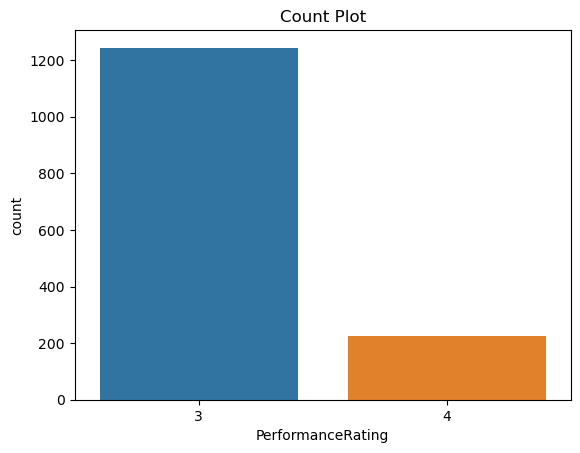

In [27]:
#checking count of values present in 'PerformanceRating' feature
sb.countplot(data=df,x='PerformanceRating')
plt.title('Count Plot')
plt.show()

Most of the employee have **'3'** performance rating.

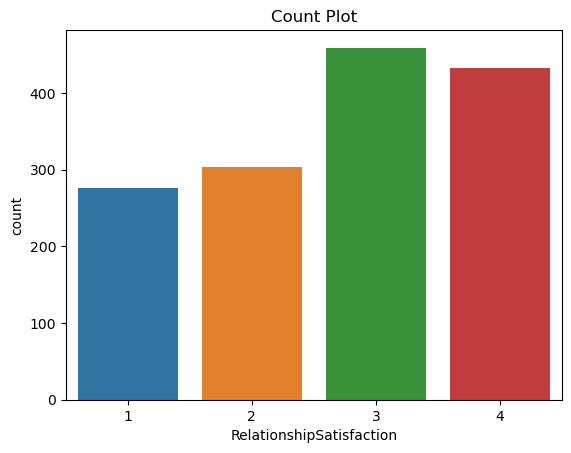

In [28]:
#checking count of values present in 'RelationshipSatisfaction' feature
sb.countplot(data=df,x='RelationshipSatisfaction')
plt.title('Count Plot')
plt.show()

Most of the employee have **'3' and '4' **relationship satisfaction.**'3'** relationship satisfaction is **bit high** than **'4'** relationship satisfaction.

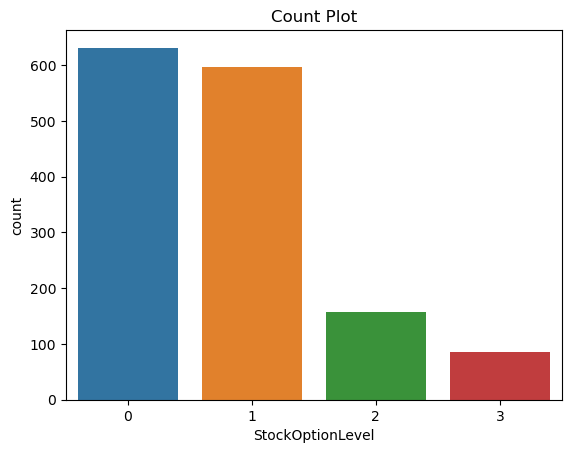

In [29]:
#checking count of values present in 'StockOptionLevel' feature
sb.countplot(data=df,x='StockOptionLevel')
plt.title('Count Plot')
plt.show()

Most of the employee have **'0' and '1'** stock option level.**'0'** stock option level is **bit high** than **'1'** stock option level.

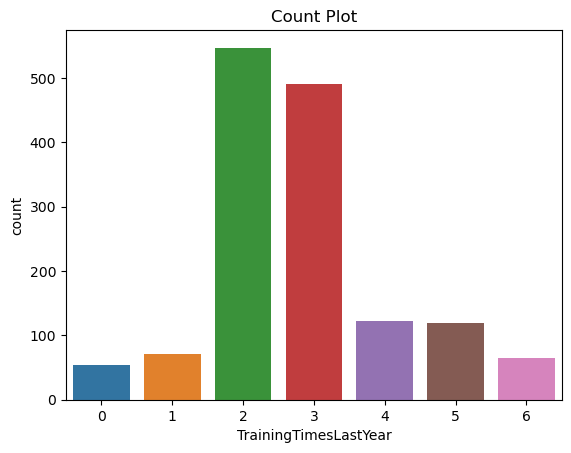

In [30]:
#checking count of values present in 'TrainingTimesLastYear' feature
sb.countplot(data=df,x='TrainingTimesLastYear')
plt.title('Count Plot')
plt.show()

Most of the employee have **'2' and '3'** training times in last year.**'2'** traning times is **bit high** than **'3'** training times.

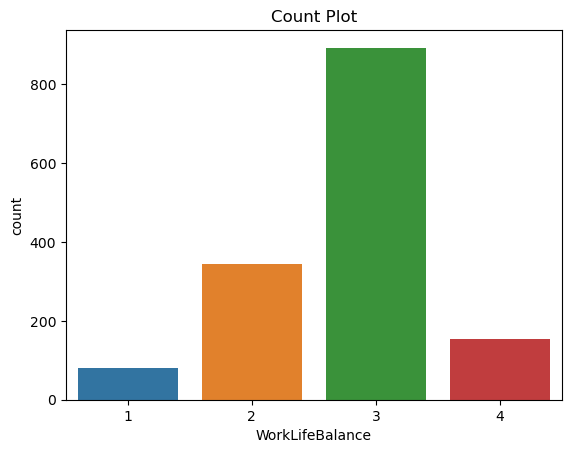

In [31]:
#checking count of values present in 'WorkLifeBalance' feature
sb.countplot(data=df,x='WorkLifeBalance')
plt.title('Count Plot')
plt.show()

Most of the employee have **'3'** work life balance.

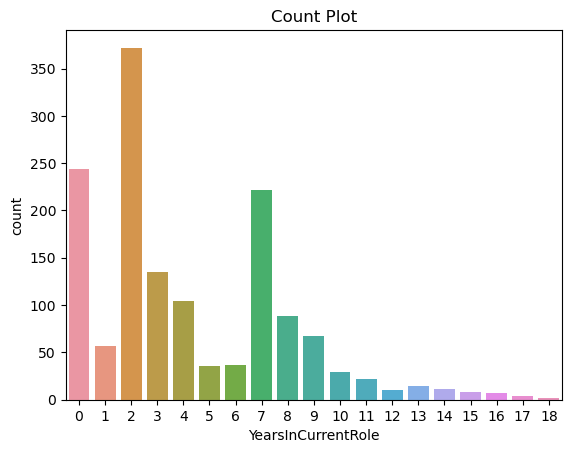

In [32]:
#checking count of values present in 'YearsInCurrentRole' feature
sb.countplot(data=df,x='YearsInCurrentRole')
plt.title('Count Plot')
plt.show()

Most of the employee have **'2'** years in current role.

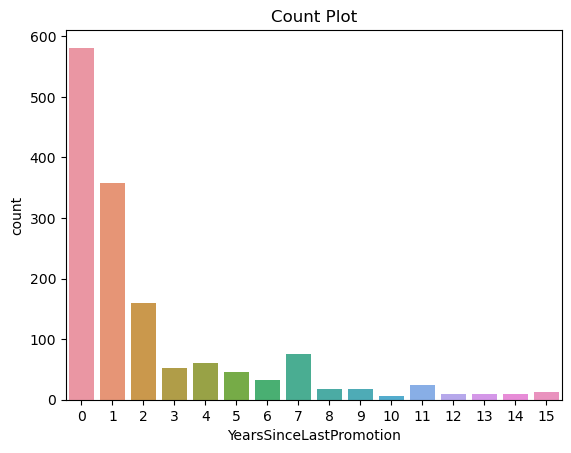

In [33]:
#checking count of values present in 'YearsSinceLastPromotion' feature
sb.countplot(data=df,x='YearsSinceLastPromotion')
plt.title('Count Plot')
plt.show()

Most of the employee have **'0'** years since last promotion.

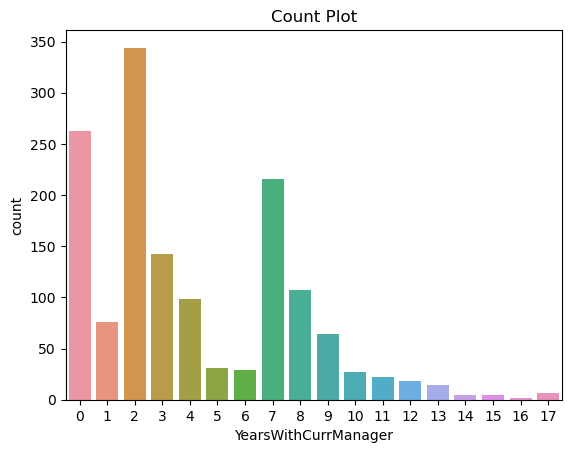

In [34]:
#checking count of values present in 'YearsWithCurrManager' feature
sb.countplot(data=df,x='YearsWithCurrManager')
plt.title('Count Plot')
plt.show()

Most of the employee have **'2'** years with current manager.

In [35]:
#creating empty list
num_c=[]
cat_c=[]

col=df.columns.to_list()#updating 'col' variable 

for i in col:#iterating through 'col' variable
    
    if df[i].dtype=='int64':#using if condition to check whether data type of column matches to 'int64' or not  
        num_c.append(i)#appending to 'num_c' list if condition is 'True'
    
    if df[i].dtype=='object':#using if condition to check whether data type of column matches to 'object' or not  
        cat_c.append(i)#appending to 'cat_c' list if condition is 'True'    

In [36]:
log=[]#creating empty list which is stored in 'log' variable 

def re():#creating a function named 're'
    
    for i in num_c:#iterating through 'col' variable
        if i not in log:#using if condition to plot graphs
            sb.lmplot(data=df,x=log[-1],y=i)
            plt.title('Linear Model Plot')
    plt.show()

In [37]:
num_c#checking contents of 'num_c' list

['Age',
 'DailyRate',
 'DistanceFromHome',
 'Education',
 'EmployeeNumber',
 'EnvironmentSatisfaction',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobSatisfaction',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

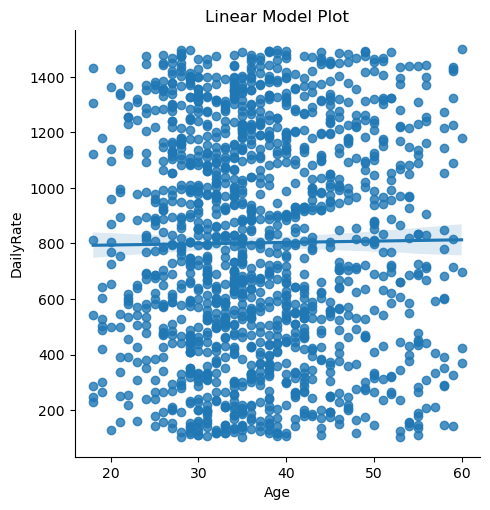

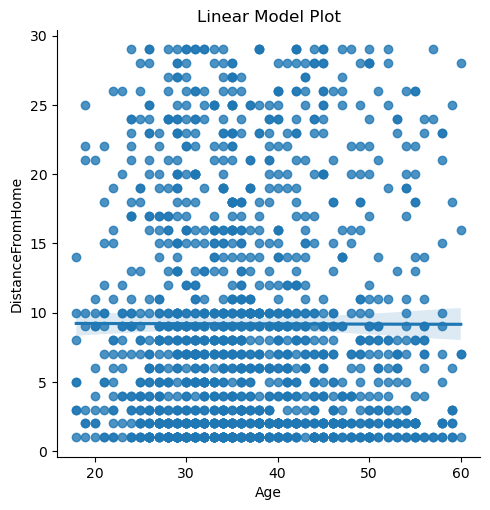

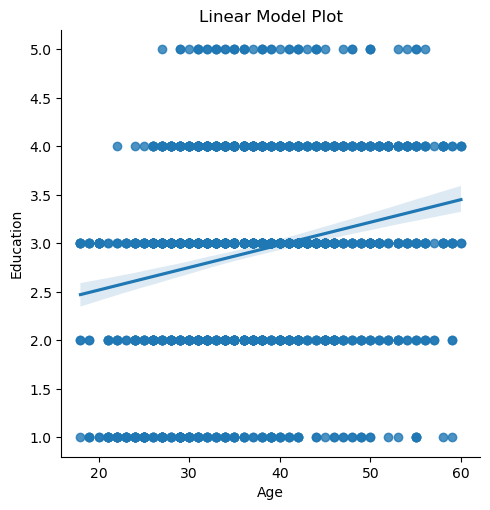

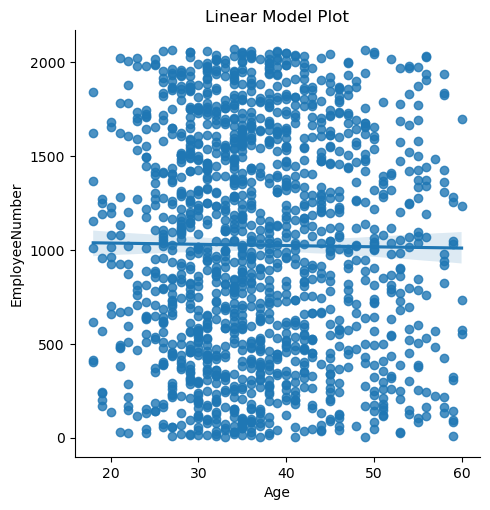

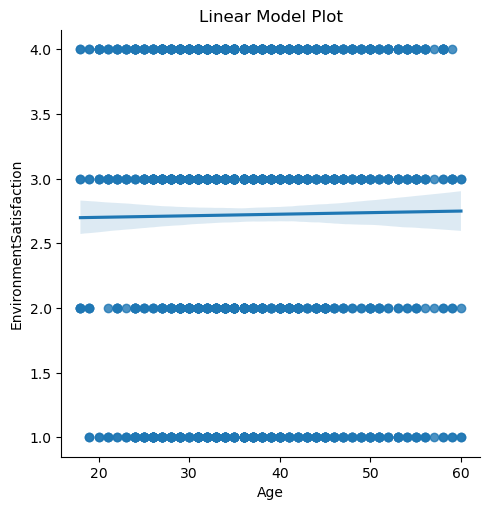

...

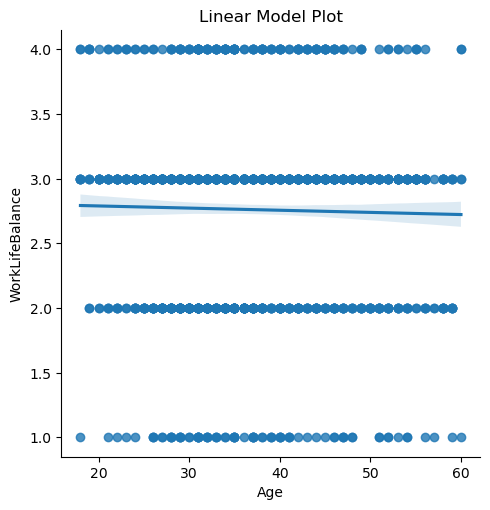

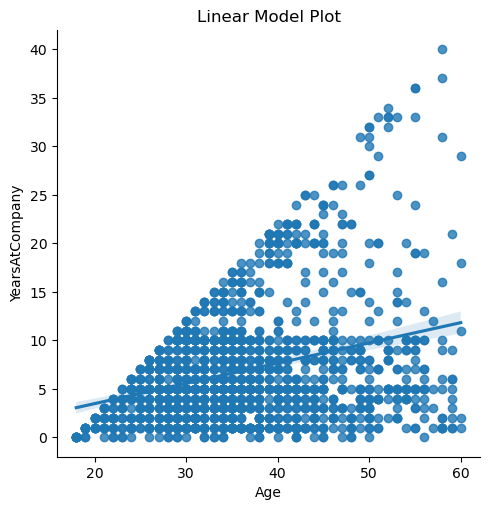

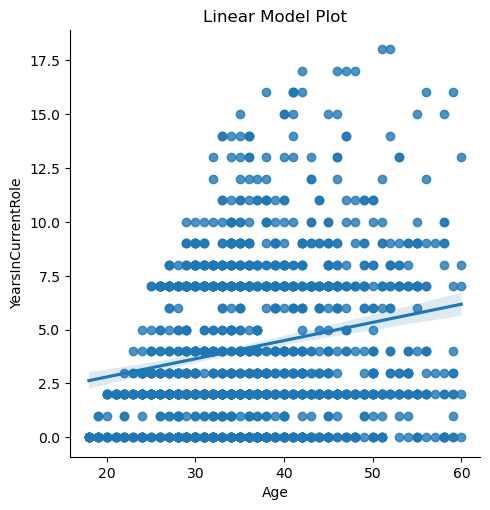

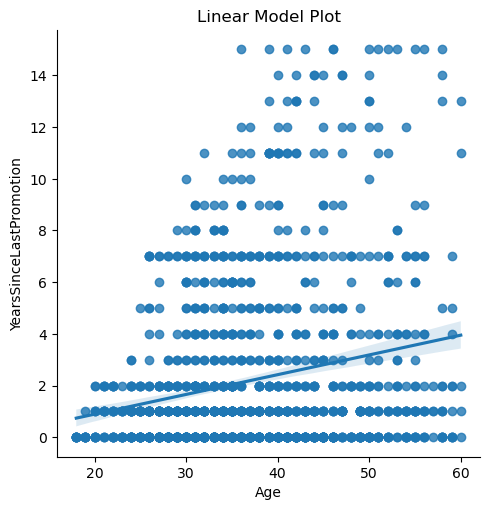

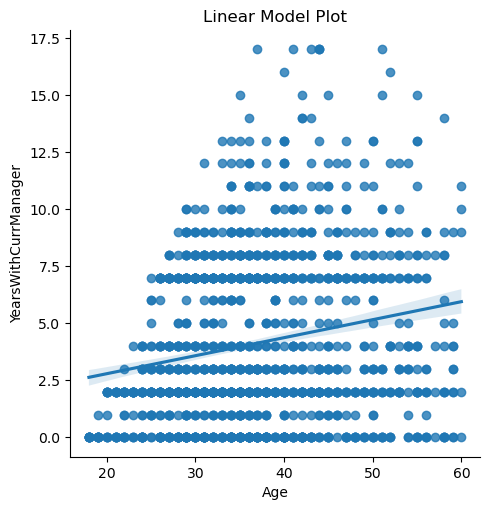

In [38]:
#checking linear relation of 'Age' feature with other features 
log.append('Age')#Appending feature
re()#calling function

**'Age'** feature has **low postive linear relation** with **'Education', 'JobInvolvement', 'NumCompaniesWorked', 'RelationshipSatisfaction', 'StockOptionLevel', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion' and 'YearsWithCurrManager'** features, and **high positive linear relation** with **'Job level', 'MonthyIncome' and 'TotalWorkingYears'** features.  
  
**'Age'** feature has **almost no linear relation** with **'DailyRate', 'DistanceFromHome', 'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate', 'JobSatisfaction', 'MonthlyRate','PercentSalaryHike', 'PerformanceRating', 'TrainingTimesLastYear' and 'WorkLifeBalance'** features.

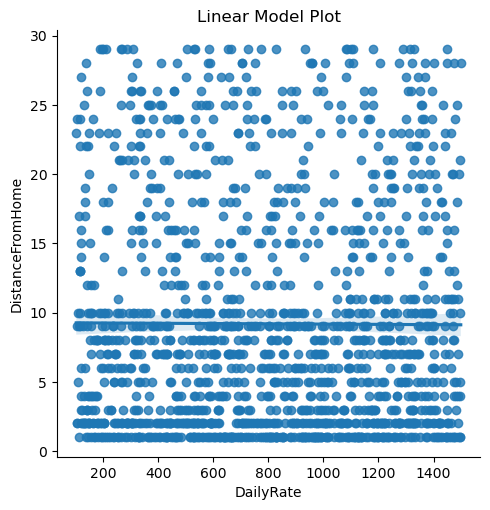

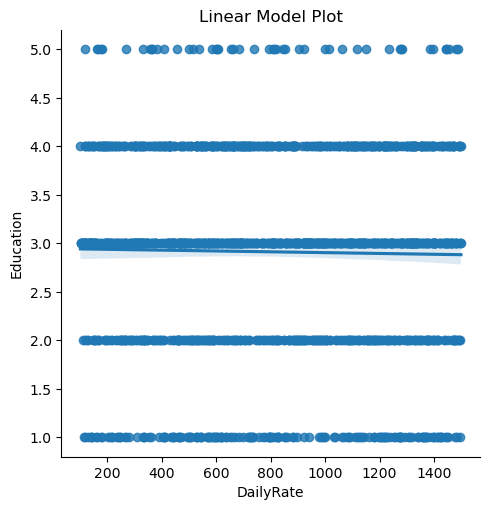

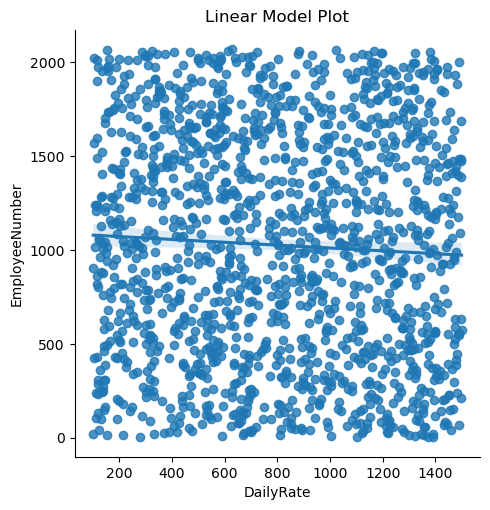

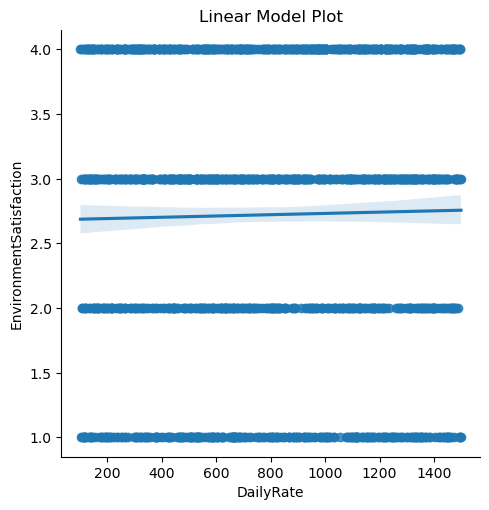

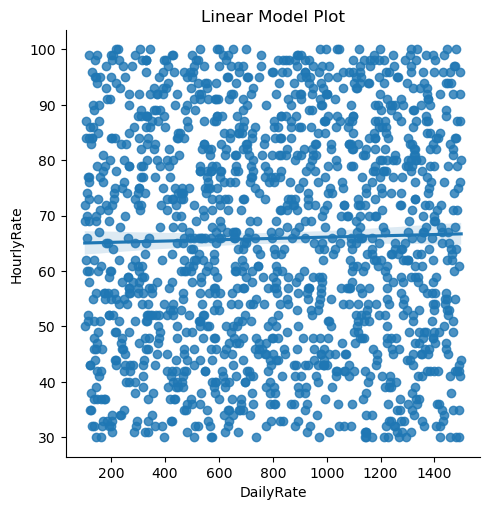

...

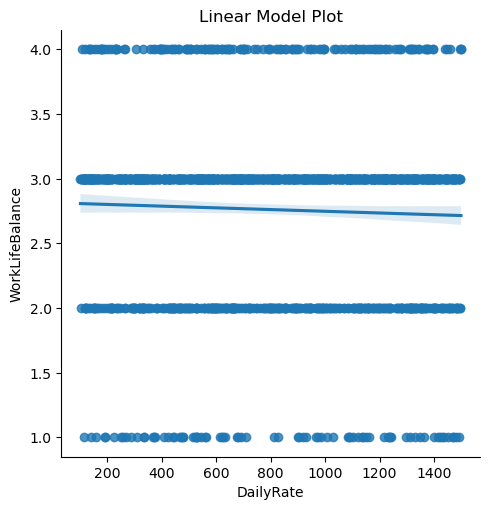

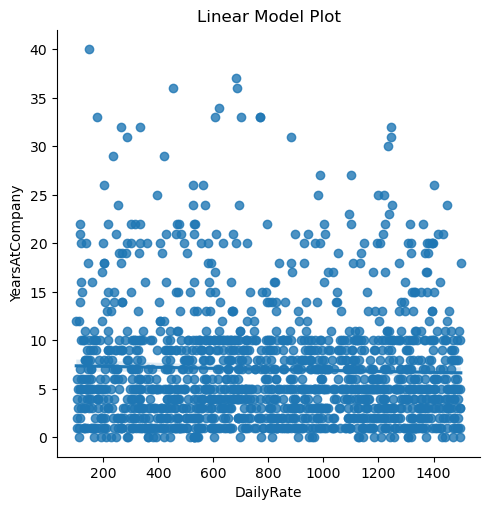

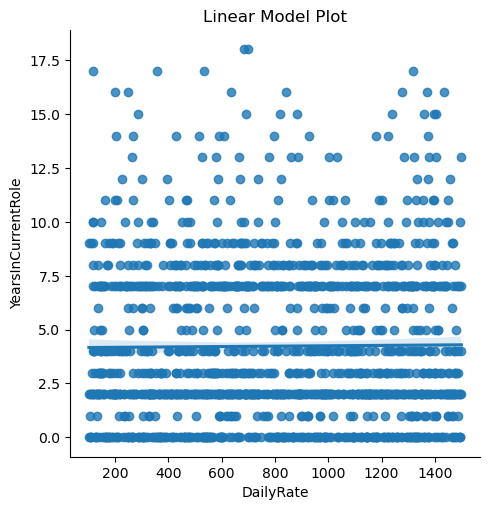

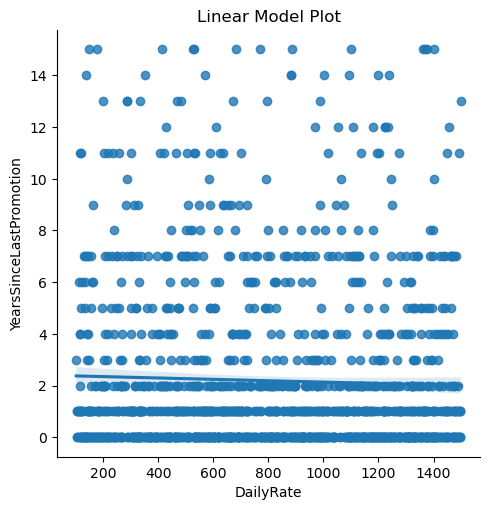

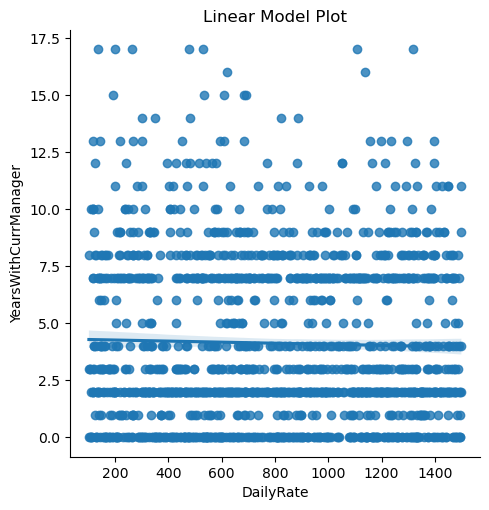

In [39]:
#checking linear relation of 'DailyRate' feature with other features 
log.append('DailyRate')#Appending feature
re()#calling function

**'DailyRate'** feature has **almost no linear relation** with the remaining features.  
**Data points** are **concentrated** around **2500 to 7000** on **y-axis** of **'MonthlyIncome'** feature  
**Data points** are **concentrated** around **0 to 10** on **y-axis** of **'TotalWorkingYears'** feature  
**Data points** are **concentrated** around **0 to 10** on **y-axis** of **'YearsAtCompany'** feature

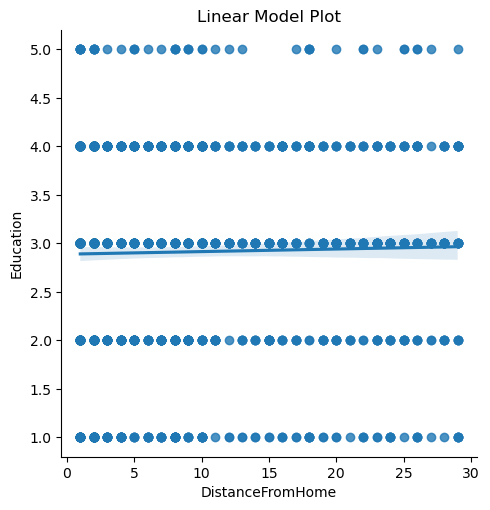

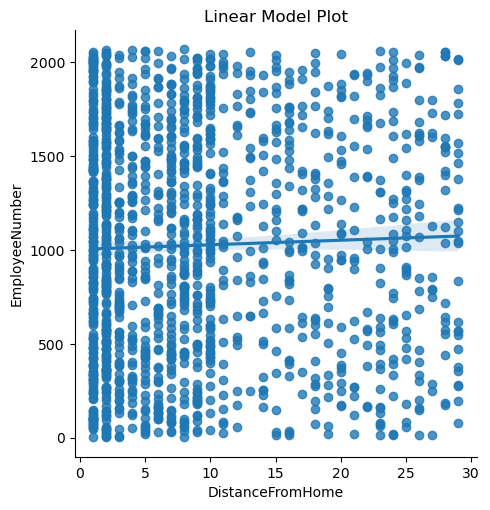

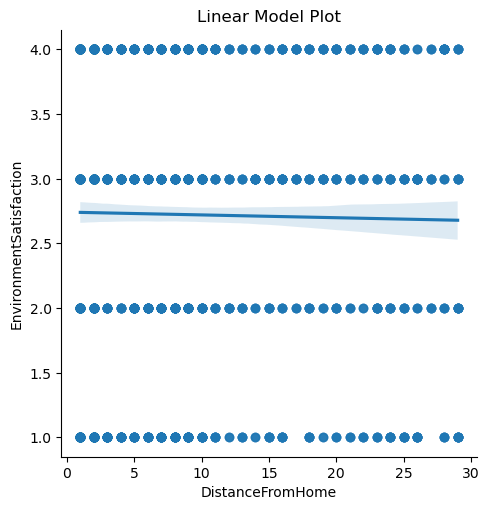

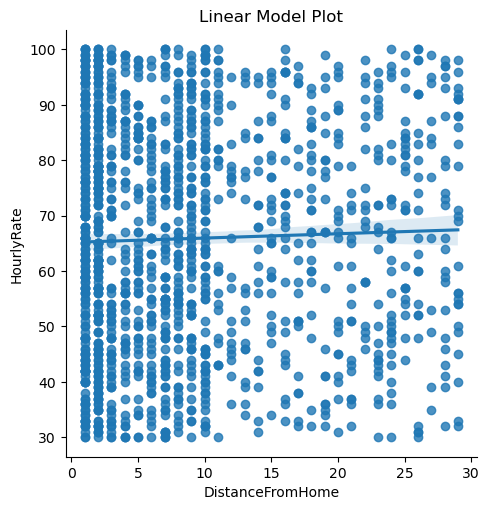

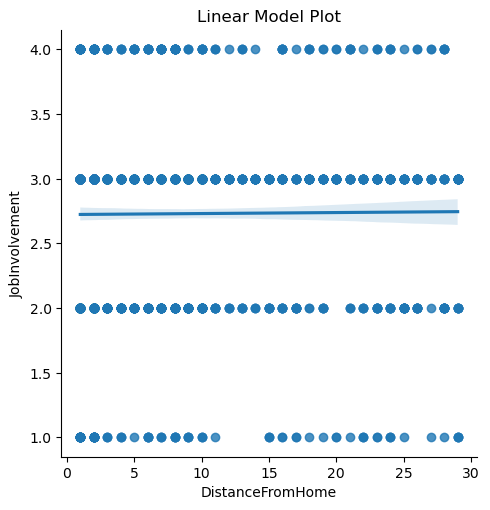

...

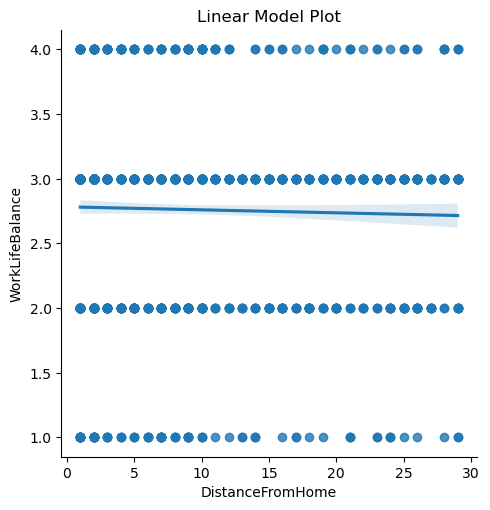

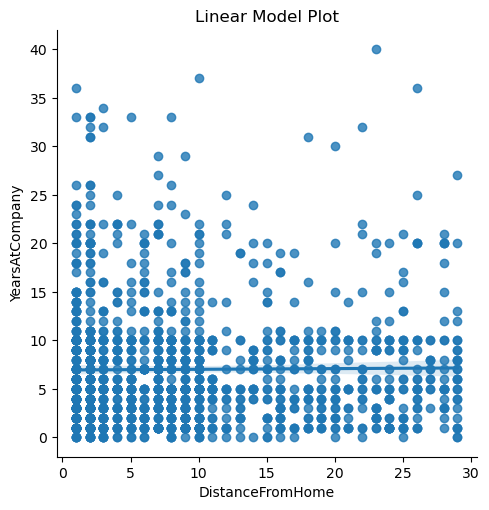

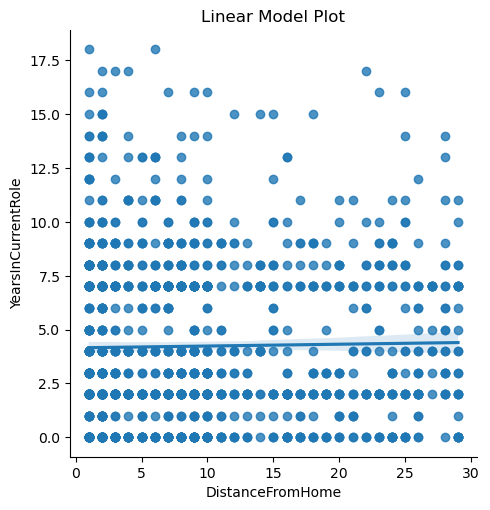

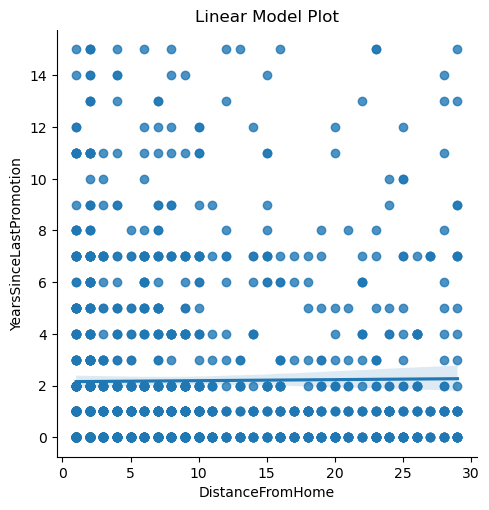

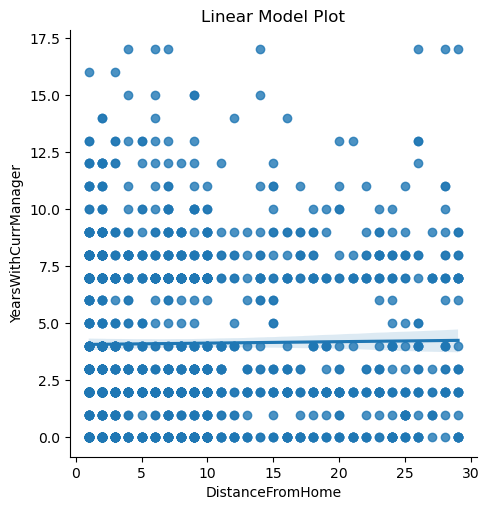

In [40]:
#checking linear relation of 'DistanceFromHome' feature with other features 
log.append('DistanceFromHome')#Appending feature
re()#calling function

**'DistanceFromHomes'** feature **has almost no linear relation** with the remaining features.  
**Data points** are **concentrated** around **0 to 10** on **x-axis** of **'MonthlyRate'** feature.  
**Data points** are **concentrated** around **0 to 10** on **y-axis** of **'TotalWorkingYears'** feature.  
**Data points** are **concentrated** around **0 to 10** on **y-axis** of **'YearsAtCompany'** feature.  
**Data points** are **concentrated** around **0 to 10** on **x-axis** of **'HourlyRate'** feature.  
**Data points** are **concentrated** around **0 to 10** on **x-axis** of **'EmployeeNumber'** feature. 

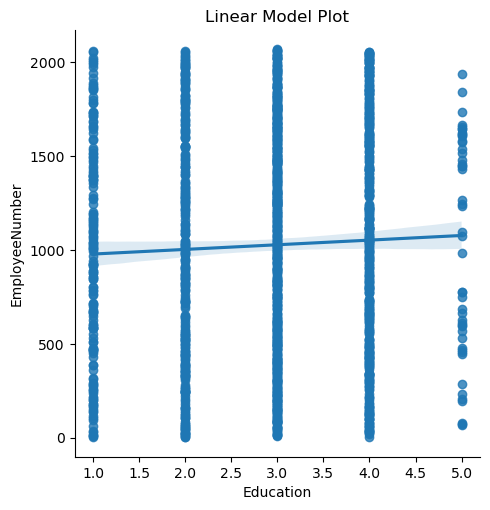

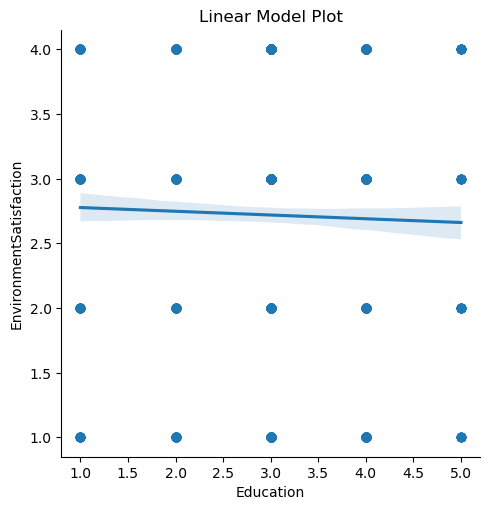

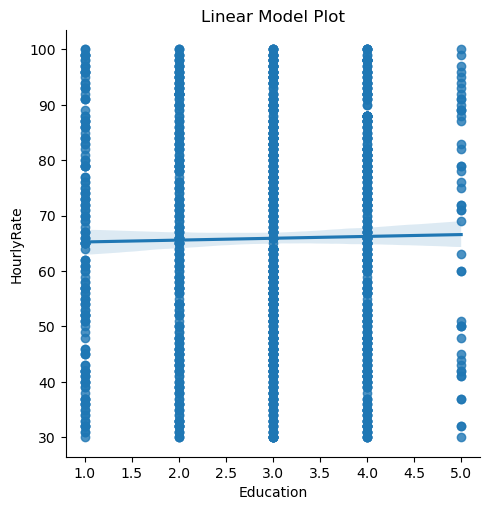

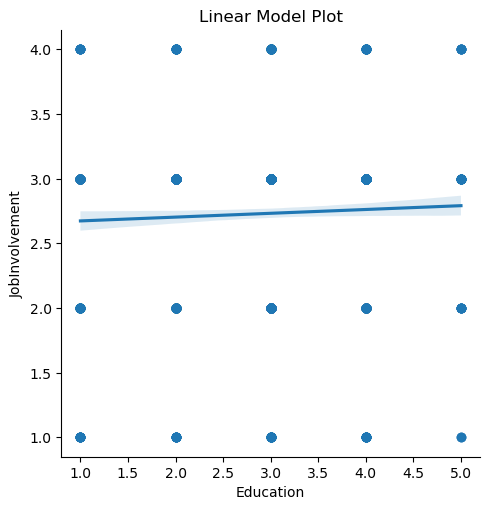

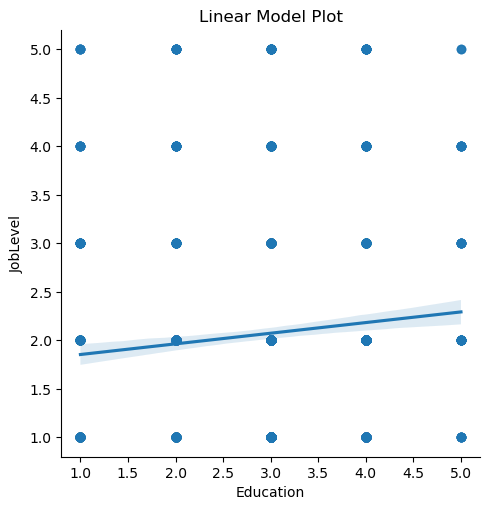

...

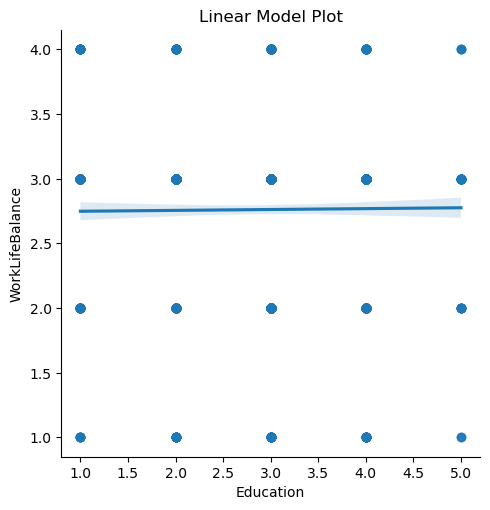

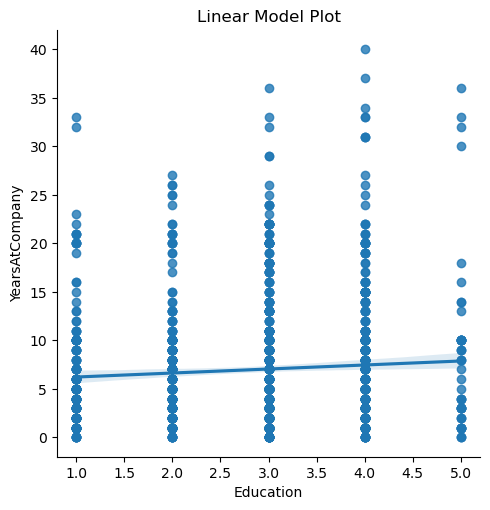

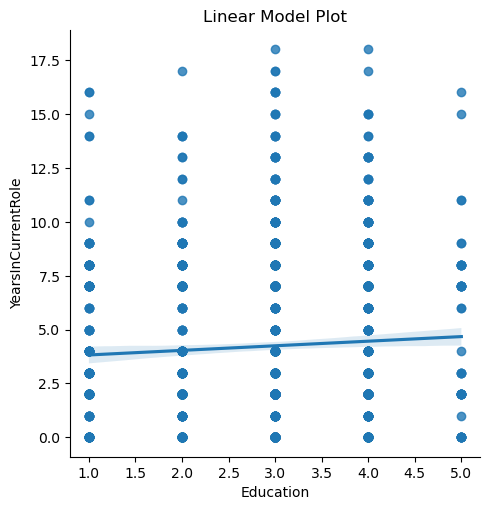

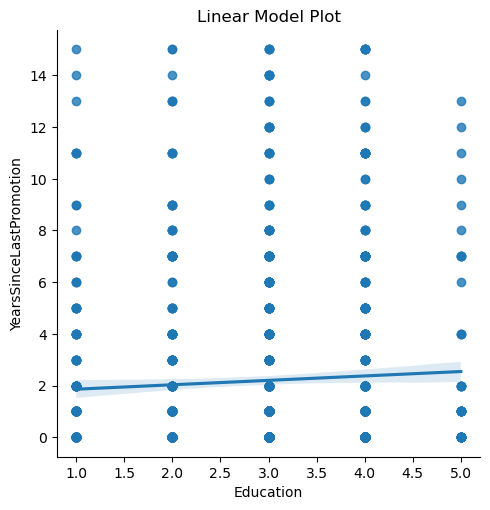

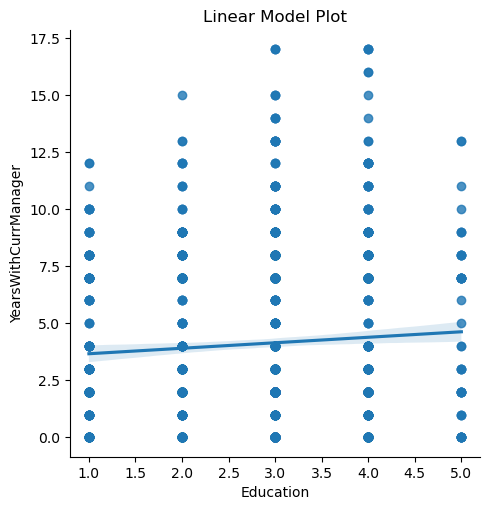

In [41]:
#checking linear relation of 'Education' feature with other features 
log.append('Education')#Appending feature
re()#calling function

**'Education'** feature has **low positive linear relation** with **'TotalWorkingYears','YearsAtCompany' and 'YearsWithCurrManager'** features.  
**'Education'** feature has **has almost no linear relation** with the remaining features. 

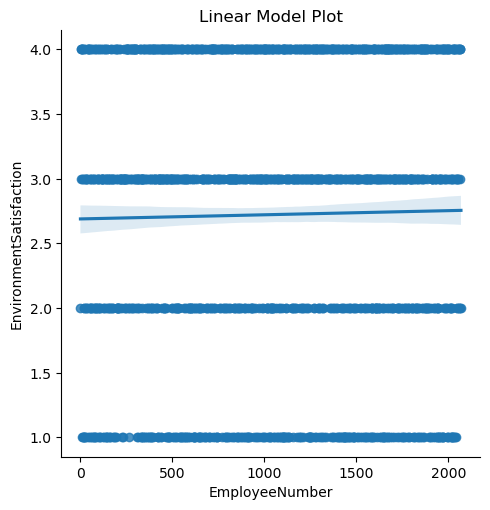

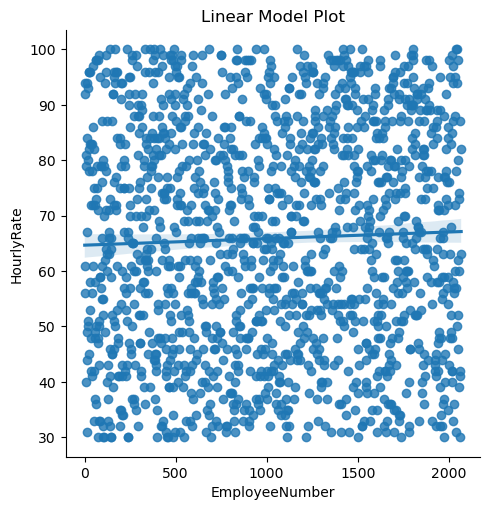

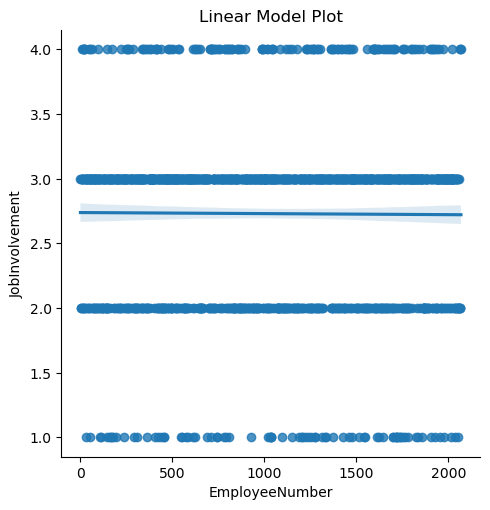

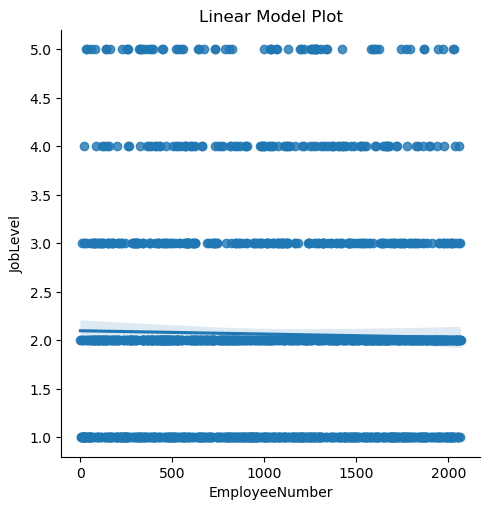

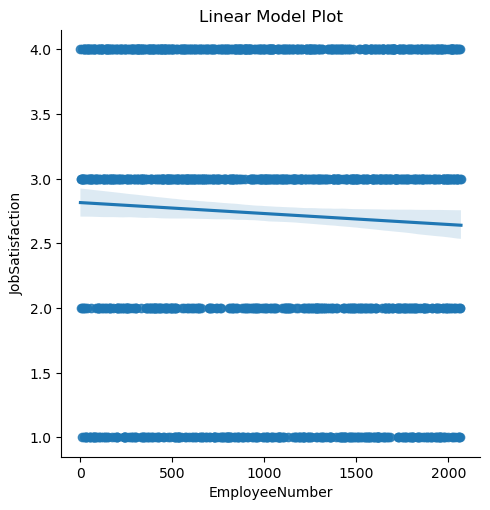

...

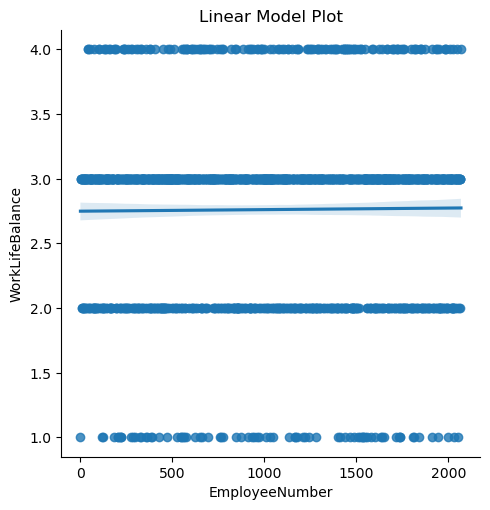

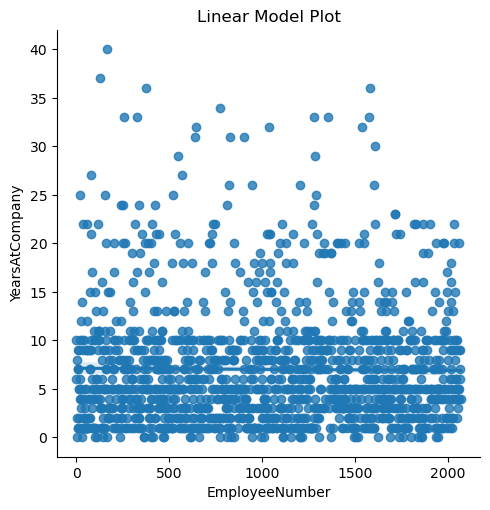

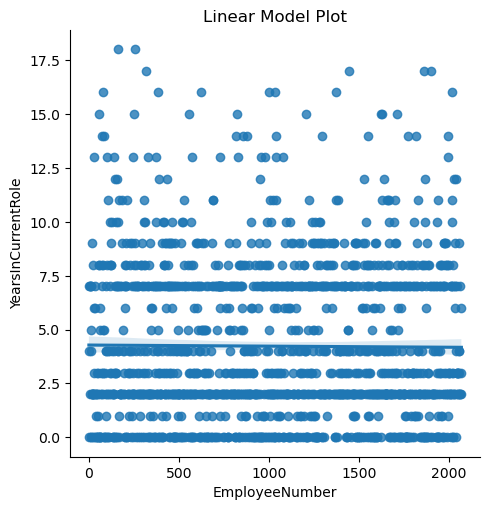

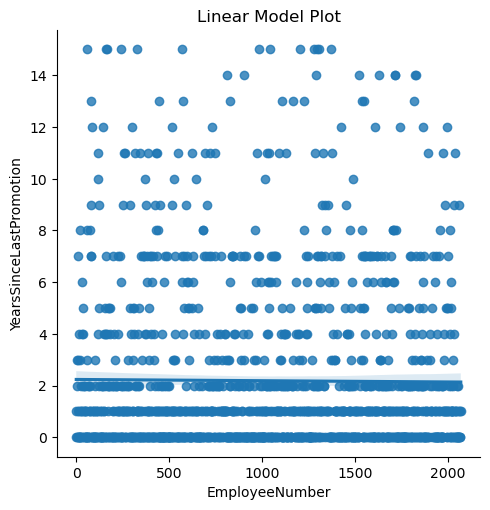

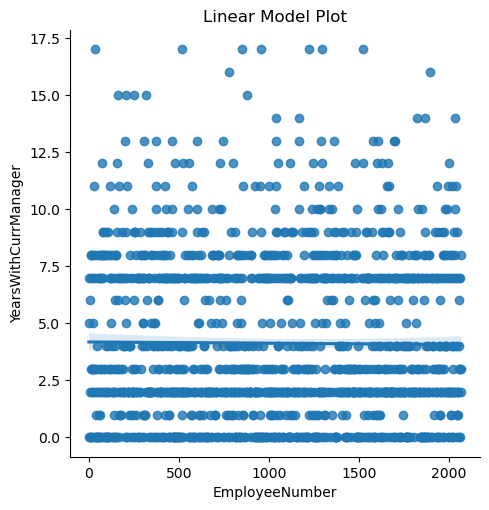

In [42]:
#checking linear relation of 'EmployeeNumber' feature with other features 
log.append('EmployeeNumber')#Appending feature
re()#calling function

**'EmployeeNumber'** feature has **has almost no linear relation** with the remaining features.  
**Data points** are **concentrated** around **2500 to 7500** on **y-axis** of **'MonthlyIncome'** feature.  
**Data points** are **concentrated** around **0 to 10** on **y-axis** of **'TotalWorkingYears'** feature.  
**Data points** are **concentrated** around **0 to 10** on **y-axis** of **'YearsAtCompany'** feature.  
**Data points** are **concentrated** around **0 to 2** on **y-axis** of **'YearsSincePromotion'** feature.

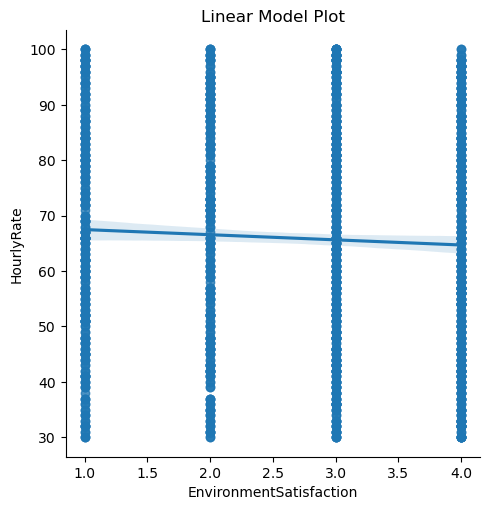

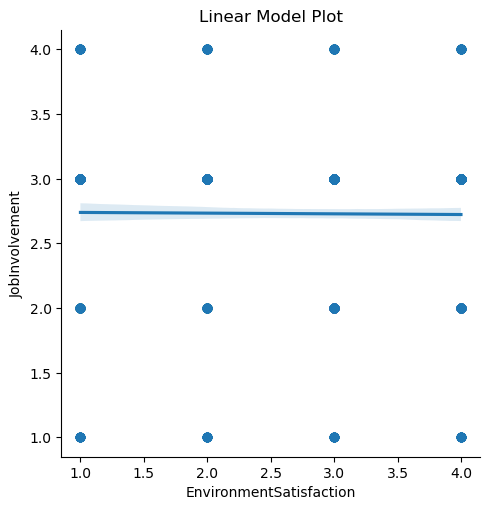

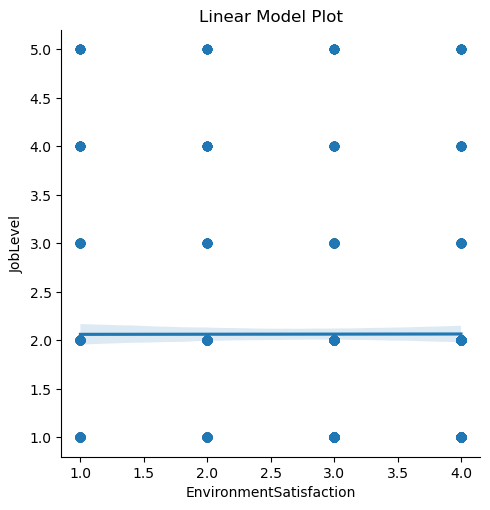

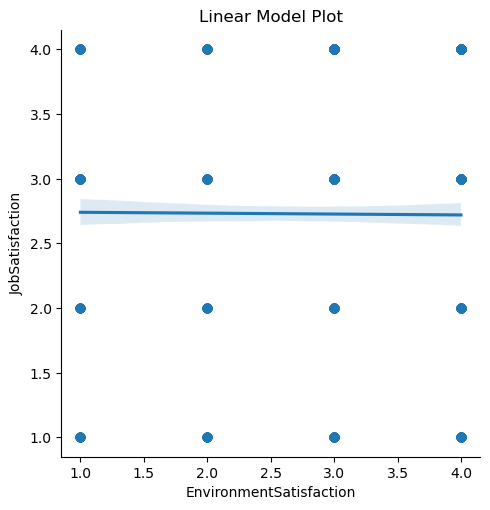

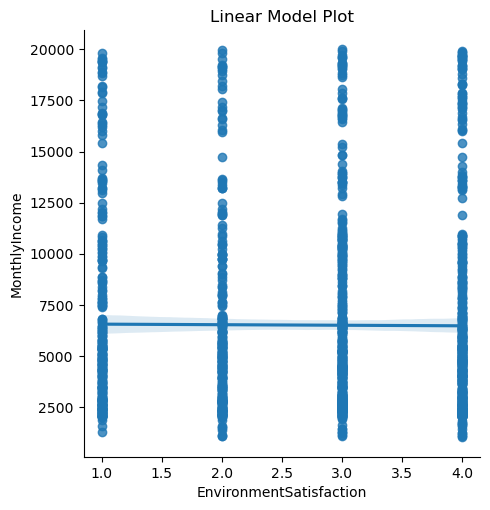

...

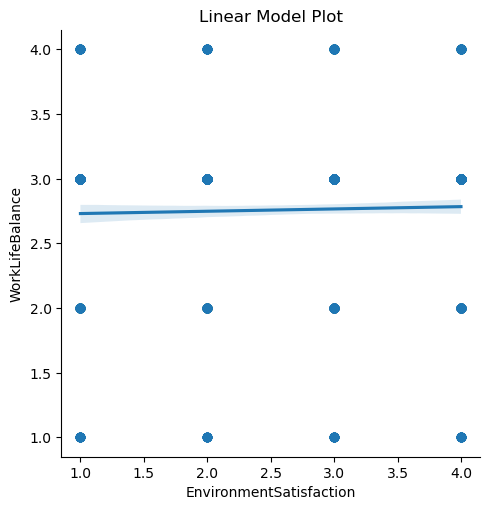

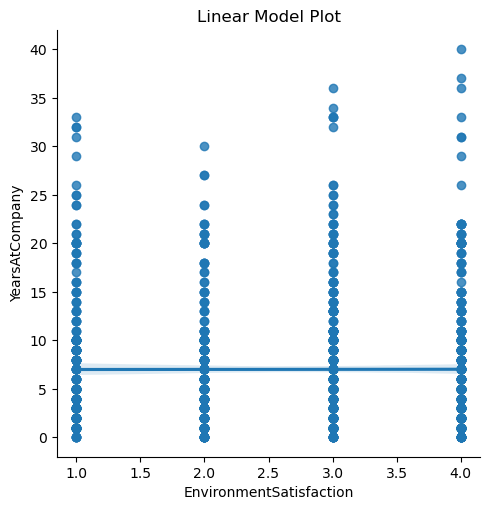

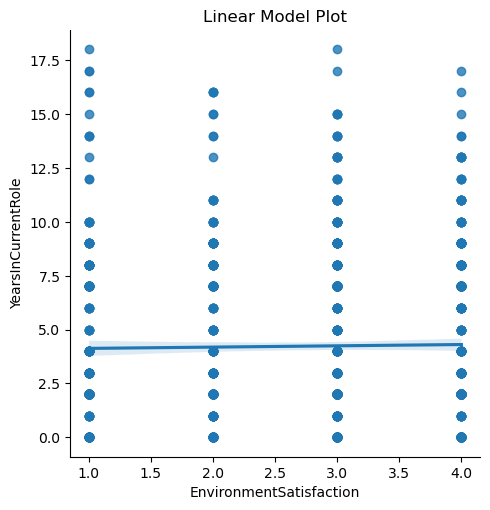

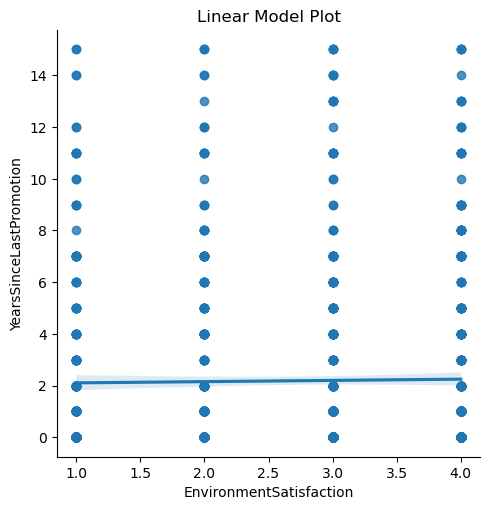

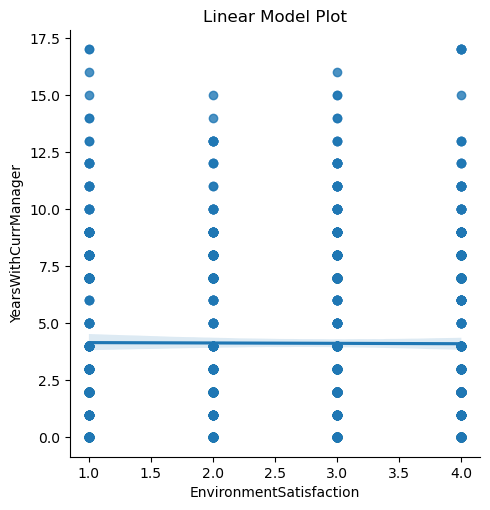

In [43]:
#checking linear relation of 'EnvironmentSatisfaction' feature with other features 
log.append('EnvironmentSatisfaction')#Appending feature
re()#calling function

**'EnvironmentSatisfaction'** feature has **has almost no linear relation** with the remaining features.  

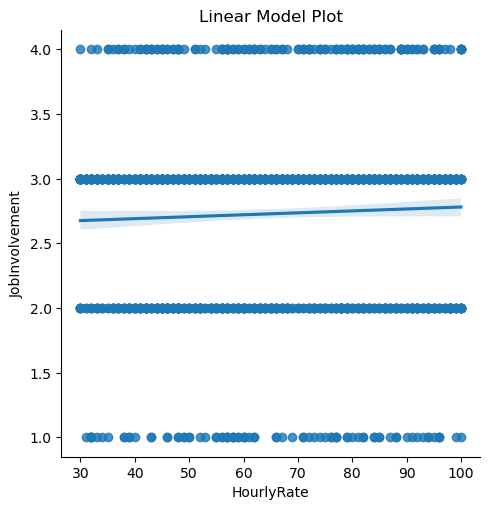

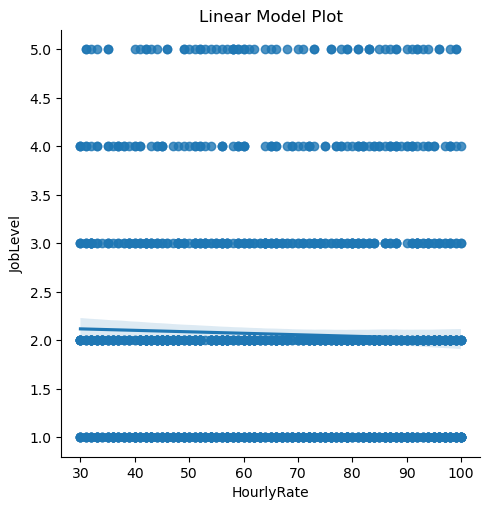

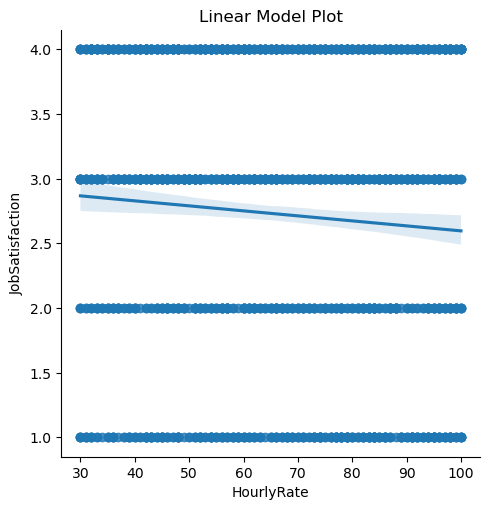

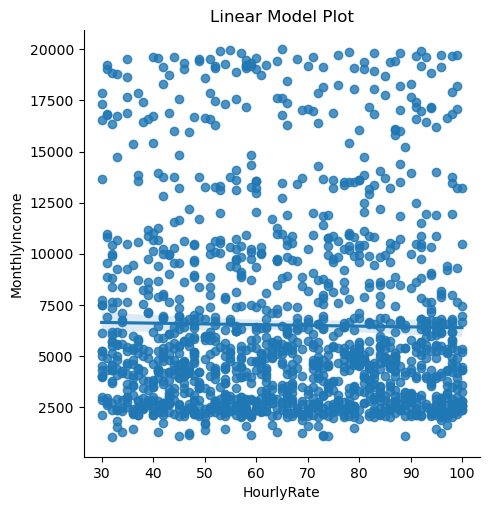

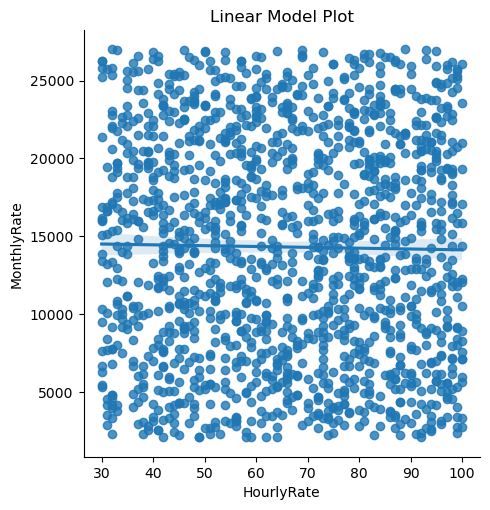

...

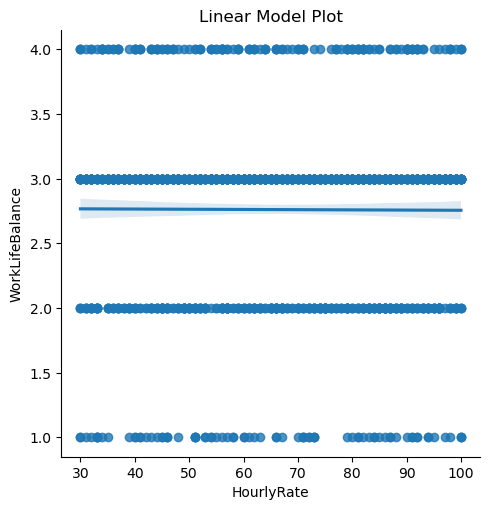

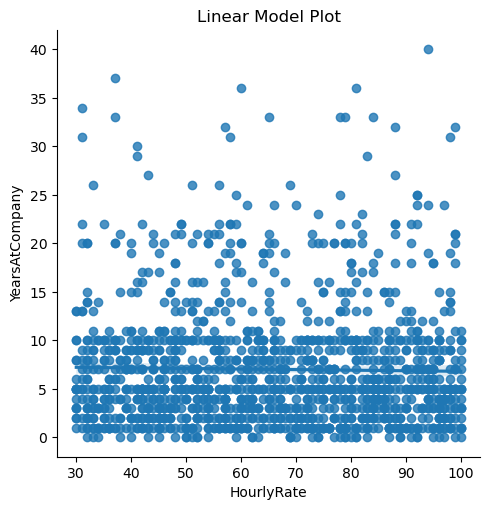

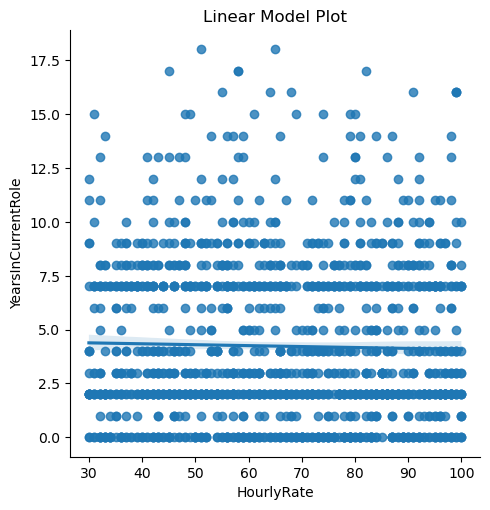

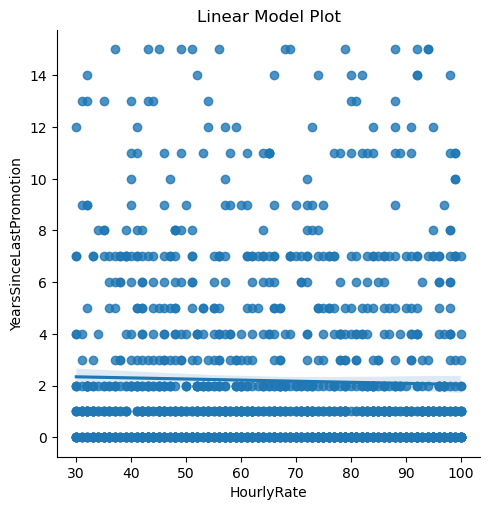

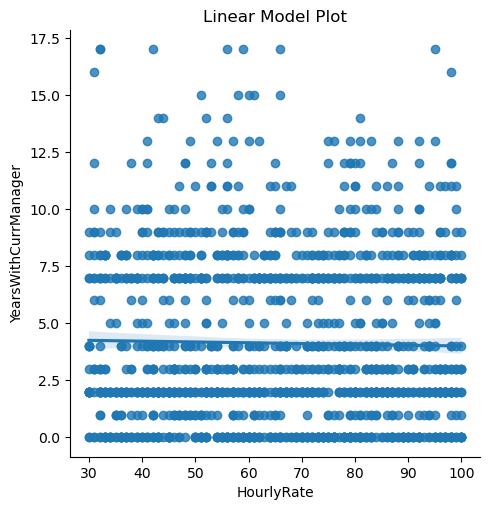

In [44]:
#checking linear relation of 'HourlyRate' feature with other features 
log.append('HourlyRate')#Appending feature
re()#calling function

**'HourlyRate'** feature has **has almost no linear relation** with the remaining features.  
**Data points** are **concentrated** around **2500 to 7500** on **y-axis** of **'MonthlyIncome'** feature.  
**Data points** are **concentrated** around **0 to 10** on **y-axis** of **'TotalWorkingYears'** feature.  
**Data points** are **concentrated** around **0 to 10** on **y-axis** of **'YearsAtCompany'** feature.  
**Data points** are **concentrated** around **0 to 2** on **y-axis** of **'YearsSincePromotion'** feature.

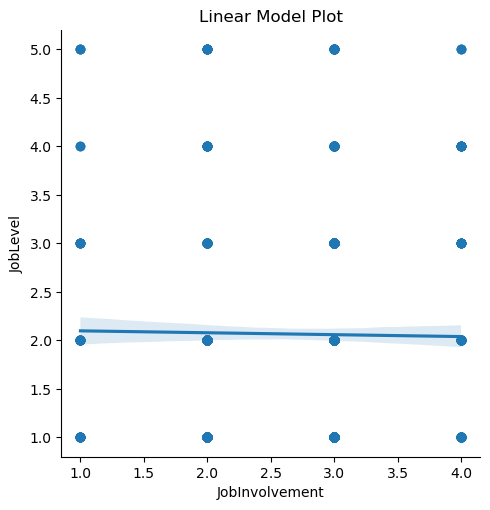

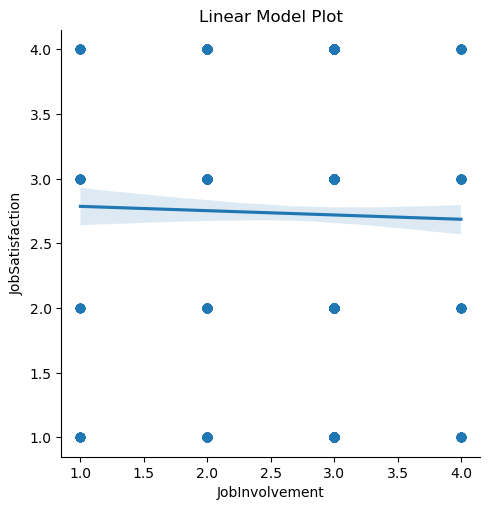

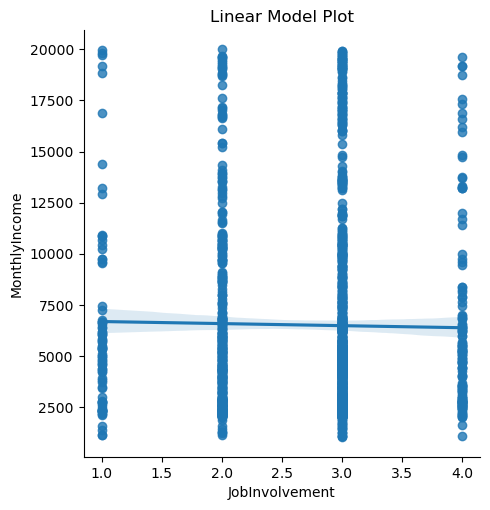

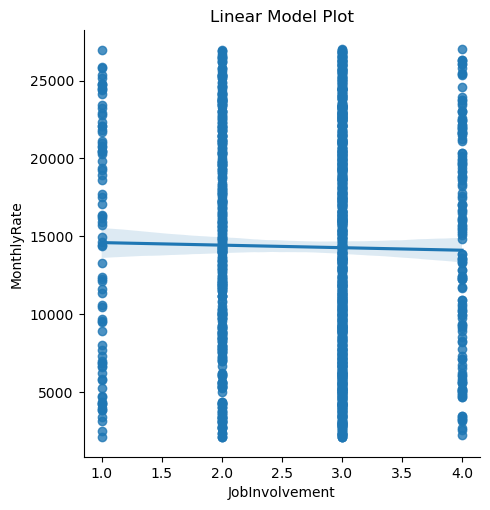

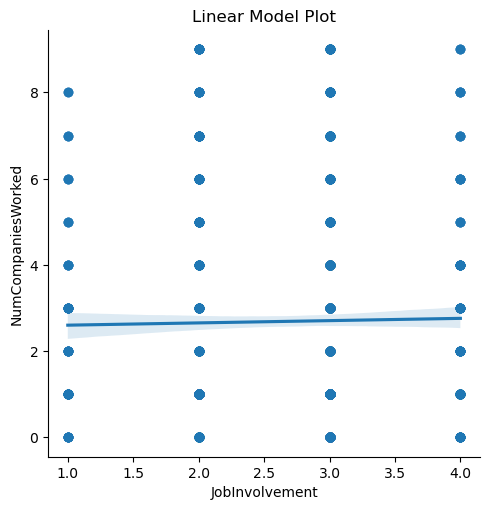

...

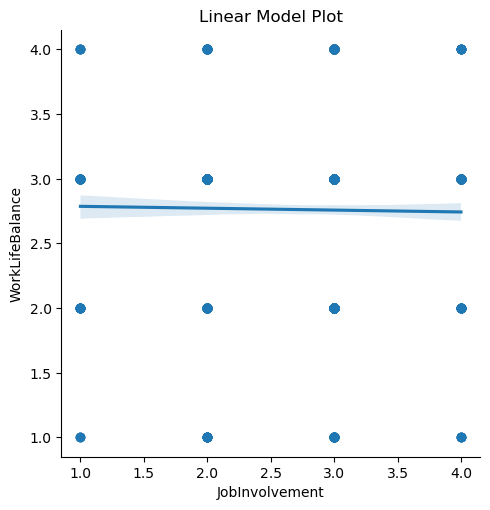

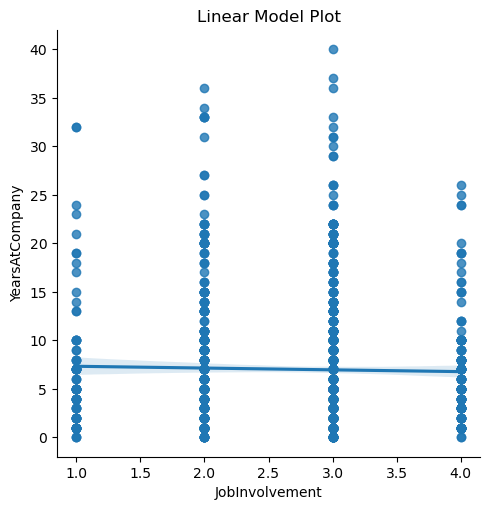

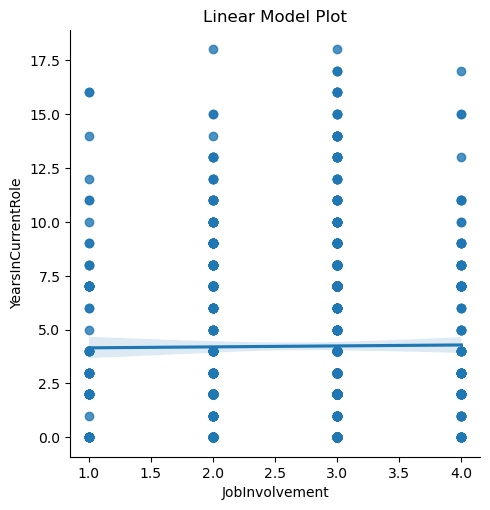

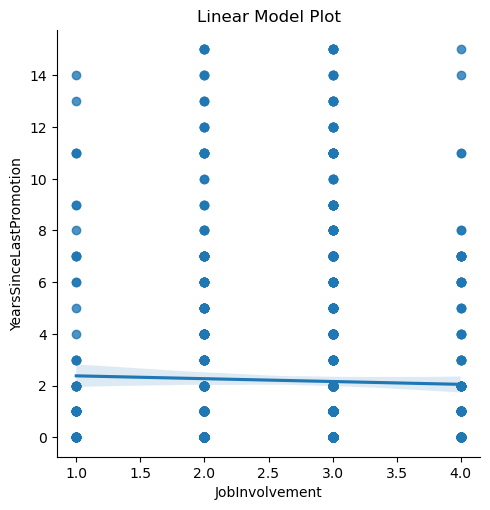

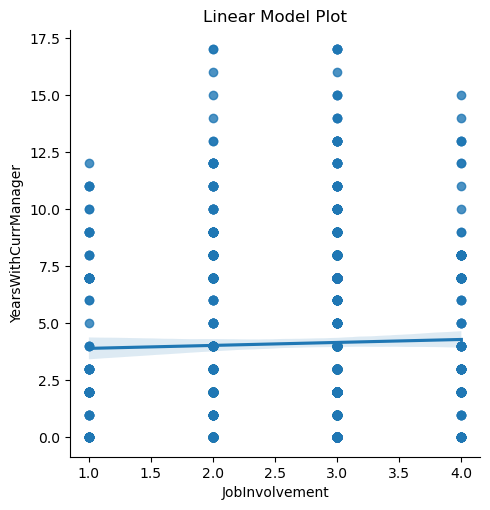

In [45]:
#checking linear relation of 'JobInvolvement' feature with other features 
log.append('JobInvolvement')#Appending feature
re()#calling function

**'JobInvolvement'** feature has **has almost no linear relation** with the remaining features.  

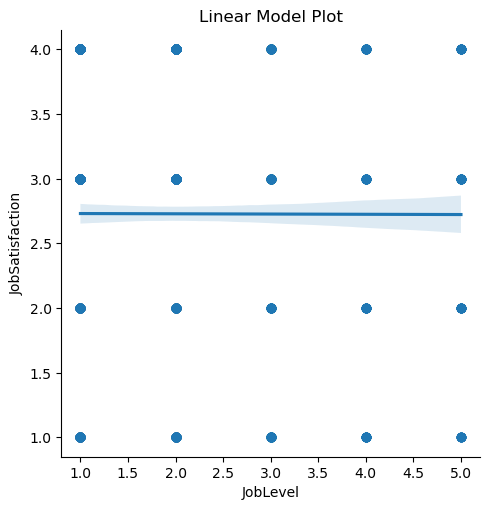

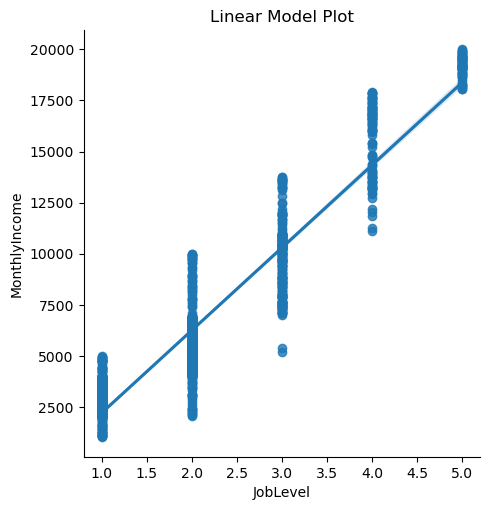

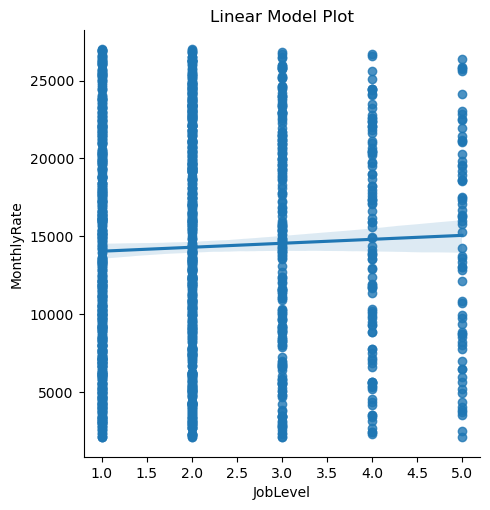

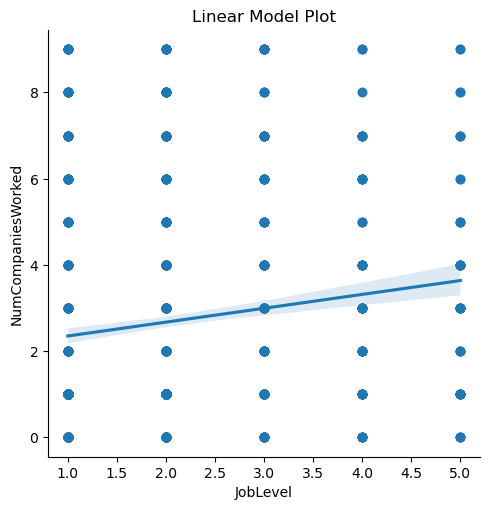

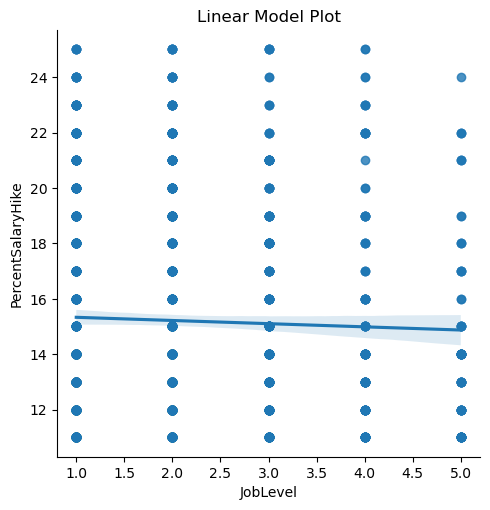

...

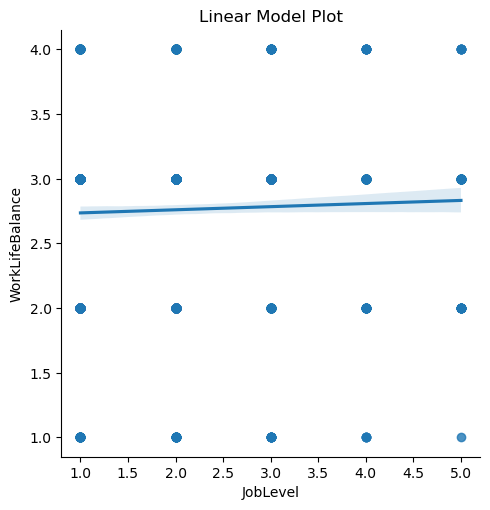

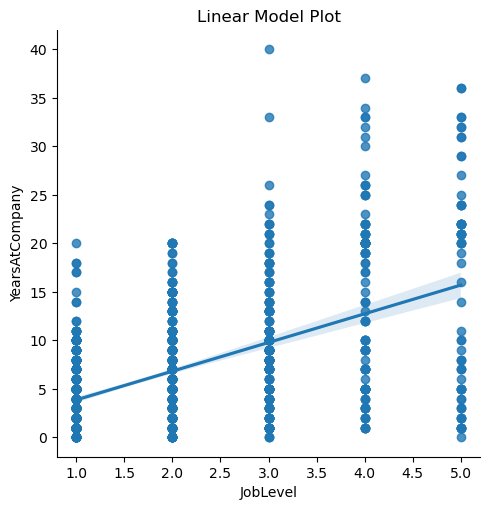

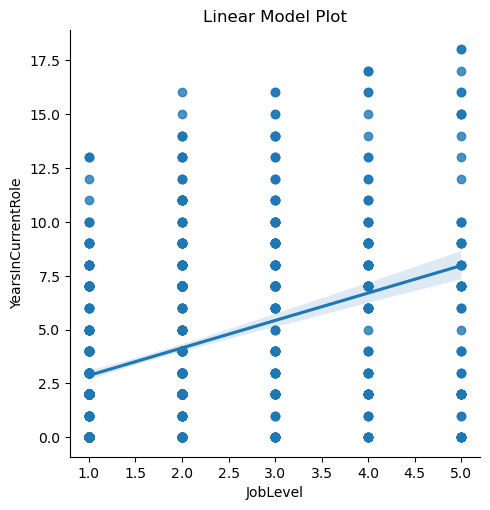

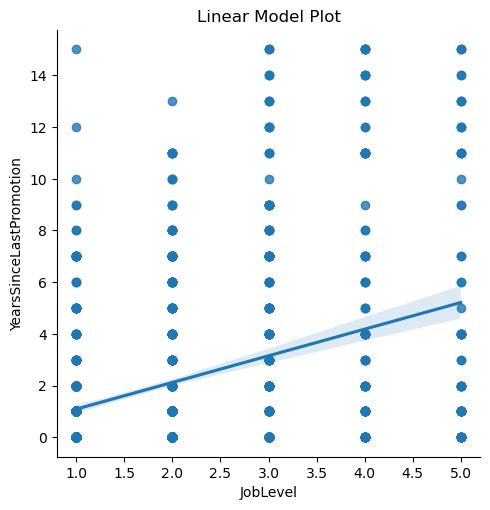

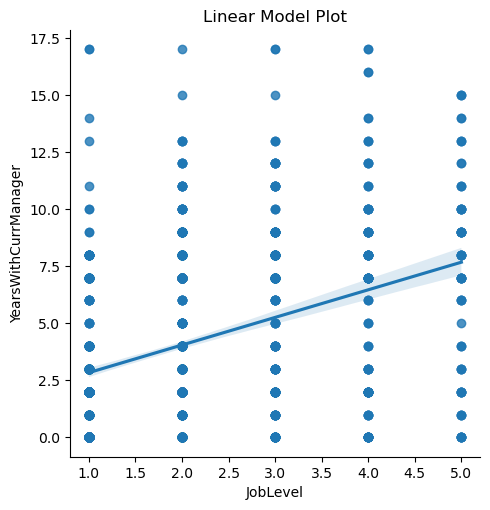

In [46]:
#checking linear relation of 'JobLevel' feature with other features 
log.append('JobLevel')#Appending feature
re()#calling function

**'JobInvolvement'** feature has **high positive linear relation** with **'MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany' and 'YearsInCurrentRole'** features.  
**'JobInvolvement'** feature has **has almost no linear relation** with the remaining features.  

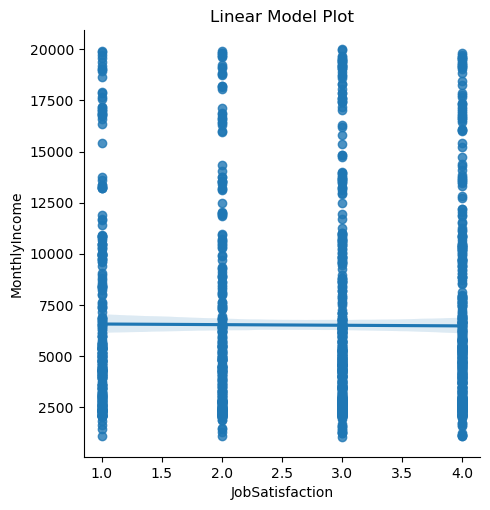

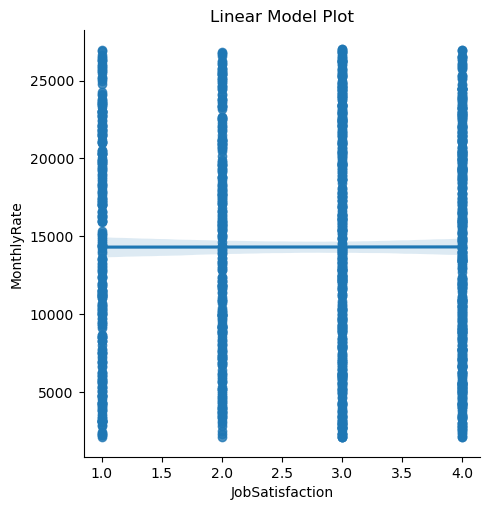

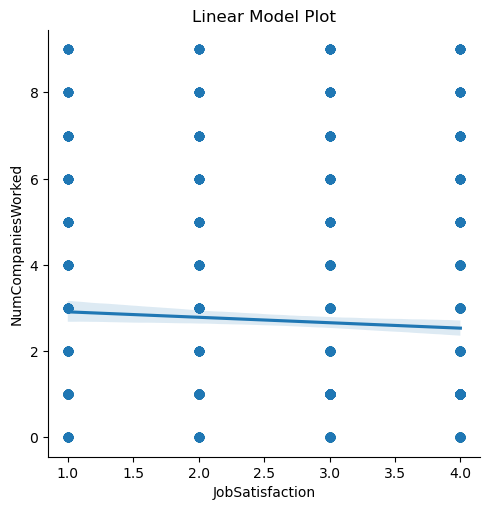

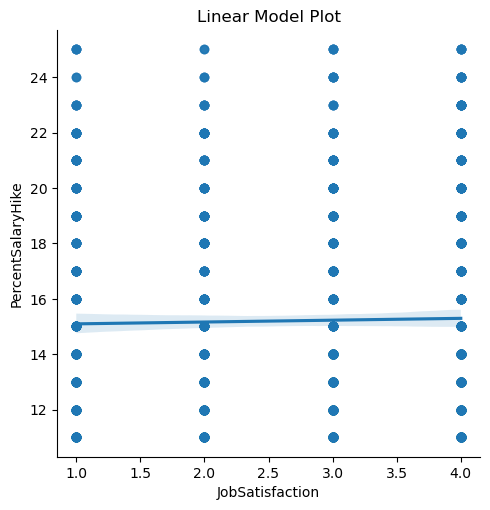

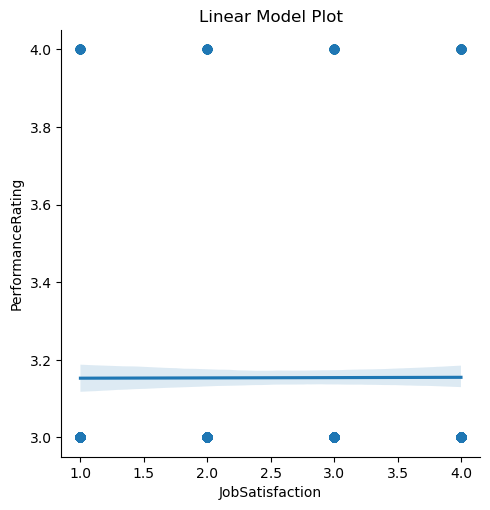

...

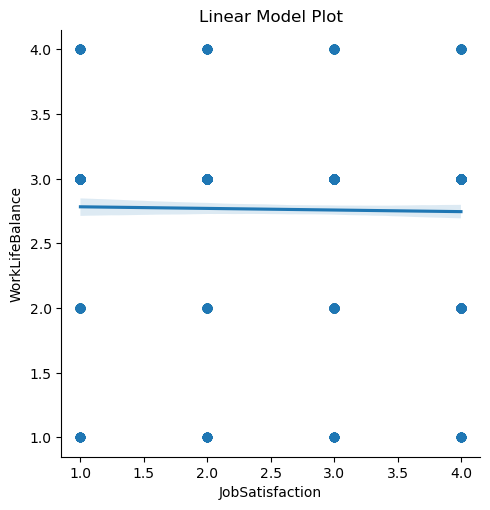

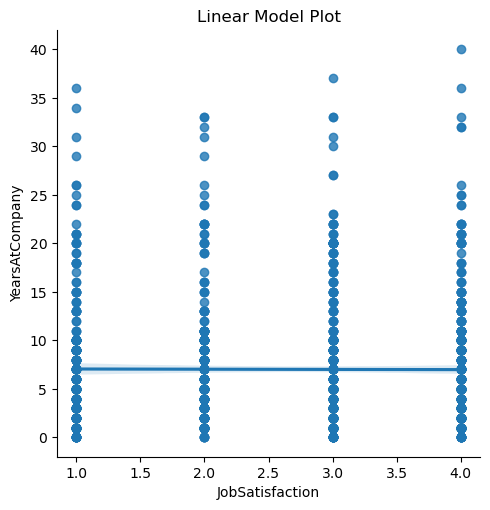

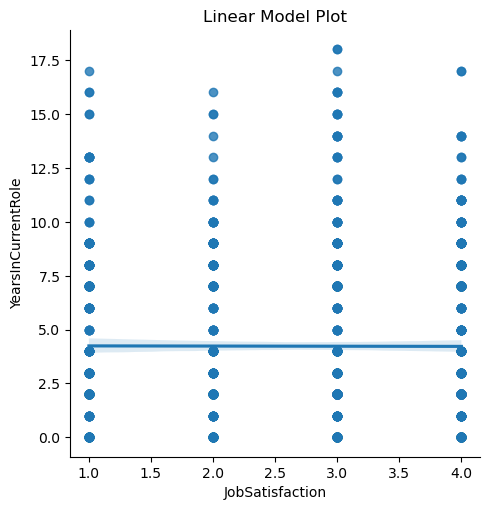

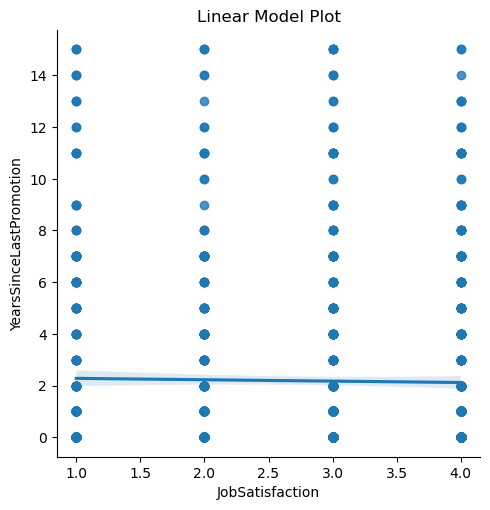

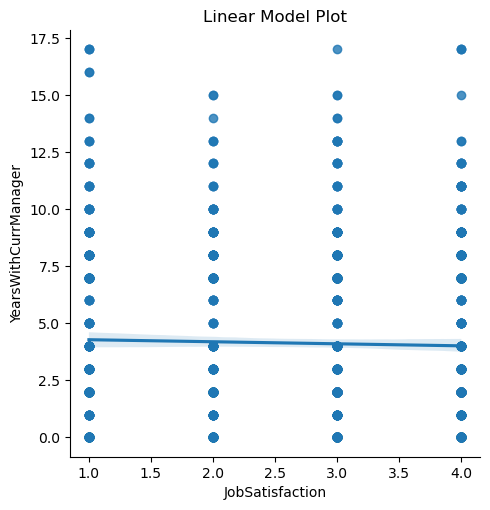

In [47]:
#checking linear relation of 'JobSatisfaction' feature with other features 
log.append('JobSatisfaction')#Appending feature
re()#calling function

**'JobSatisfaction'** feature has **has almost no linear relation** with the remaining features.

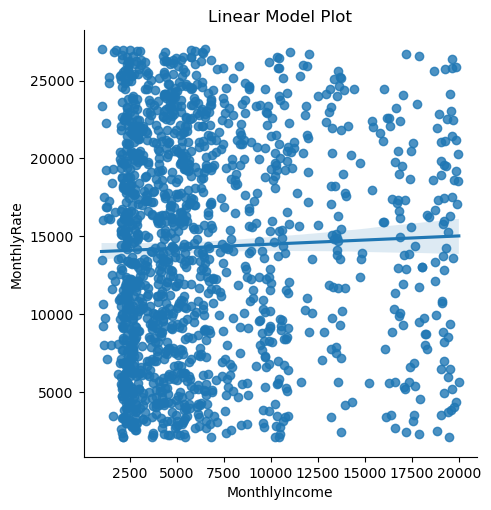

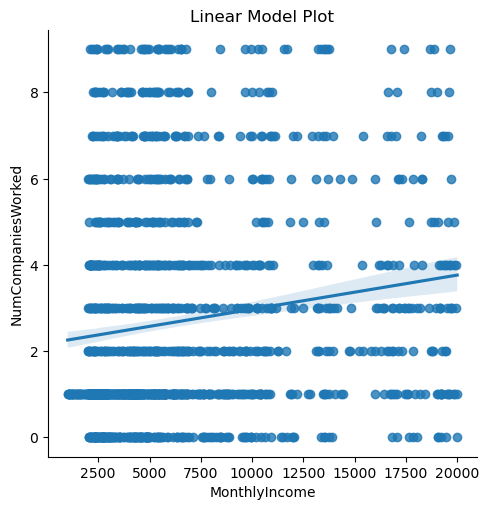

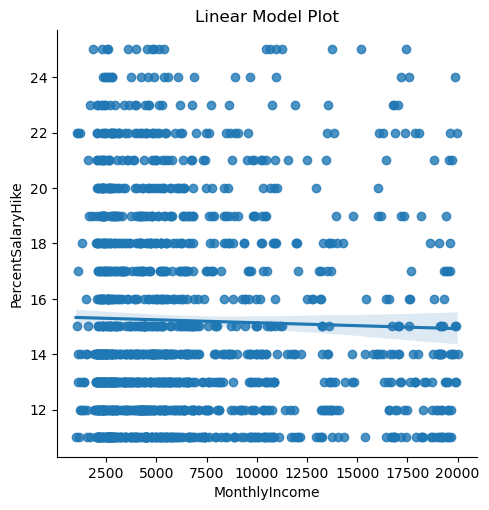

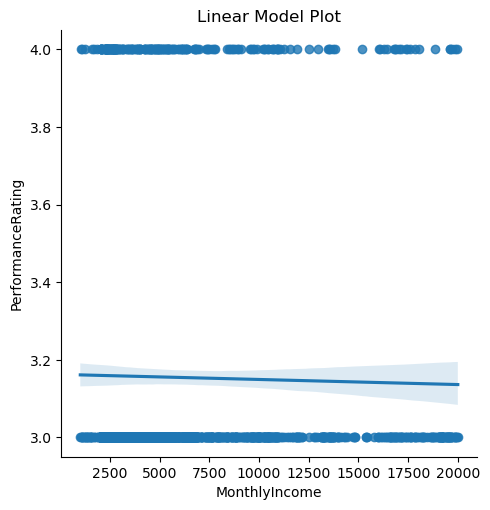

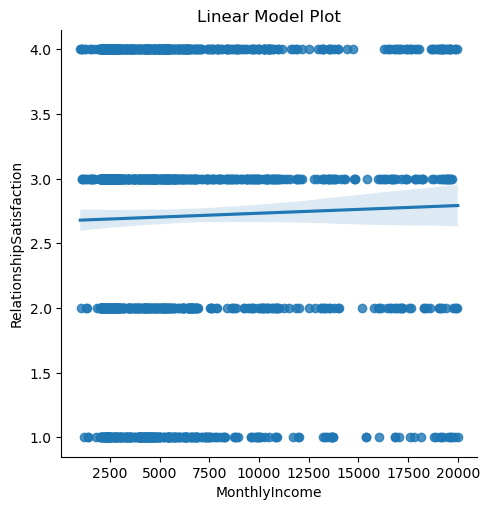

...

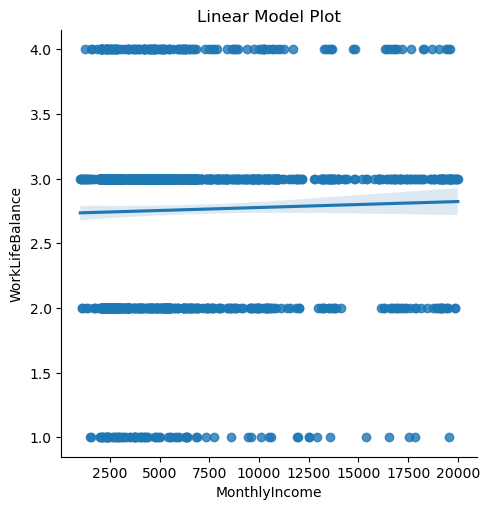

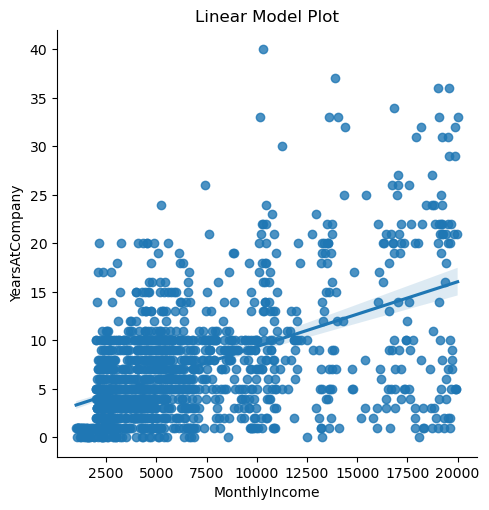

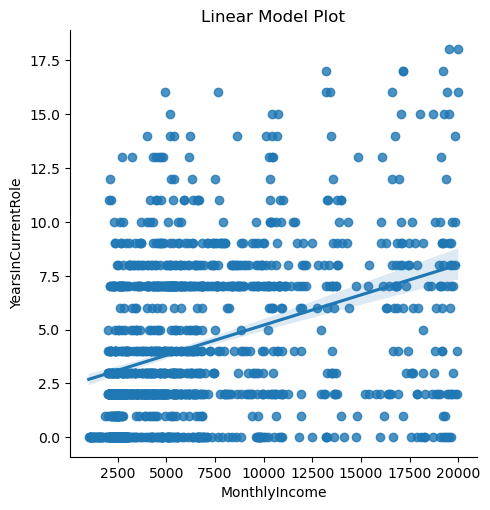

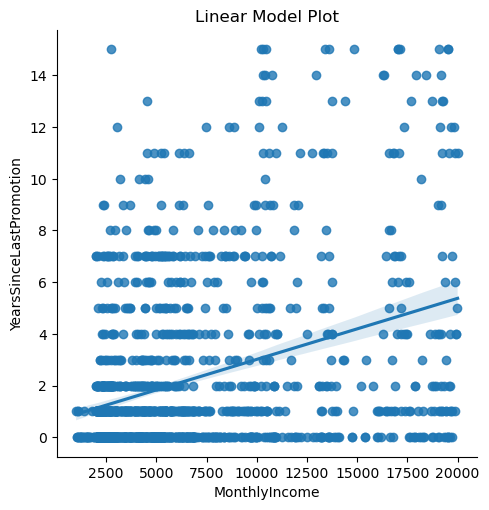

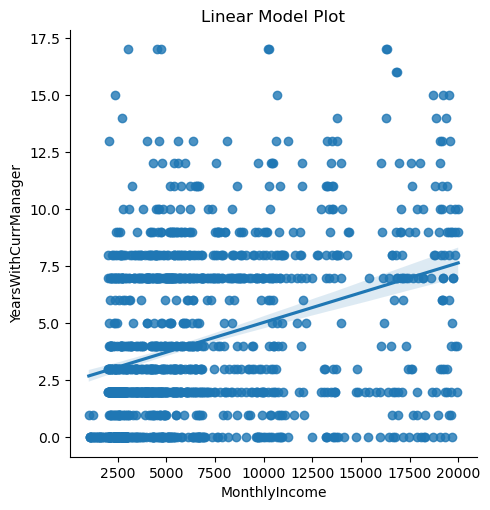

In [48]:
#checking linear relation of 'MonthlyIncome' feature with other features 
log.append('MonthlyIncome')#Appending feature
re()#calling function

**'MonthlyIncome'** feature has **high positive linear relation** with **'TotalWorkingYears', 'YearsAtCompany' and 'YearsSinceLastPromotion'** features.  
**'MonthlyIncome'** feature has **has almost no linear relation** with the remaining features.  
**Data points** are **concentrated** around **2500 to 7000** on **x-axis** of **'YearsAtCompany'** feature.  

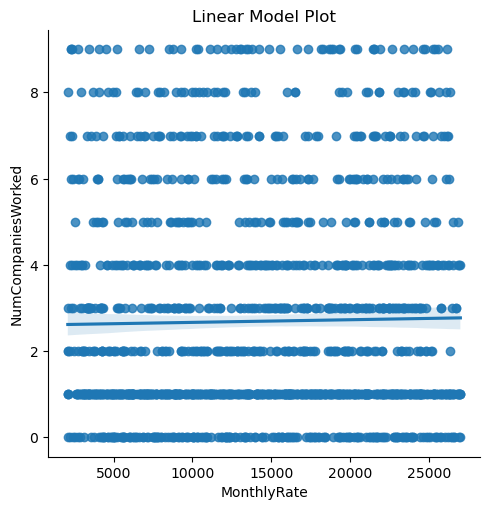

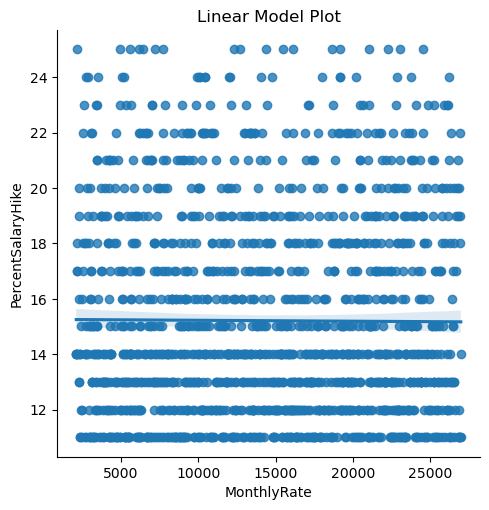

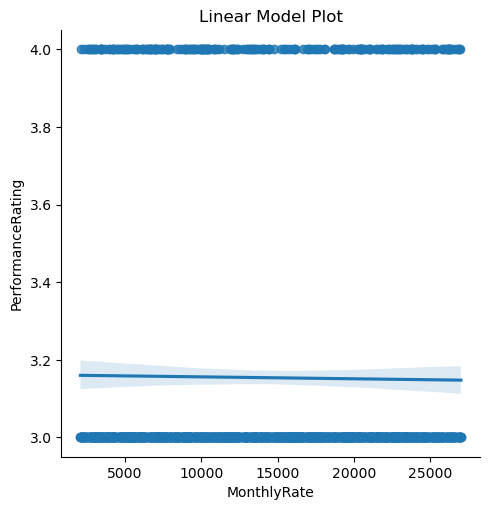

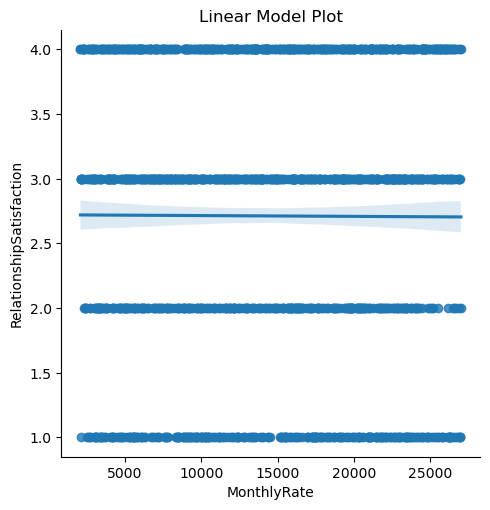

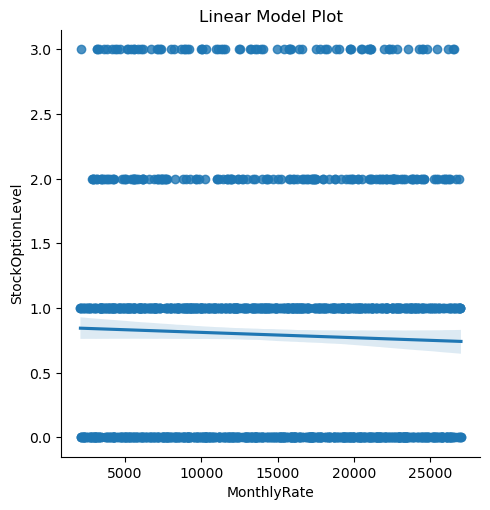

...

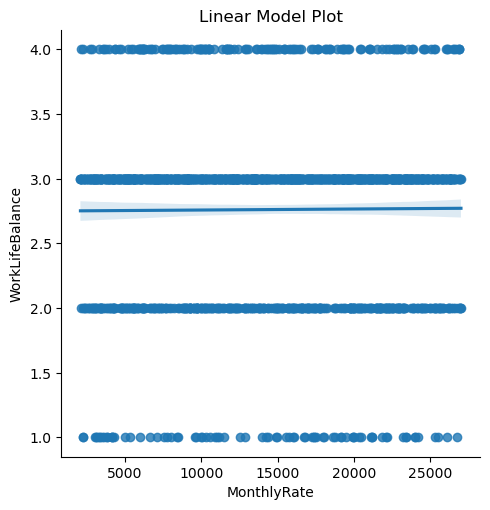

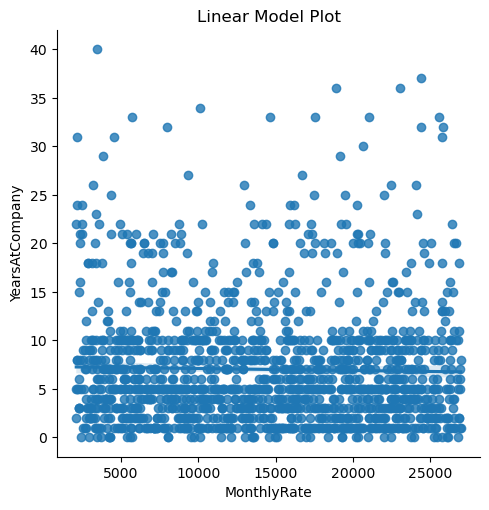

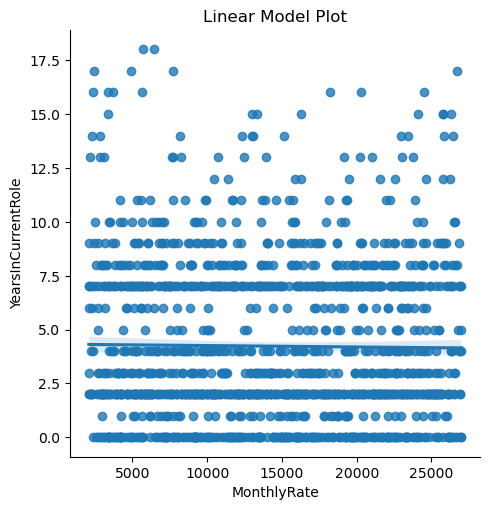

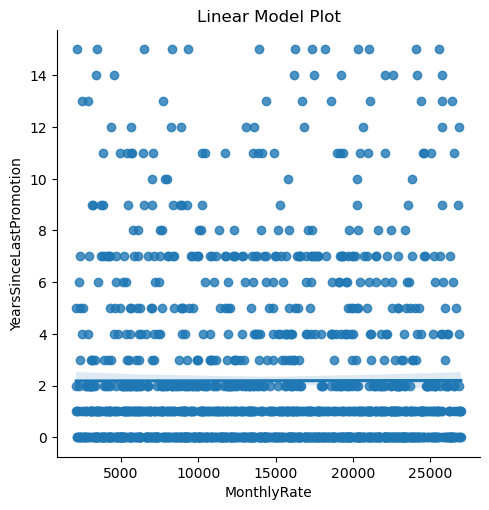

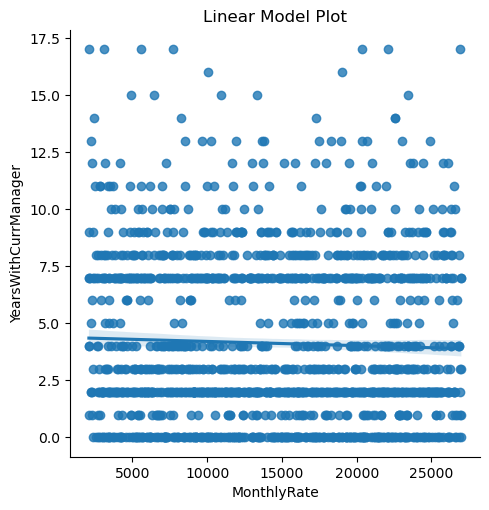

In [49]:
#checking linear relation of 'MonthlyRate' feature with other features 
log.append('MonthlyRate')#Appending feature
re()#calling function

**'MonthlyRate'** feature has **has almost no linear relation** with the remaining features.  
**Data points** are **concentrated** around **0 to 10** on **y-axis** of **'TotalWorkingYears'** feature.  
**Data points** are **concentrated** around **0 to 10** on **y-axis** of **'YearsAtCompany'** feature.

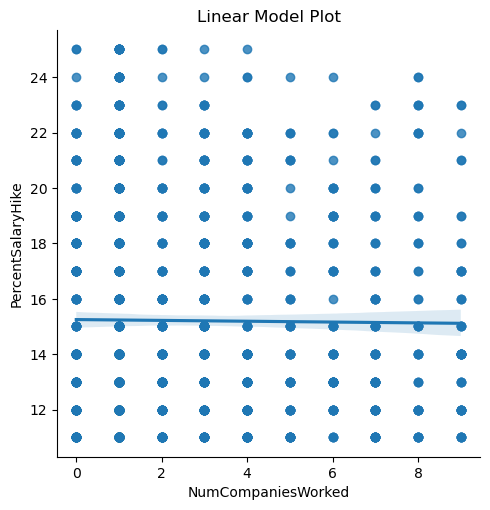

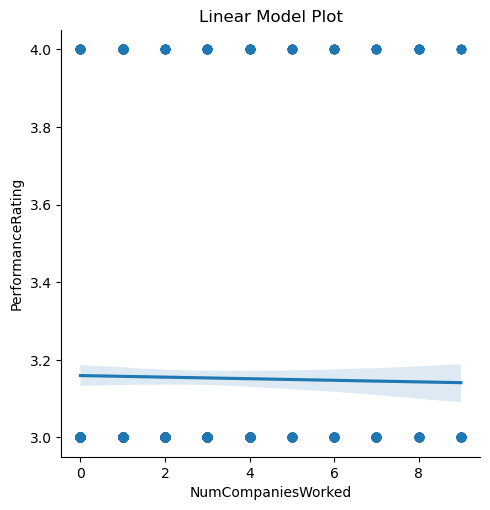

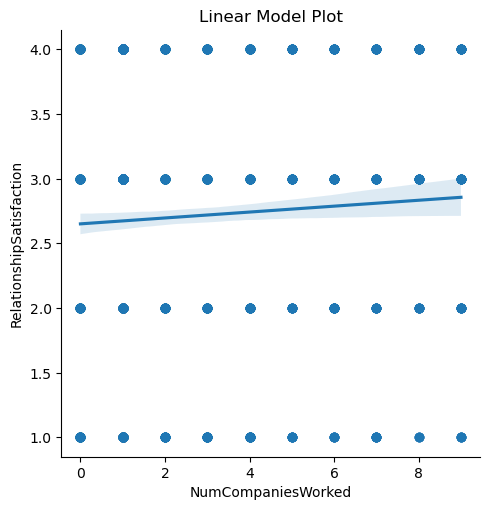

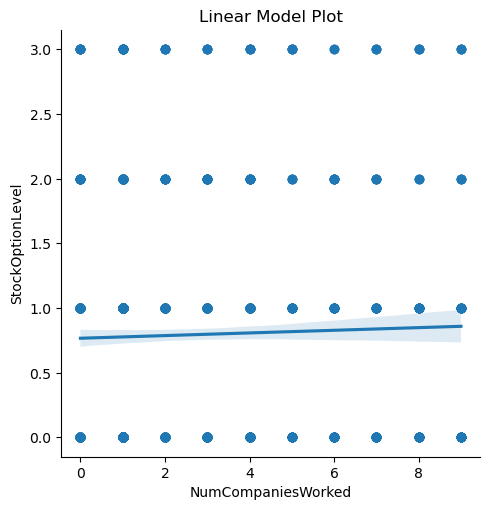

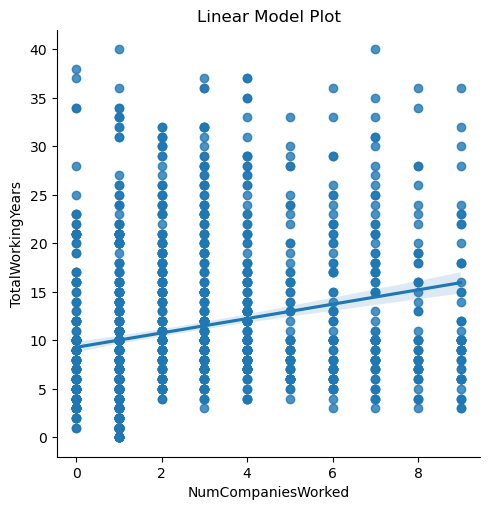

...

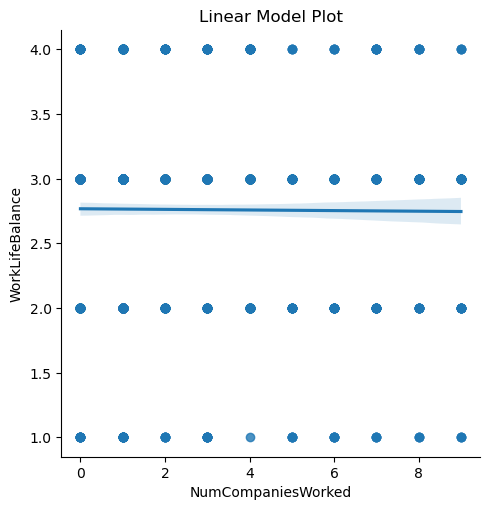

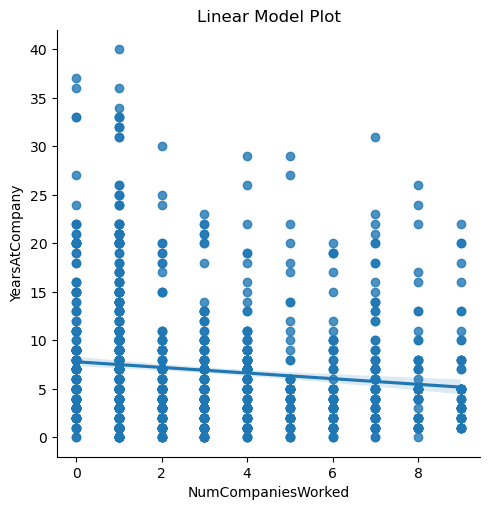

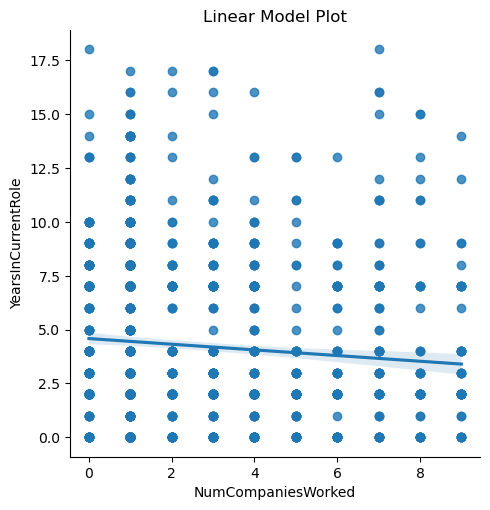

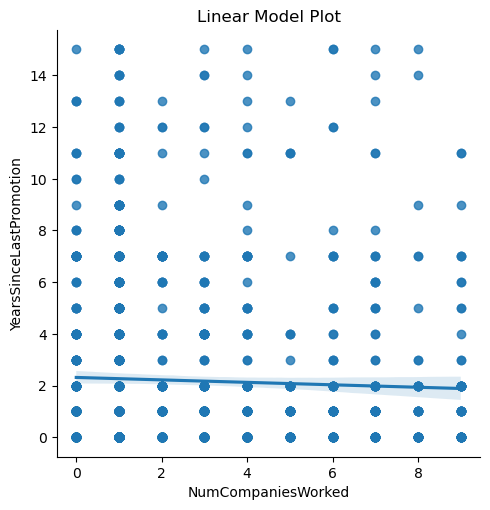

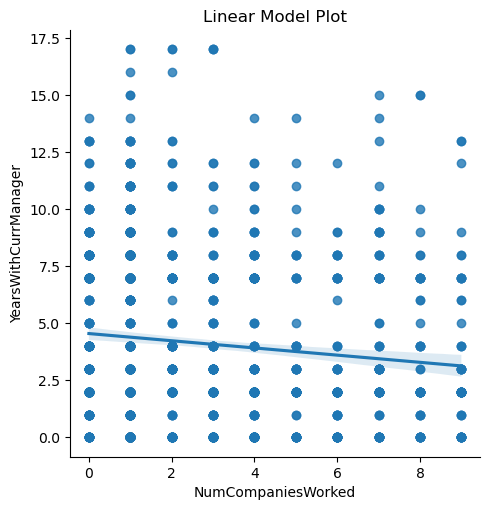

In [50]:
#checking linear relation of 'NumCompaniesWorked' feature with other features 
log.append('NumCompaniesWorked')#Appending feature
re()#calling function

**'NumCompaniesWorked'** feature has **low positive linear** relation with **'TotalWorkingYears'** feature.  
**'NumCompaniesWorked'** feature has **low negative linear** relation with **'YearsAtCompany**' feature.   
**'NumCompaniesWorked'** feature has **has almost no linear relation** with the **remaining features.**  

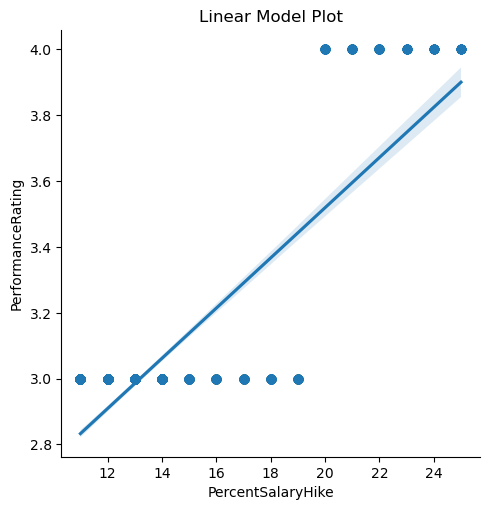

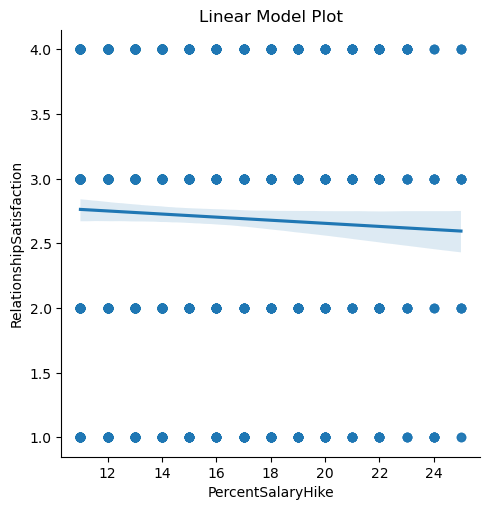

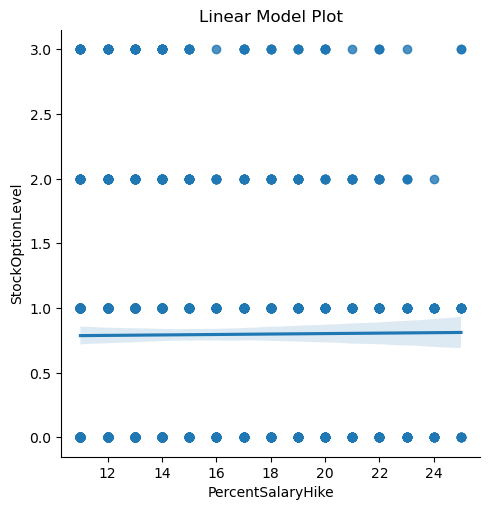

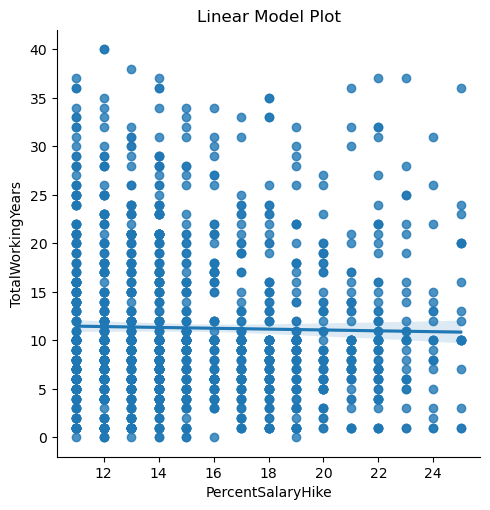

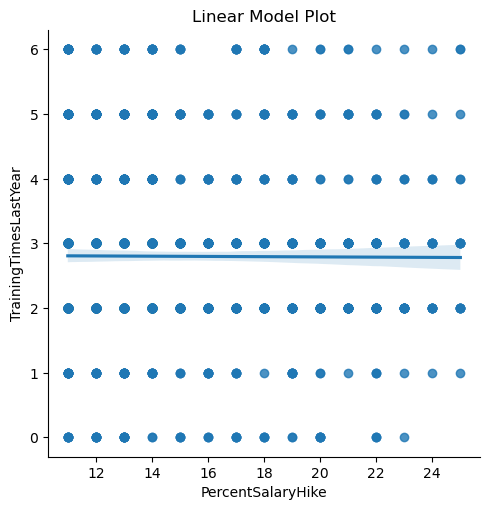

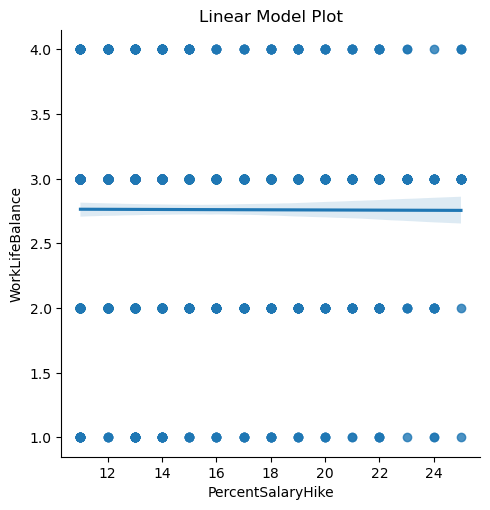

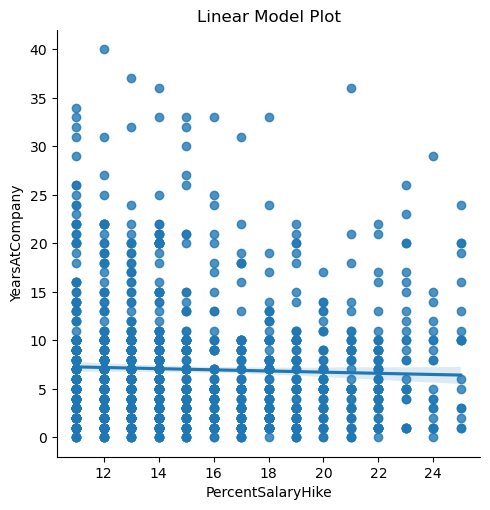

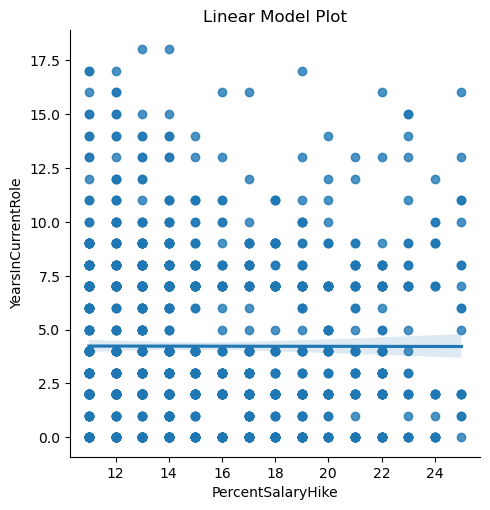

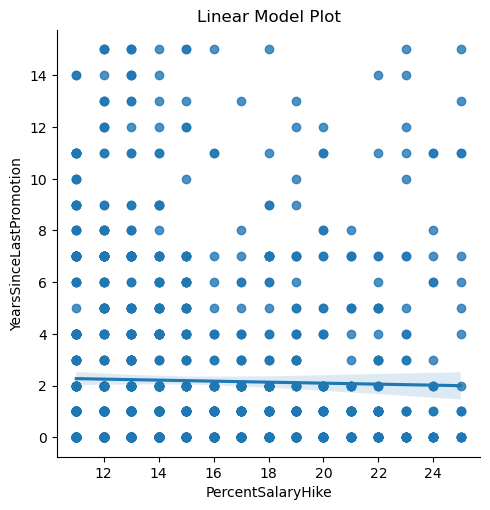

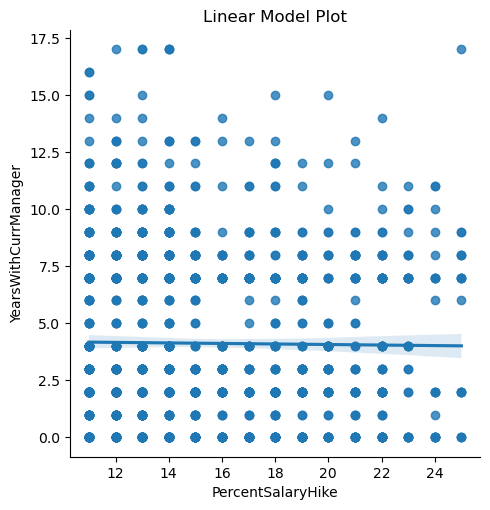

In [51]:
#checking linear relation of 'PercentSalaryHike' feature with other features 
log.append('PercentSalaryHike')#Appending feature
re()#calling function

**'PercentSalaryHike'** feature has **high positive linear** relation with **'PerformanceRating'** feature.    
**'PercentSalaryHike'** feature has **has almost no linear relation** with the **remaining features.**  

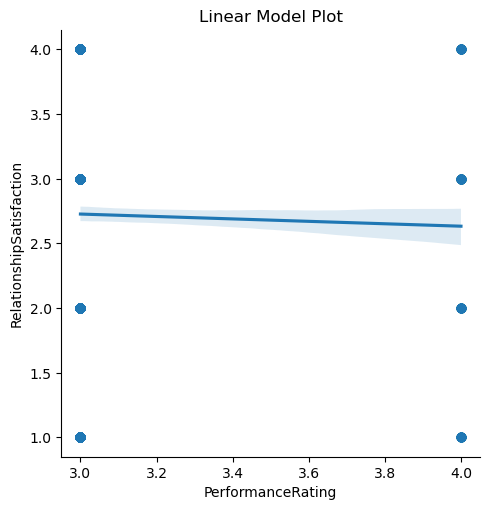

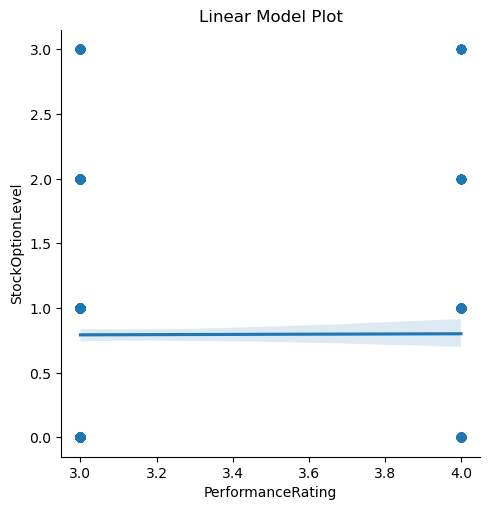

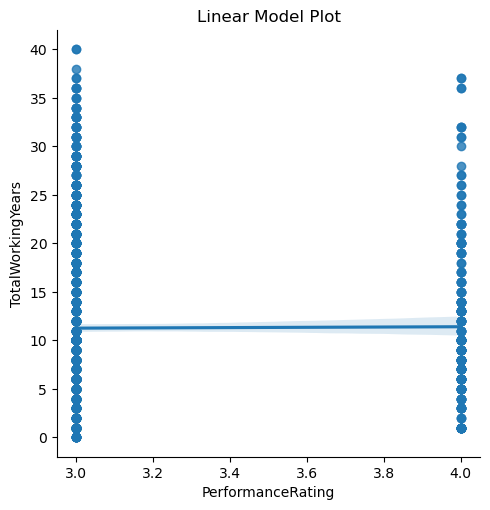

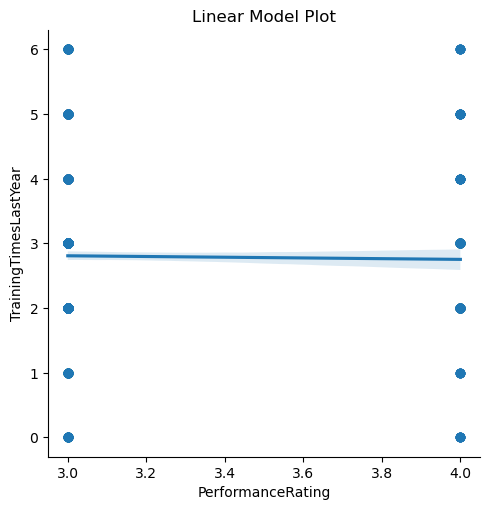

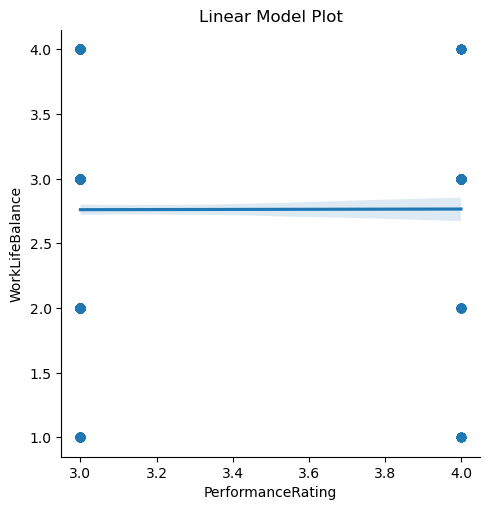

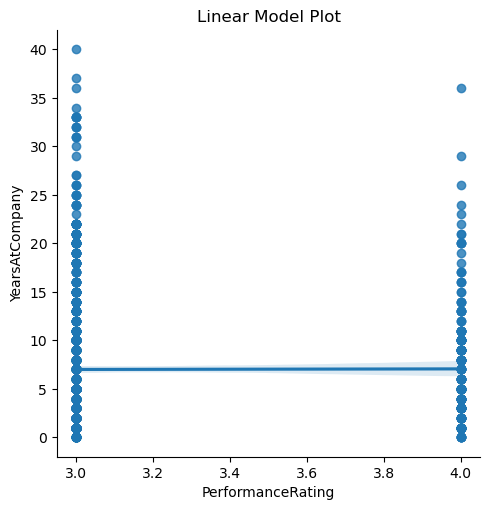

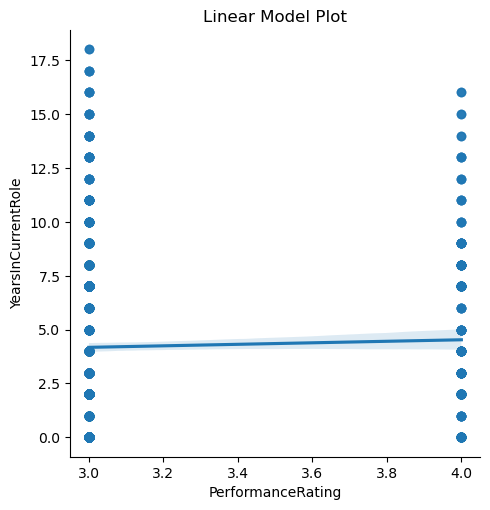

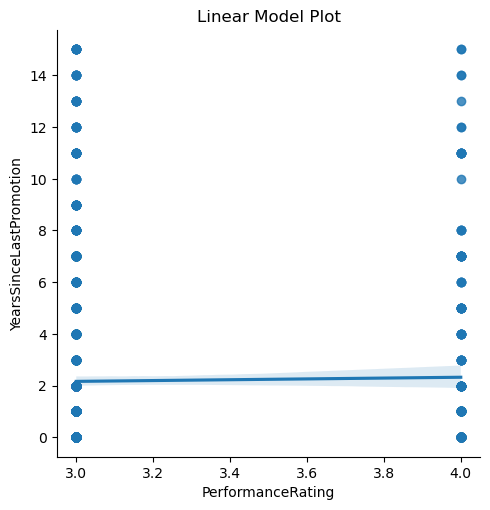

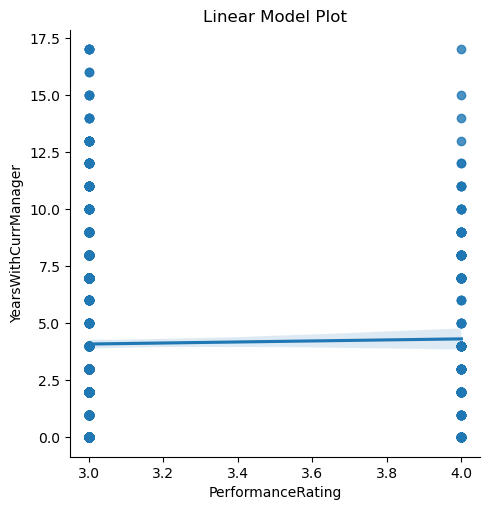

In [52]:
#checking linear relation of 'PerformanceRating' feature with other features 
log.append('PerformanceRating')#Appending feature
re()#calling function

**'PerformanceRating'** feature has **has almost no linear relation** with the **remaining features.**  

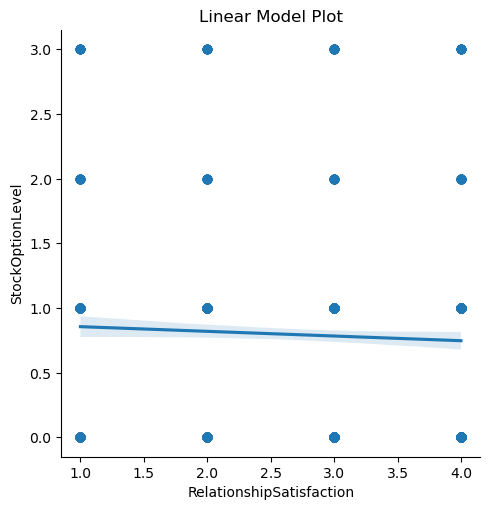

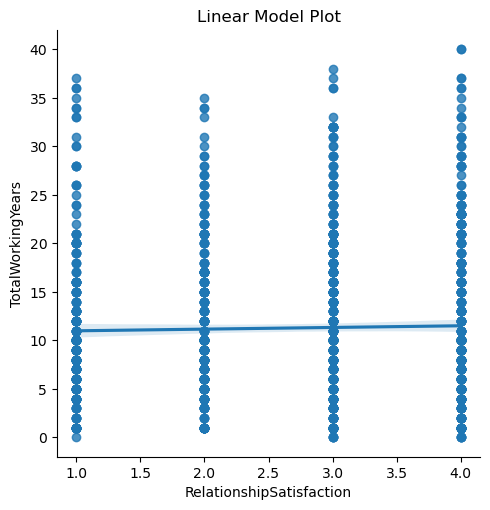

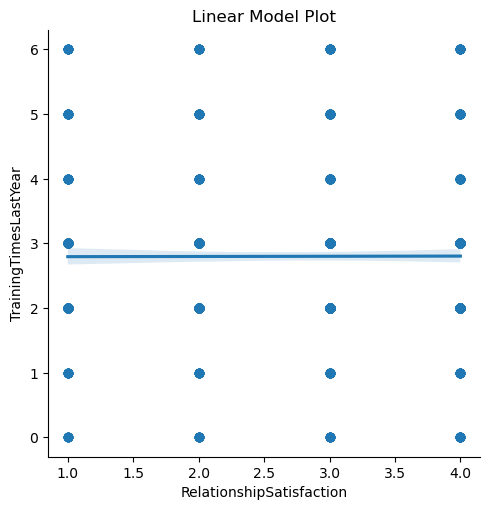

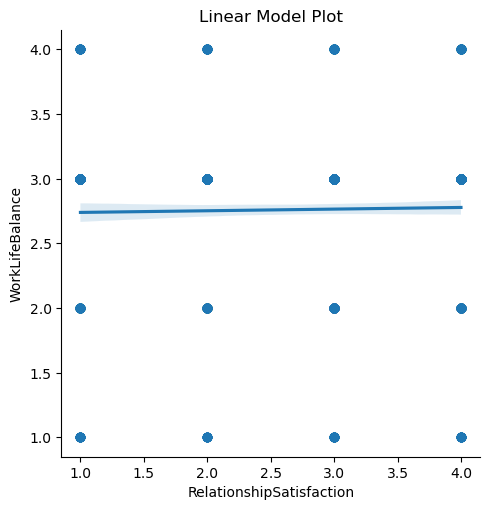

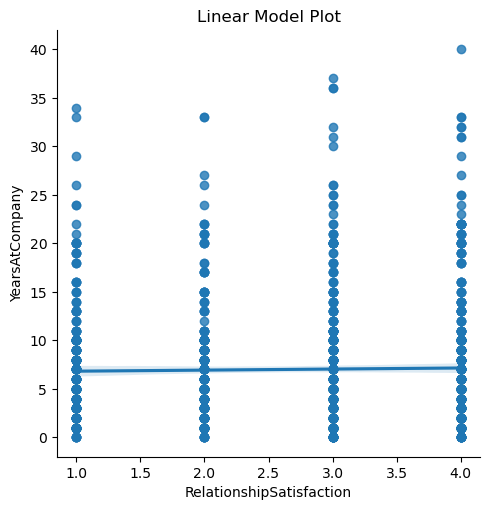

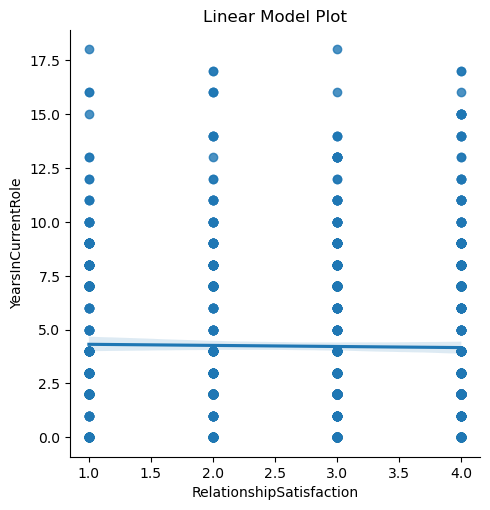

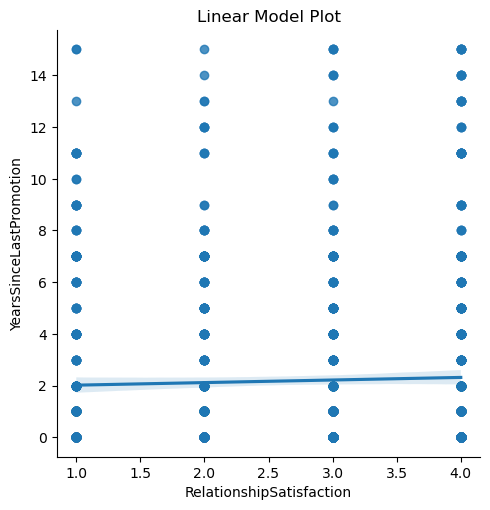

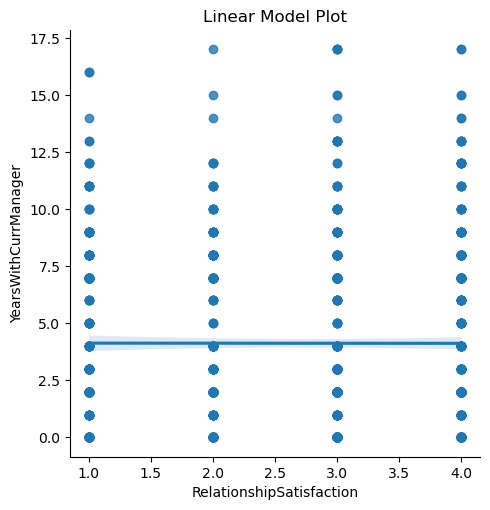

In [53]:
#checking linear relation of 'RelationshipSatisfaction' feature with other features 
log.append('RelationshipSatisfaction')#Appending feature
re()#calling function

**'RelationshipSatisfaction'** feature has **has almost no linear relation** with the **remaining features.**  

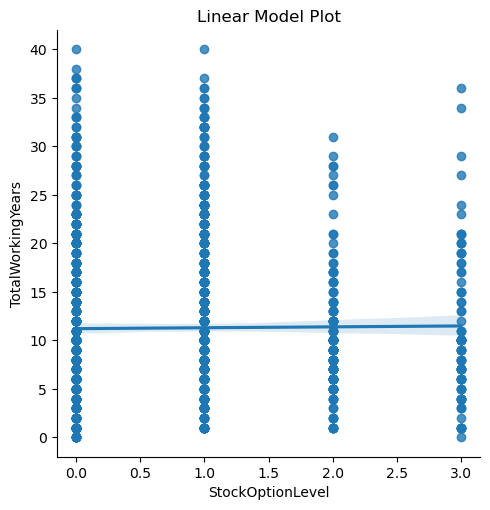

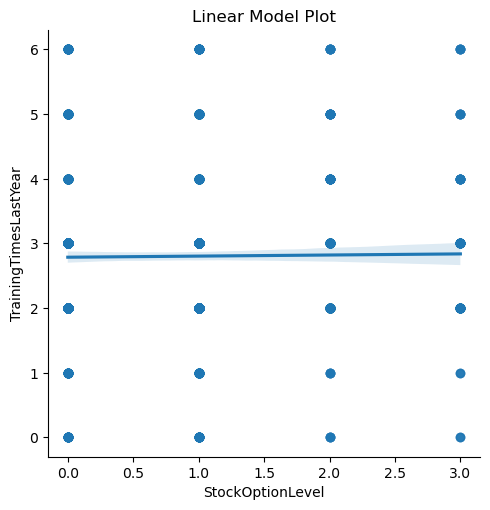

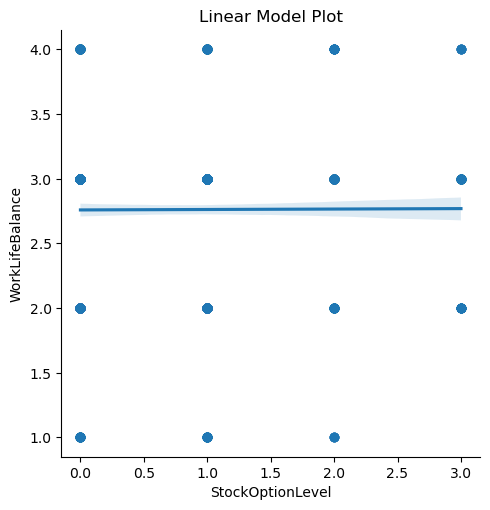

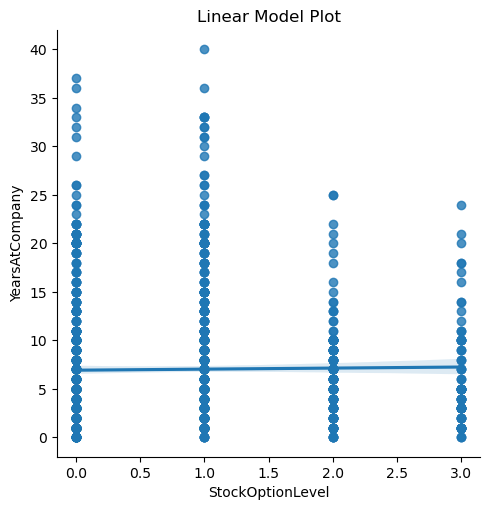

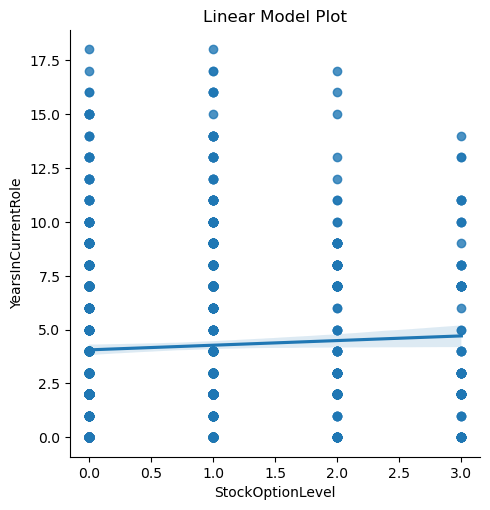

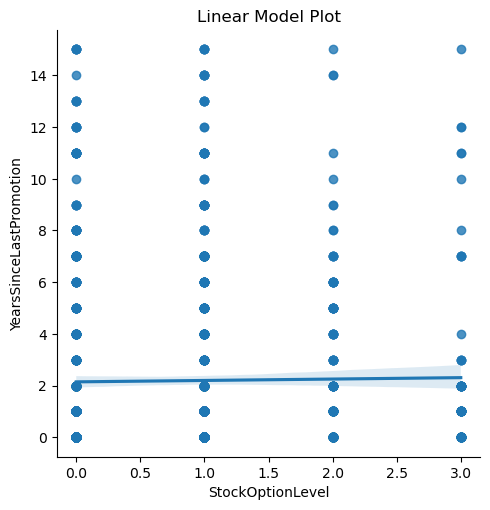

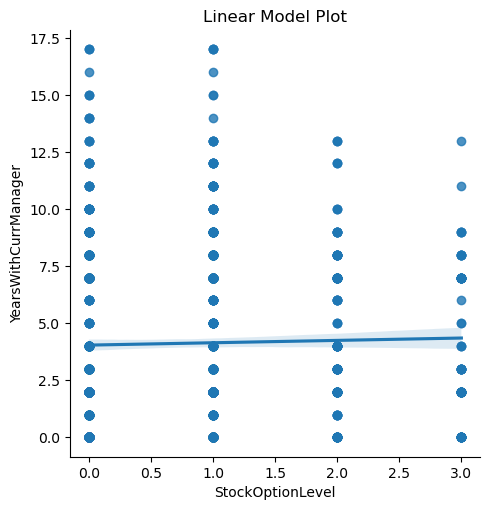

In [54]:
#checking linear relation of 'StockOptionLevel' feature with other features 
log.append('StockOptionLevel')#Appending feature
re()#calling function

**'StockOptionLevel'** feature has  **has almost no linear relation** with the **remaining features.**  

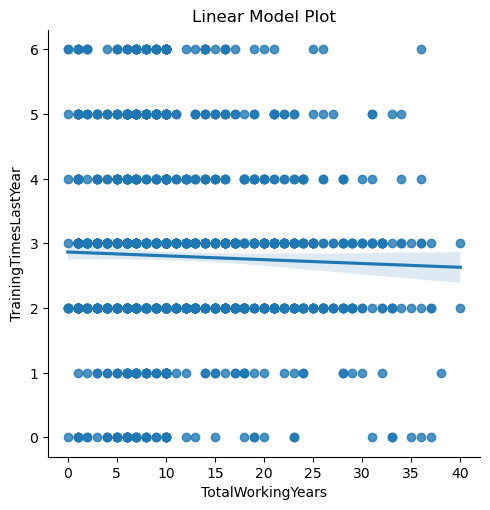

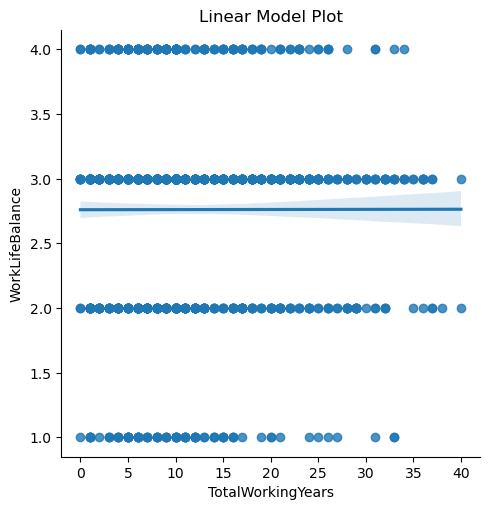

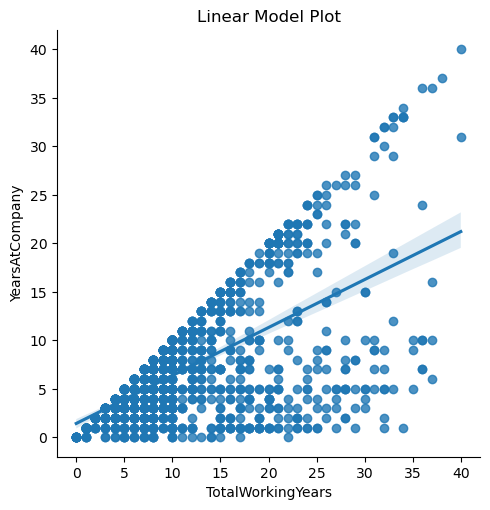

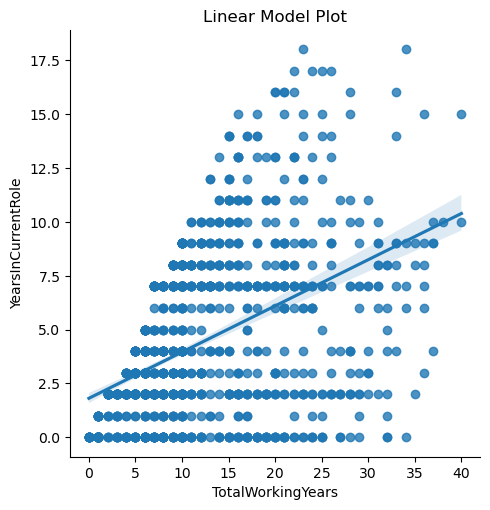

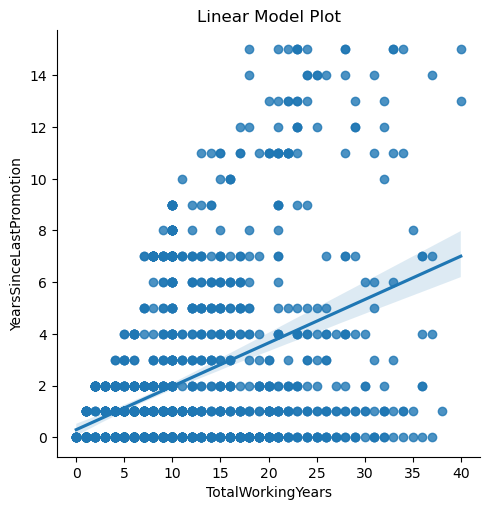

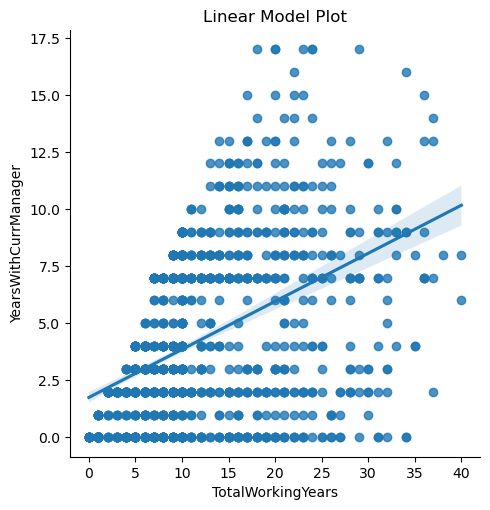

In [55]:
#checking linear relation of 'TotalWorkingYears' feature with other features 
log.append('TotalWorkingYears')#Appending feature
re()#calling function

**'TotalWorkingYears'** feature has **high positive linear** relation with **'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion' and 'YearsWithCurrManager'** features.    
**'TotalWorkingYears'** feature has **has almost no linear relation** with the **remaining features.**  

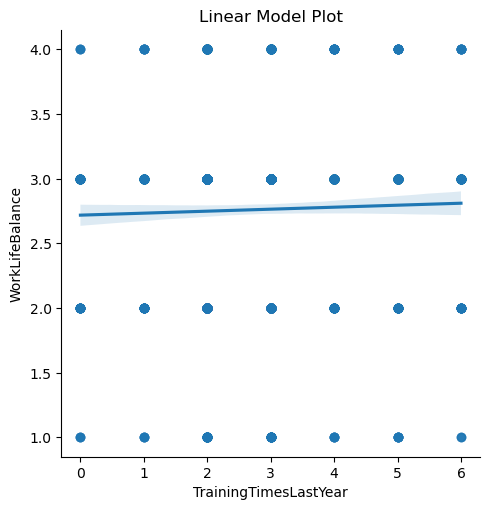

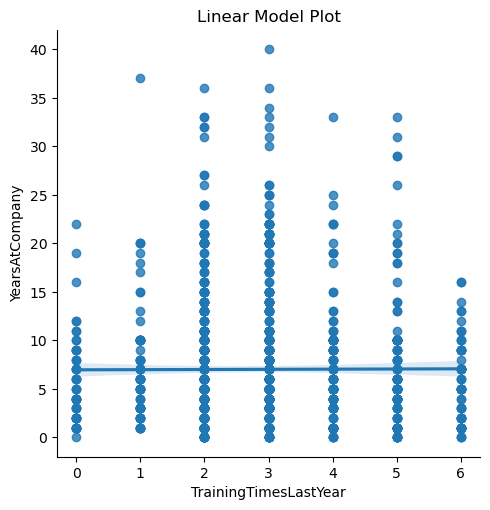

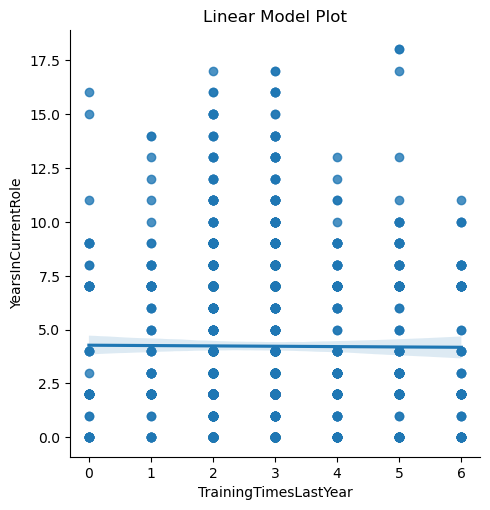

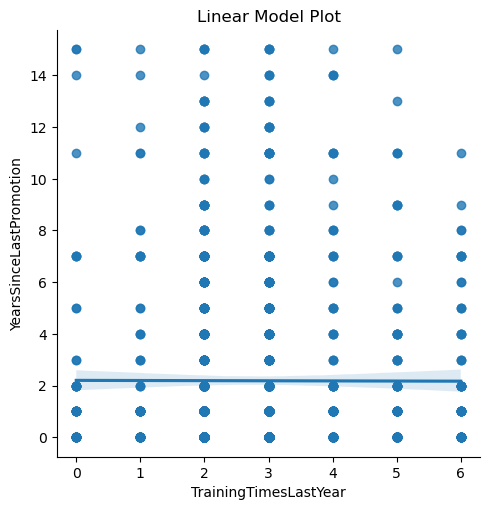

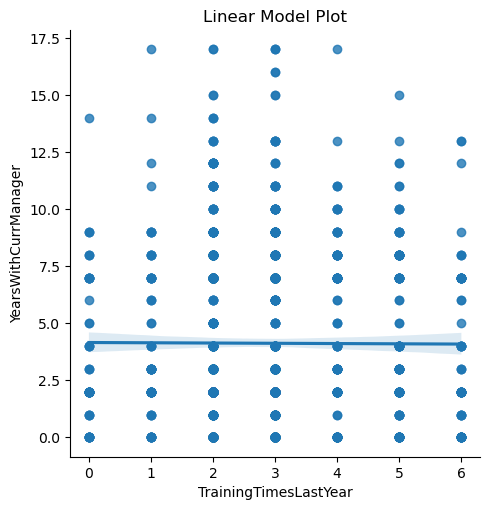

In [56]:
#checking linear relation of 'TrainingTimesLastYear' feature with other features 
log.append('TrainingTimesLastYear')#Appending feature
re()#calling function

**'TrainingTimesLastYear'** feature has **has almost no linear relation** with the **remaining features.**  

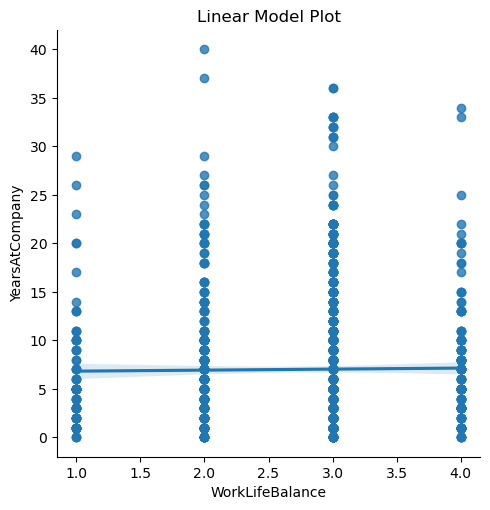

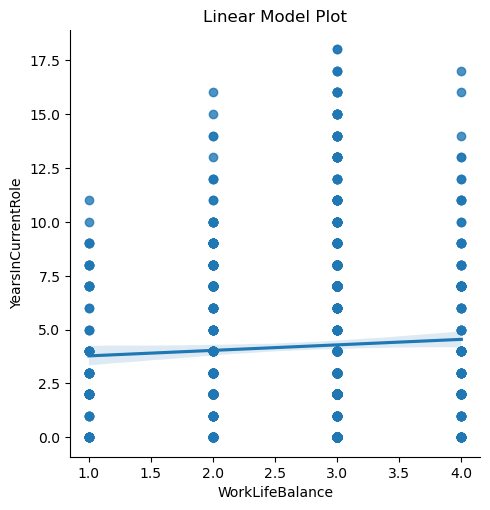

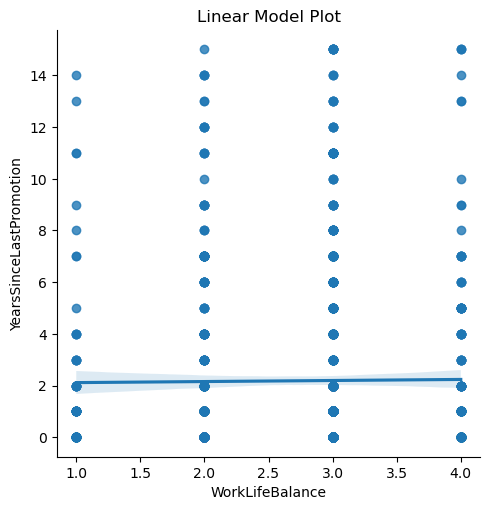

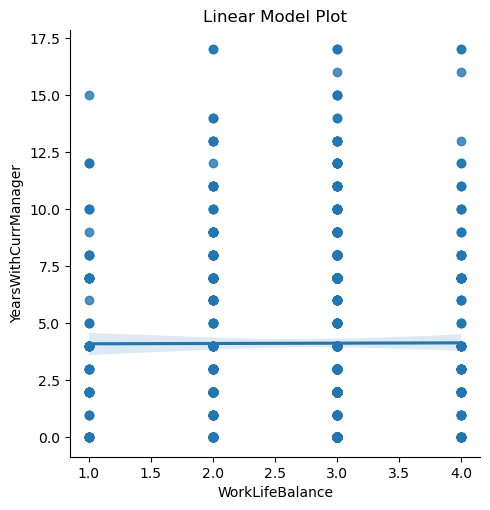

In [57]:
#checking linear relation of 'WorkLifeBalance' feature with other features 
log.append('WorkLifeBalance')#Appending feature
re()#calling function

**'WorkLifeBalance'** feature has almost **no linear relation** with the **remaining features.**  

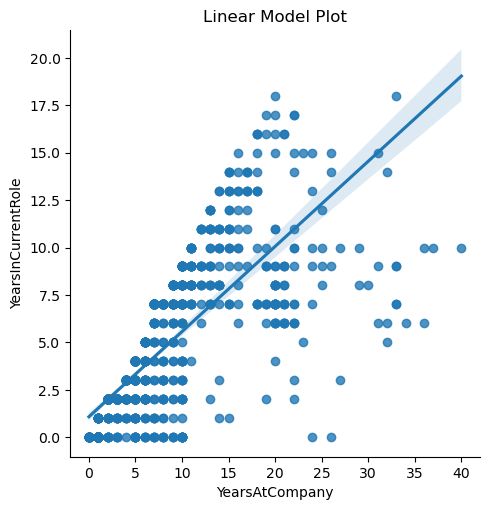

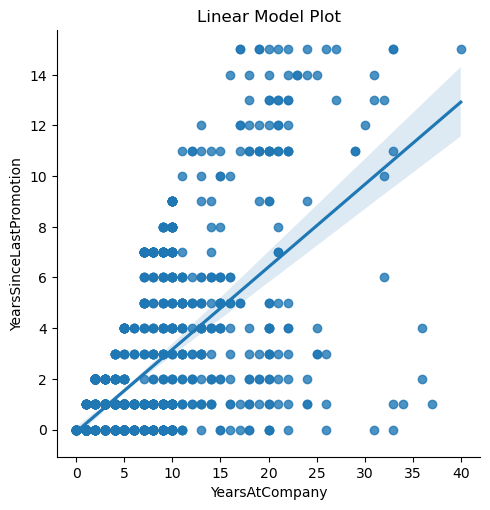

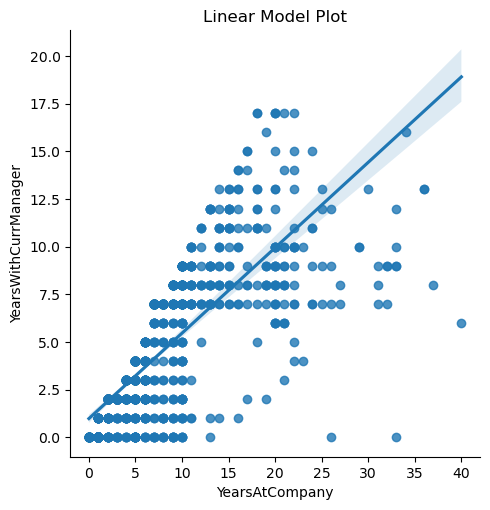

In [58]:
#checking linear relation of 'YearsAtCompany' feature with other features 
log.append('YearsAtCompany')#Appending feature
re()#calling function

**'YearsAtCompany'** feature has **high positive linear** relation with **'YearsInCurrentRole', 'YearsSinceLastPromotion' and 'YearsWithCurrManager'** features.

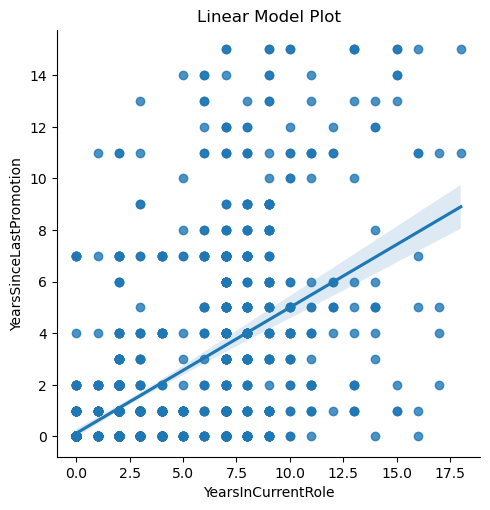

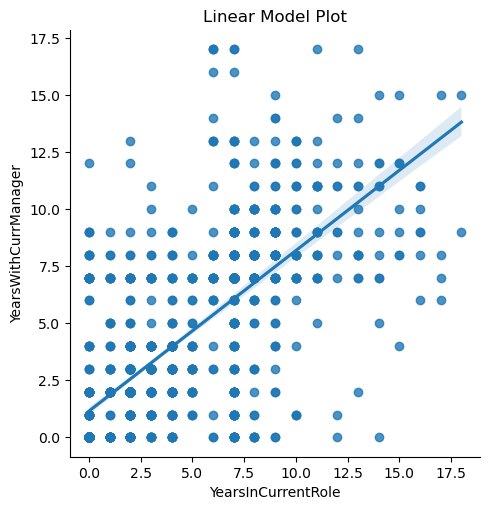

In [59]:
#checking linear relation of 'YearsInCurrentRole' feature with other features 
log.append('YearsInCurrentRole')#Appending feature
re()#calling function

**'YearsInCurrentRole'** feature has **high positive linear** relation with **'YearsSinceLastPromotion' and 'YearsWithCurrManager'** features.

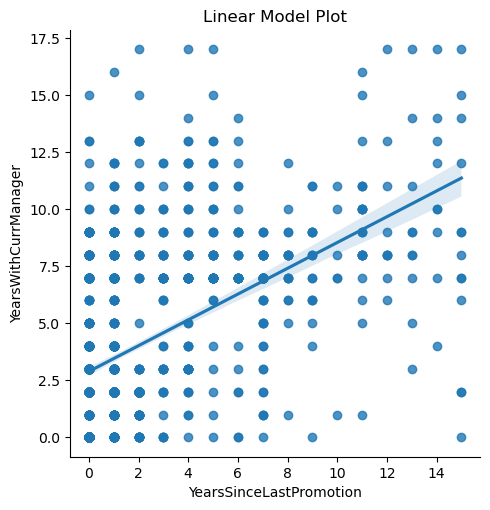

In [60]:
#checking linear relation between 'YearsSinceLastPromotion'  and 'YearsWithCurrManager' features  
log.append('YearsSinceLastPromotion')#Appending feature
re()#calling function

**'YearsSinceLastPromotion' and 'YearsWithCurrManager'** features  **have high positive linear relation** with each other.

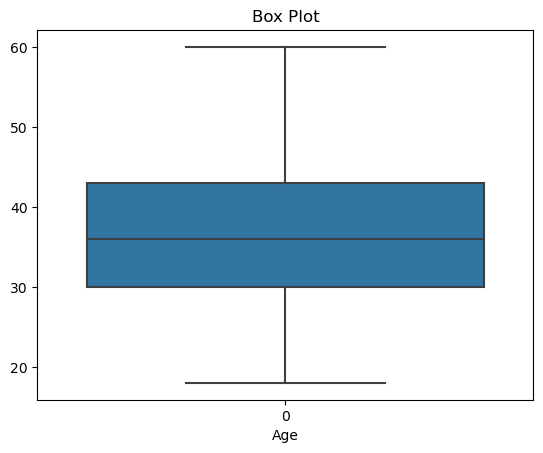

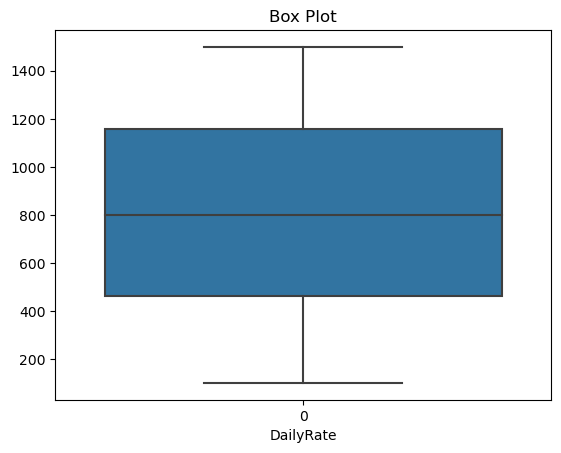

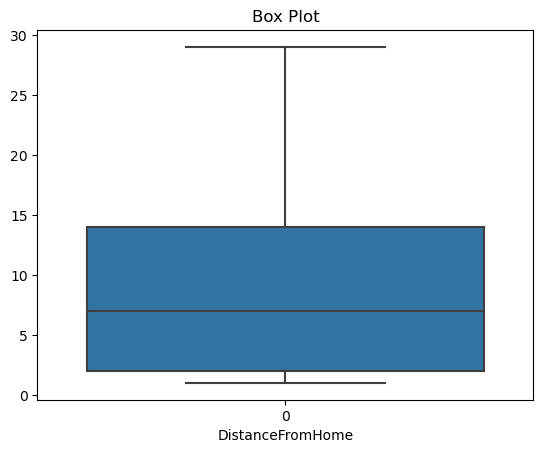

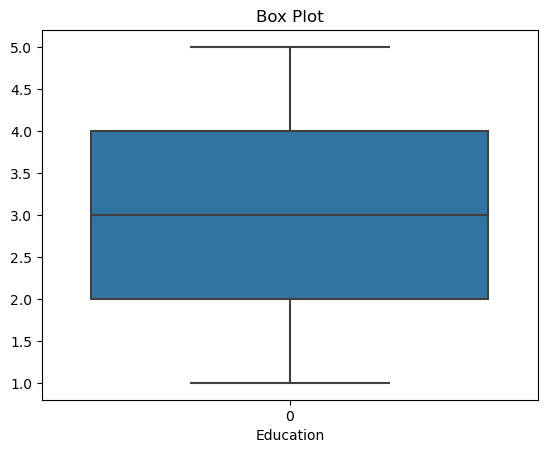

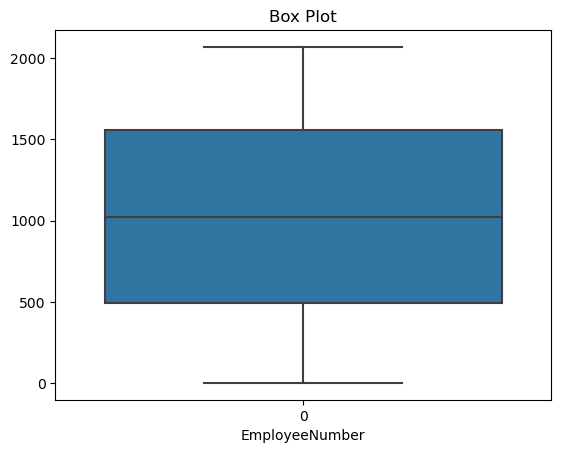

...

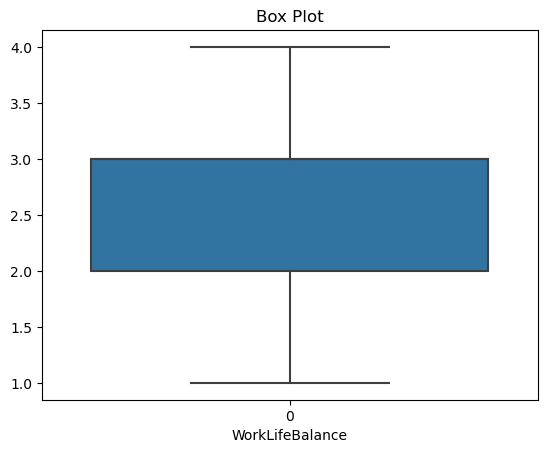

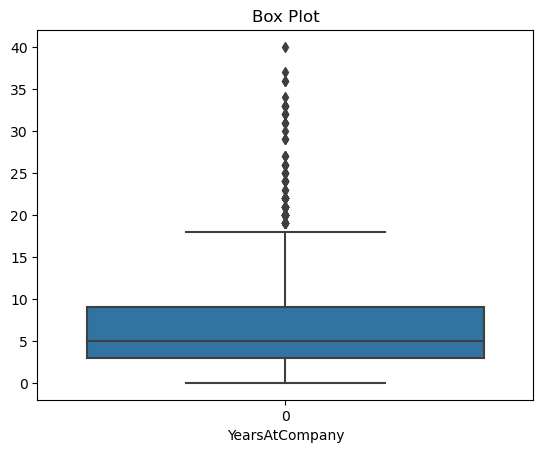

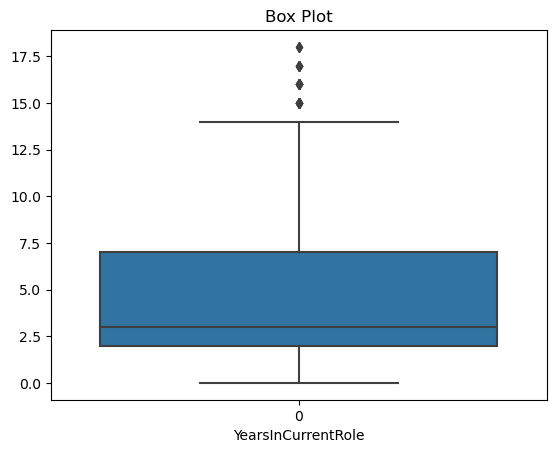

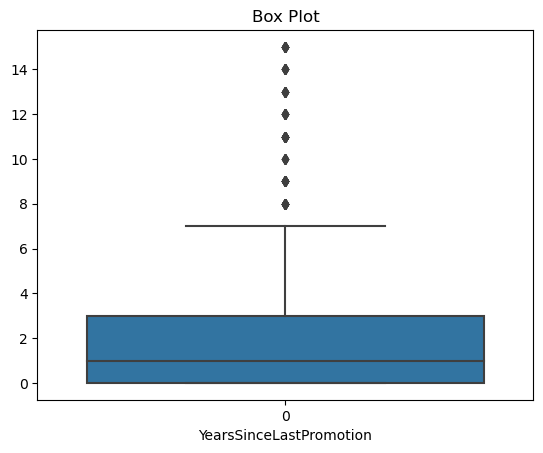

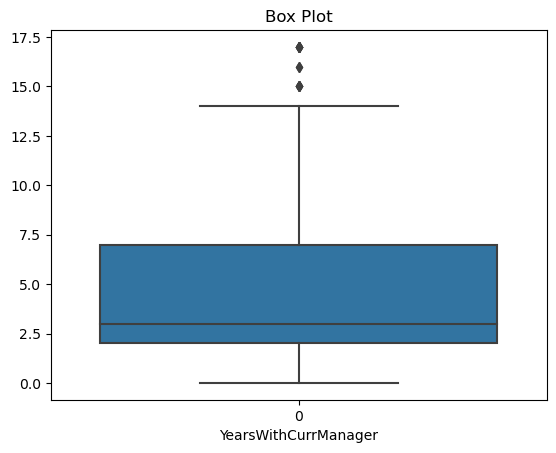

In [61]:
#Checking outliers via Box Plot
for i in num_c:
    sb.boxplot(df[i])
    plt.xlabel(i)
    plt.title('Box Plot')
    plt.show()

**'MonthlyIncome', 'NumCompaniesWorked', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion' and 'YearsWithCurrManager'** features **contains outliers**.

In [62]:
#removing outliers using zscore method
#Importing necessary libraries
from scipy.stats import zscore as zs

a=['MonthlyIncome', 'NumCompaniesWorked', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']

f_outlier=df[a]
z=np.abs(zs(f_outlier))
z

,MonthlyIncome,NumCompaniesWorked,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.108350,2.125136,0.932014,0.421642,2.171982,0.164613,0.063296,0.679146,0.245834
1,0.291719,0.678049,0.241988,0.164511,0.155707,0.488508,0.764998,0.368715,0.806541
2,0.937654,1.324226,0.932014,0.550208,0.155707,1.144294,1.167687,0.679146,1.155935
3,0.763634,0.678049,0.932014,0.421642,0.155707,0.161947,0.764998,0.252146,1.155935
4,0.644858,2.525591,0.241988,0.678774,0.155707,0.817734,0.615492,0.058285,0.595227
...,...,...,...,...,...,...,...,...,...
1465,0.835451,0.523316,0.241988,0.735447,0.155707,0.327893,0.615492,0.679146,0.314873
1466,0.741140,0.523316,0.241988,0.293077,1.707500,0.001333,0.764998,0.368715,0.806541
1467,0.076690,0.678049,0.241988,0.678774,2.171982,0.164613,0.615492,0.679146,0.314873
1468,0.236474,0.277594,0.932014,0.735447,0.155707,0.325228,0.488900,0.679146,1.086895


The **variable 'z'** holds the **zscores values** of these features.

In [63]:
#checking outliers as per the threshold value as '3'
np.where(z>3)

(array([  28,   45,   62,   62,   63,   64,   85,   98,   98,  110,  123,
         123,  123,  126,  126,  126,  153,  178,  187,  187,  190,  190,
         218,  231,  231,  237,  237,  270,  270,  281,  326,  386,  386,
         401,  411,  425,  425,  427,  445,  466,  473,  477,  535,  561,
         561,  584,  592,  595,  595,  595,  616,  624,  635,  653,  653,
         677,  686,  701,  716,  746,  749,  752,  799,  838,  861,  861,
         875,  875,  894,  914,  914,  918,  922,  926,  926,  937,  956,
         962,  976,  976, 1008, 1024, 1043, 1078, 1078, 1086, 1086, 1093,
        1111, 1116, 1116, 1135, 1138, 1138, 1156, 1184, 1221, 1223, 1242,
        1295, 1301, 1301, 1303, 1327, 1331, 1348, 1351, 1401, 1414, 1430],
       dtype=int64),
 array([8, 7, 5, 7, 6, 7, 3, 3, 5, 7, 6, 7, 8, 3, 5, 7, 8, 7, 3, 8, 5, 6,
        7, 6, 8, 5, 7, 3, 5, 6, 7, 7, 8, 3, 5, 5, 7, 7, 3, 6, 5, 5, 7, 5,
        8, 7, 5, 3, 5, 7, 8, 3, 8, 5, 7, 5, 8, 7, 6, 6, 5, 7, 7, 7, 5, 7,
        7, 8, 3,

In [64]:
#checking value of the outliers
z.iloc[28,8]

3.6100788863016295

In [65]:
z.iloc[45,7]

3.977310265498893

In [66]:
z.iloc[62,5]

3.264271288047011

In [67]:
z.iloc[62,7]

3.3564494722225446

In [68]:
z.iloc[63,6]

3.249878181909428

We can confirm that these values holds outlier as per the threshold value.

In [69]:
#Removing outliers 
zscore=df[(z<3).all(axis=1)]#storing values in 'zscore' variable

In [70]:
#Using IQR method to remove outliers from the original data frame
q1=f_outlier.quantile(.25)
q3=f_outlier.quantile(.75)
iqr=q3-q1
IQR=df[~((df< (q1-1.5*iqr)) | (df>(q3+1.5*iqr))).any(axis=1)]

In [71]:
print('Data loss percentage after removing outliers via zscore method',((df.shape[0]-zscore.shape[0])/df.shape[0])*100)
print('Data loss percentage after removing outliers via IQR method',((df.shape[0]-IQR.shape[0])/df.shape[0])*100)

Data loss percentage after removing outliers via zscore method 5.646258503401361
Data loss percentage after removing outliers via IQR method 37.07482993197279


We can observe that **zscore method performed well** than IQR method, hence, we will **update** the data frame with **zscore method.**

In [72]:
outliers=df.shape[0]-zscore.shape[0]#storing number of outliers removed in 'outliers' variable

print(f'Outliers removed : {outliers}')#printing
df=zscore#Updating data frame

Outliers removed : 83


In [73]:
df.shape#checking shape of data frame

(1387, 32)

Now the data frame has **1387 rows.**

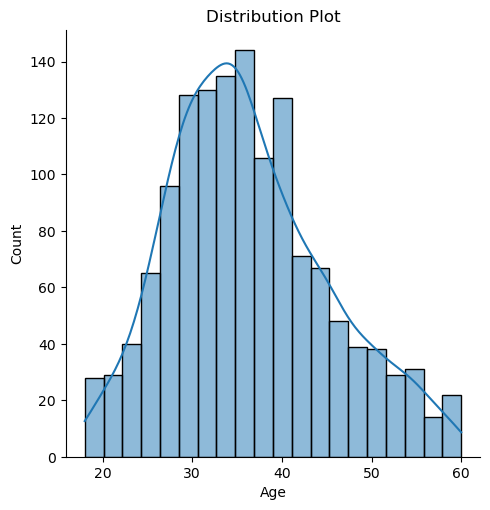

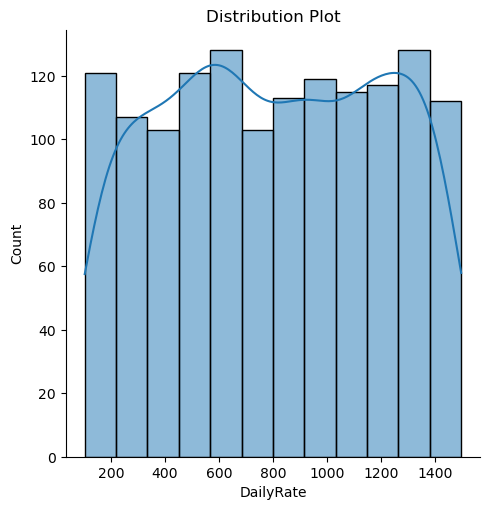

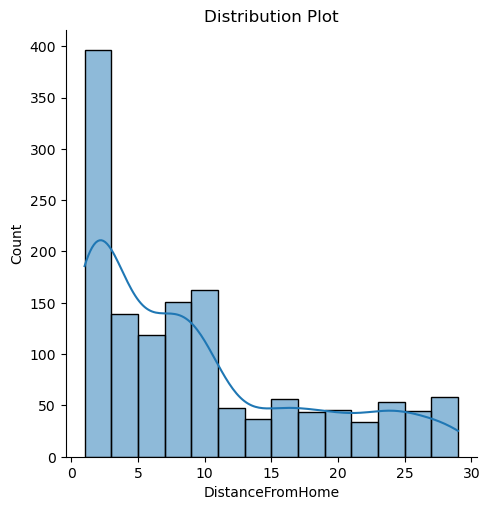

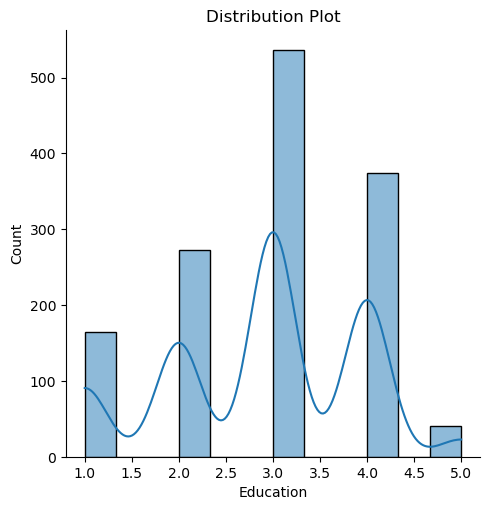

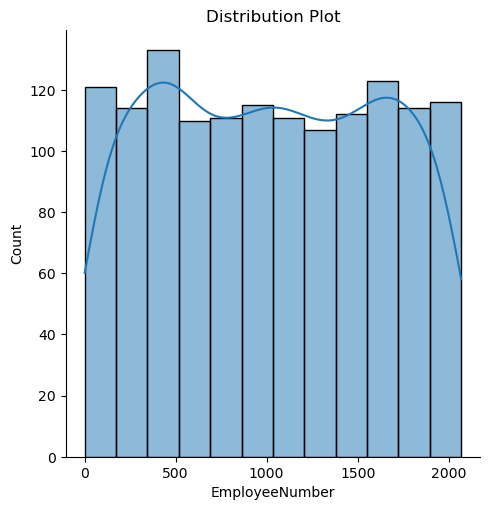

...

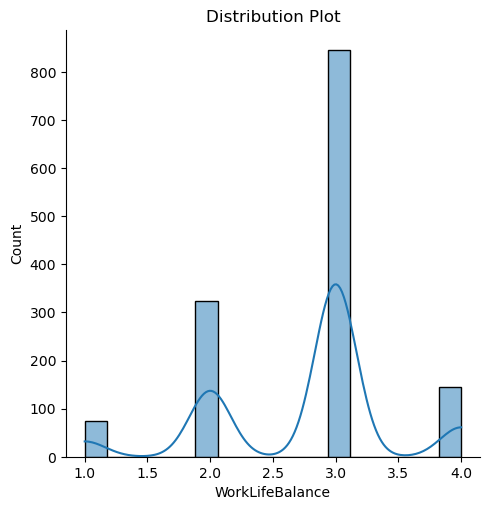

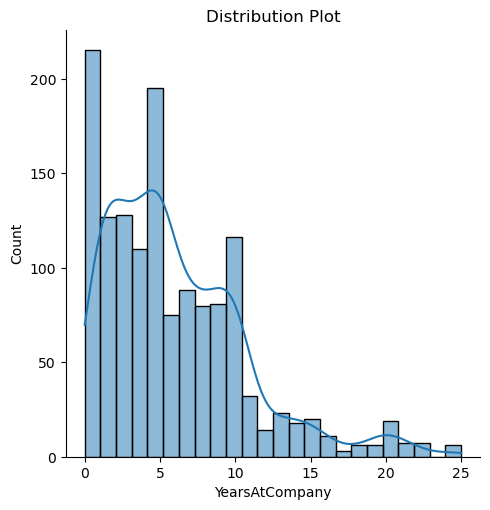

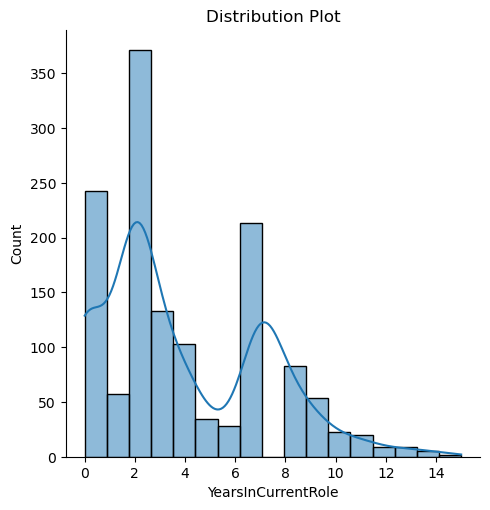

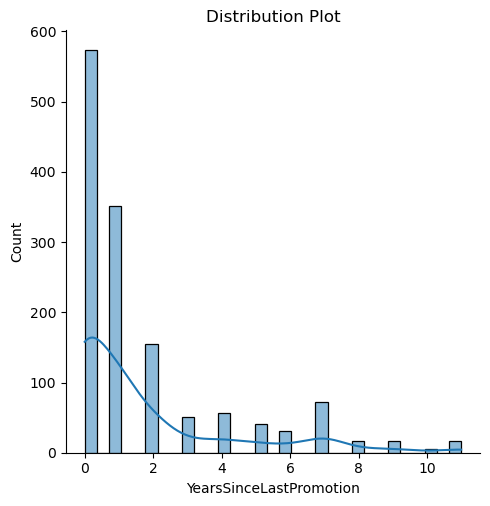

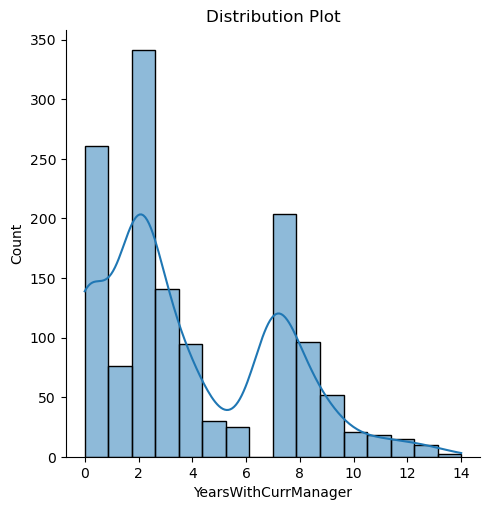

In [74]:
#checking distribution of columns
for i in num_c:
    sb.displot(df[i],kde=True)
    plt.title('Distribution Plot')    

**'DistanceFromHome', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion' and 'YearsWithCurrManager'** features are skewed to the right.  
**'WorkLifeBalance' and 'JobInvolvement'** features are skewed to the left.

In [75]:
df.skew()

Age                         0.472280
DailyRate                  -0.017078
DistanceFromHome            0.954752
Education                  -0.289024
EmployeeNumber              0.018931
EnvironmentSatisfaction    -0.325285
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    1.126075
JobSatisfaction            -0.345612
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
PercentSalaryHike           0.800592
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
YearsAtCompany              1.248623
YearsInCurrentRole          0.726675
YearsSinceLastPromotion     1.756335
YearsWithCurrManager        0.694506
dtype: float64

**'DistanceFromHome','JobInvolvement', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion' and 'YearsWithCurrManager'** features are in **unaccpetable range**, thus , we can use **yeojohnson method** to remove skewness.

In [76]:
#creating contains names of skewed features
a=['DistanceFromHome', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager','WorkLifeBalance', 'JobInvolvement']

from scipy.stats import yeojohnson as yj #importing library

for i in a:#iterating through 'a' list
    df[i],p=yj(df[i])
df.skew()

Age                         0.472280
DailyRate                  -0.017078
DistanceFromHome           -0.008149
Education                  -0.289024
EmployeeNumber              0.018931
EnvironmentSatisfaction    -0.325285
HourlyRate                 -0.030481
JobInvolvement             -0.018801
JobLevel                    0.110769
JobSatisfaction            -0.345612
MonthlyIncome               0.027700
MonthlyRate                 0.030596
NumCompaniesWorked          0.016175
PercentSalaryHike           0.112128
PerformanceRating           0.000000
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.089929
TotalWorkingYears          -0.009666
TrainingTimesLastYear       0.057949
WorkLifeBalance            -0.011133
YearsAtCompany             -0.025230
YearsInCurrentRole         -0.069631
YearsSinceLastPromotion     0.212301
YearsWithCurrManager       -0.070570
dtype: float64

Skewness is reduced. All values are in **accpetable range**.

In [77]:
#Encoding categorical columns using Label Encoder
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,0.698793,2,Life Sciences,1,2,Female,94,6.136924,0.710565,Sales Executive,4,Single,3.860102,19479,2.017929,Yes,0.711293,0.044264,1,-0.000000,3.331995,0.000000,1.419993,2.427596,2.018485,-0.000000,2.260281
1,49,No,Travel_Frequently,279,Research & Development,2.254628,1,Life Sciences,2,3,Male,61,3.439577,0.710565,Research Scientist,2,Married,3.837020,24907,0.674600,No,0.726680,0.044264,4,0.602674,3.786692,2.180336,6.610730,3.155981,2.794574,0.566648,2.727090
2,37,Yes,Travel_Rarely,1373,Research & Development,1.112840,2,Other,4,4,Male,92,3.439577,0.522057,Laboratory Technician,3,Single,3.687033,2396,1.804380,Yes,0.719452,0.044264,2,-0.000000,3.079851,2.180336,6.610730,0.000000,0.000000,-0.000000,0.000000
3,33,No,Travel_Frequently,1392,Research & Development,1.409000,4,Life Sciences,5,4,Female,56,6.136924,0.522057,Research Scientist,3,Married,3.745749,23159,0.674600,Yes,0.711293,0.044264,3,-0.000000,3.331995,2.180336,6.610730,2.823661,2.794574,0.939888,0.000000
4,27,No,Travel_Rarely,591,Research & Development,1.112840,1,Medical,7,1,Male,40,6.136924,0.522057,Laboratory Technician,2,Married,3.775261,16632,2.106209,No,0.713892,0.044264,4,0.602674,2.806491,2.180336,6.610730,1.242409,1.280069,0.803607,1.264277
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,3.299077,2,Medical,2061,3,Male,41,9.429467,0.710565,Laboratory Technician,4,Married,3.724315,12290,1.511783,No,0.721975,0.044264,3,0.602674,5.050438,2.180336,6.610730,2.195252,1.280069,-0.000000,1.656822
1466,39,No,Travel_Rarely,613,Research & Development,1.990845,1,Medical,2062,4,Male,42,3.439577,0.809574,Healthcare Representative,1,Married,3.930618,21457,1.511783,No,0.719452,0.044264,1,0.602674,3.566679,3.252793,6.610730,2.635316,2.794574,0.566648,2.727090
1467,27,No,Travel_Rarely,155,Research & Development,1.640095,3,Life Sciences,2064,2,Male,87,9.429467,0.710565,Manufacturing Director,2,Married,3.863676,5174,0.674600,Yes,0.724723,0.044264,2,0.602674,2.806491,0.000000,6.610730,2.427596,1.280069,-0.000000,1.656822
1468,49,No,Travel_Frequently,1023,Sales,1.112840,3,Medical,2065,4,Male,63,3.439577,0.710565,Sales Executive,2,Married,3.844446,13243,1.052508,No,0.717888,0.044264,4,-0.000000,5.050438,2.180336,3.637683,2.996317,2.563919,-0.000000,2.928111


In [78]:
for i in cat_c:#iterating through 'cat_c' list which contains names of catagorical columns
    df[i]=le.fit_transform(df[i])#Transforming columns

df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,0.698793,2,1,1,2,0,94,6.136924,0.710565,7,4,2,3.860102,19479,2.017929,1,0.711293,0.044264,1,-0.000000,3.331995,0.000000,1.419993,2.427596,2.018485,-0.000000,2.260281
1,49,0,1,279,1,2.254628,1,1,2,3,1,61,3.439577,0.710565,6,2,1,3.837020,24907,0.674600,0,0.726680,0.044264,4,0.602674,3.786692,2.180336,6.610730,3.155981,2.794574,0.566648,2.727090
2,37,1,2,1373,1,1.112840,2,4,4,4,1,92,3.439577,0.522057,2,3,2,3.687033,2396,1.804380,1,0.719452,0.044264,2,-0.000000,3.079851,2.180336,6.610730,0.000000,0.000000,-0.000000,0.000000
3,33,0,1,1392,1,1.409000,4,1,5,4,0,56,6.136924,0.522057,6,3,1,3.745749,23159,0.674600,1,0.711293,0.044264,3,-0.000000,3.331995,2.180336,6.610730,2.823661,2.794574,0.939888,0.000000
4,27,0,2,591,1,1.112840,1,3,7,1,1,40,6.136924,0.522057,2,2,1,3.775261,16632,2.106209,0,0.713892,0.044264,4,0.602674,2.806491,2.180336,6.610730,1.242409,1.280069,0.803607,1.264277
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,3.299077,2,3,2061,3,1,41,9.429467,0.710565,2,4,1,3.724315,12290,1.511783,0,0.721975,0.044264,3,0.602674,5.050438,2.180336,6.610730,2.195252,1.280069,-0.000000,1.656822
1466,39,0,2,613,1,1.990845,1,3,2062,4,1,42,3.439577,0.809574,0,1,1,3.930618,21457,1.511783,0,0.719452,0.044264,1,0.602674,3.566679,3.252793,6.610730,2.635316,2.794574,0.566648,2.727090
1467,27,0,2,155,1,1.640095,3,1,2064,2,1,87,9.429467,0.710565,4,2,1,3.863676,5174,0.674600,1,0.724723,0.044264,2,0.602674,2.806491,0.000000,6.610730,2.427596,1.280069,-0.000000,1.656822
1468,49,0,1,1023,2,1.112840,3,3,2065,4,1,63,3.439577,0.710565,7,2,1,3.844446,13243,1.052508,0,0.717888,0.044264,4,-0.000000,5.050438,2.180336,3.637683,2.996317,2.563919,-0.000000,2.928111


All the catagorical data have been encoded. In **target variable**, **'1'** represent **'Yes'** and **'0'** represent **'No'**.

In [79]:
#Checking correlation between independant and dependant variables
cor=df.corr()
cor

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159366,0.022340,0.021946,-0.038242,-0.028793,0.198502,-0.032676,-0.002704,0.014098,-0.039430,0.025465,0.032808,0.430414,-0.112957,0.011763,-0.104372,0.436543,0.026954,0.339436,0.034180,0.013248,0.002051,0.041744,0.077833,0.634884,-0.013707,-0.017500,0.174149,0.118454,0.103938,0.114962
Attrition,-0.159366,1.000000,-0.001041,-0.057220,0.063637,0.080979,-0.032703,0.023585,-0.010169,-0.112393,0.036252,-0.001532,-0.129655,-0.196464,0.064283,-0.114206,0.160960,-0.207280,0.014888,0.047508,0.257237,-0.017523,0.008809,-0.052344,-0.175081,-0.220878,-0.059071,-0.051039,-0.201954,-0.187047,-0.050986,-0.186821
BusinessTravel,0.022340,-0.001041,1.000000,-0.004606,-0.003521,-0.015034,-0.010560,0.022576,-0.013273,0.001183,-0.025364,0.025424,0.024698,-0.002398,0.000213,-0.032491,0.018687,0.028387,-0.010307,0.026929,0.022378,-0.027934,-0.009771,-0.029660,-0.012732,0.031888,0.011688,-0.015374,-0.021107,-0.032472,-0.027478,-0.033222
DailyRate,0.021946,-0.057220,-0.004606,1.000000,-0.005398,-0.003967,-0.018442,0.040645,-0.044886,0.033123,-0.005242,0.014279,0.044839,0.015383,-0.015437,0.042698,-0.074113,0.029530,-0.029844,0.033388,0.020294,0.028690,0.027375,0.004516,0.047773,0.043307,0.006581,-0.045668,0.005806,0.020542,-0.035403,0.007098
Department,-0.038242,0.063637,-0.003521,-0.005398,1.000000,0.037660,0.012846,0.013432,-0.007828,-0.014540,-0.030618,-0.002412,-0.025905,0.203244,0.678627,0.029521,0.052086,0.154056,0.022741,-0.034028,0.014908,-0.015322,-0.034696,-0.037705,-0.001271,-0.007789,0.039412,0.021020,0.026334,0.057983,0.017842,0.023995
DistanceFromHome,-0.028793,0.080979,-0.015034,-0.003967,0.037660,1.000000,0.003595,0.011891,0.034843,-0.012075,0.010557,0.014926,0.038096,0.024038,0.009353,-0.019334,-0.027275,0.000545,0.048976,-0.010318,0.036524,0.034946,-0.004813,0.010099,0.027082,-0.012129,-0.015334,-0.030011,0.006570,0.013091,-0.003873,-0.002310
Education,0.198502,-0.032703,-0.010560,-0.018442,0.012846,0.003595,1.000000,-0.038017,0.042707,-0.026223,-0.019166,0.010848,0.042601,0.104270,0.015140,-0.007219,-0.012726,0.111594,-0.018540,0.137958,-0.017166,-0.002478,-0.038616,-0.002393,0.026805,0.152263,-0.023484,0.009328,0.038266,0.050563,0.015762,0.026340
EducationField,-0.032676,0.023585,0.022576,0.040645,0.013432,0.011891,-0.038017,1.000000,0.000058,0.047924,0.010676,-0.006539,-0.010110,-0.041183,0.017492,-0.050934,0.012073,-0.032707,-0.023384,-0.007901,0.007912,-0.005811,-0.011444,-0.013734,-0.017331,-0.008101,0.048844,0.037963,0.002739,0.002909,0.019765,0.025918
EmployeeNumber,-0.002704,-0.010169,-0.013273,-0.044886,-0.007828,0.034843,0.042707,0.000058,1.000000,0.011003,0.016348,0.028040,-0.007548,-0.008816,-0.010483,-0.048405,-0.001182,-0.006416,0.001158,0.004712,-0.033032,-0.016129,-0.490544,-0.063017,0.055292,-0.003381,0.019978,0.007394,0.017546,0.004207,0.012878,0.000228
EnvironmentSatisfaction,0.014098,-0.112393,0.001183,0.033123,-0.014540,-0.012075,-0.026223,0.047924,0.011003,1.000000,-0.015715,-0.040459,-0.020060,0.010322,-0.022354,-0.011186,-0.012453,-0.012444,0.032916,0.008870,0.059355,-0.027060,-0.029972,0.018414,0.025227,-0.014091,-0.016757,0.031085,0.014305,0.031007,0.039876,0.007643


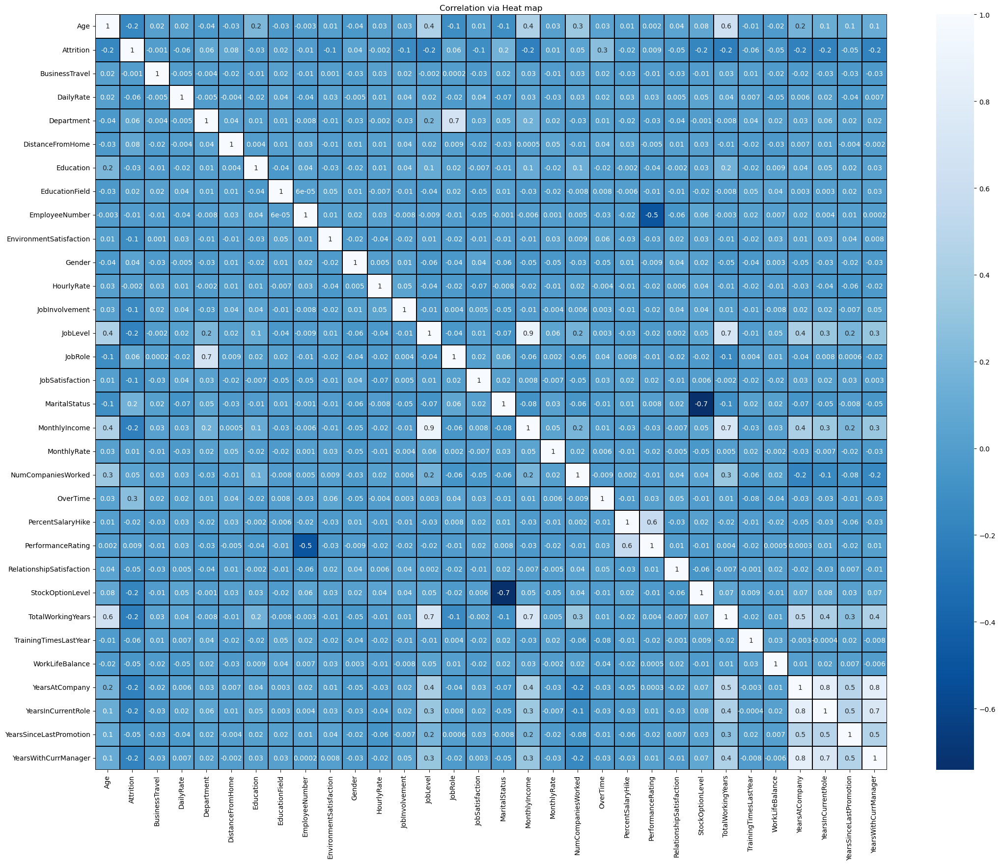

In [80]:
#Visualizing correlation via heat map
plt.figure(figsize=(26,20))
sb.heatmap(cor,annot=True,cmap="Blues_r",linecolor='black',linewidths=0.1,fmt='0.1g')
plt.title('Correlation via Heat map')
plt.show()

We can observe the following from this heatmap:  
1)**Features** have **very low correlation** with **target variable.** 
  
2)**'YearsWithCurrManager', 'YearsSinceLastPromotion', 'YearsInCurrentRole', 'YearsAtCompany', 'WorkLifeBalance', 'TrainingTimesLastYear', 'TotalWorkingYears', 'StockOptionLevel', 'RelationShipSatisfaction', 'PercentSalaryHike', 'MonthlyIncome', 'JobSatisfaction', 'JobLevel', 'JobInvolvement', 'HourlyRate', 'EnviornmentalSatisfaction', 'EmployeeNumber', 'Education', 'DailyRate', 'BusinessTravel' and 'Age'** features have **low negative correlation** with **target variable.**  
  
3)**'PerformanceRating', 'OverTime', 'NumCompaniesWorked', 'MonthyRate', 'MartialStatus', 'JobRole', 'Gender', 'EducationField', 'DistanceFromHome' and 'Department'** features have **low positive correlation** with **target variable.**  
  
4)These are the following **pairs with high positive correlation with each other:**  
  
**'MonthlyIncome' and 'JobLevel'** features  
**'YearsAtCompany' and 'YearsWithCurrManager'** features  
**'YearsAtCompany' and 'YearsInCurrentRole'** features  

In [81]:
#Separating features and target variable 
x=df.drop('Attrition',axis=1)
y=df['Attrition']    

In [82]:
#checking dimensions of features and label 
print('Dimensions of features:',x.shape,'\nDimensions of label:',y.shape)

Dimensions of features: (1387, 31) 
Dimensions of label: (1387,)


We can observe that both features and lable have **same number of rows**.  
'x' contains 31 features.

In [83]:
#Importing required library to apply StandardScaler
from sklearn.preprocessing import StandardScaler as sc

sc=sc()#creating instance

x=pd.DataFrame(sc.fit_transform(x),columns=x.columns)#transforming data
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.536681,0.593126,0.734325,1.405373,-1.489968,-0.876177,-0.940815,-1.702014,-0.665328,-1.229911,1.388670,0.322170,0.349828,1.007448,1.143776,1.231027,0.386674,0.734688,1.620671,1.584737,-1.495549,-1.665335e-16,-1.575817,-1.084263,-0.173231,-2.608524,-2.147950,0.231837,0.290524,-1.073534,0.582177
1,1.442111,-0.905354,-1.307769,-0.496337,0.244561,-1.853858,-0.940815,-1.700354,0.251978,0.813067,-0.239091,-1.065841,0.349828,0.604178,-0.673426,-0.141509,0.144235,1.505353,-0.561880,-0.631019,1.690425,9.298118e-16,1.199034,0.548653,0.147620,0.217074,0.274860,0.948319,1.006575,0.193168,1.018073
2,0.083966,0.593126,1.406752,-0.496337,-1.028366,-0.876177,1.305159,-1.697034,1.169285,0.813067,1.290017,-1.065841,-1.141761,-1.008901,0.235175,1.231027,-1.431153,-1.690747,1.273711,1.584737,0.193797,-1.665335e-16,-0.650866,-1.084263,-0.351153,0.217074,0.274860,-2.156089,-1.571814,-1.073534,-1.528426
3,-0.368749,-0.905354,1.453896,-0.496337,-0.698191,1.079185,-0.940815,-1.695374,1.169285,-1.229911,-0.485721,0.322170,-1.141761,0.604178,0.235175,-0.141509,-0.814425,1.257173,-0.561880,1.584737,-1.495549,-1.665335e-16,0.274084,-1.084263,-0.173231,0.217074,0.274860,0.621429,1.006575,1.027520,-1.528426
4,-1.047821,0.593126,-0.533609,-0.496337,-1.028366,-1.853858,0.556501,-1.692054,-1.582635,0.813067,-1.274939,0.322170,-1.141761,-1.008901,-0.673426,-0.141509,-0.504453,0.330473,1.764103,-0.631019,-0.957525,-1.665335e-16,1.199034,0.548653,-0.544046,0.217074,0.274860,-0.933983,-0.390769,0.722874,-0.347871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,-0.029213,-0.905354,0.193406,-0.496337,1.408969,-0.876177,0.556501,1.717604,0.251978,0.813067,-1.225613,2.016459,0.349828,-1.008901,1.143776,-0.141509,-1.039557,-0.286002,0.798319,-0.631019,0.716255,-1.665335e-16,0.274084,0.548653,1.039364,0.217074,0.274860,0.003289,-0.390769,-1.073534,0.018680
1383,0.310324,0.593126,-0.479021,-0.496337,-0.049519,-1.853858,0.556501,1.719264,1.169285,0.813067,-1.176286,-1.065841,1.133237,-1.815441,-1.582027,-0.141509,1.127335,1.015523,0.798319,-0.631019,0.193797,-1.665335e-16,-1.575817,0.548653,-0.007630,1.606919,0.274860,0.436162,1.006575,0.193168,1.018073
1384,-1.047821,0.593126,-1.615447,-0.496337,-0.440553,0.101504,-0.940815,1.722584,-0.665328,0.813067,1.043387,2.016459,0.349828,-0.202362,-0.673426,-0.141509,0.424210,-1.296328,-0.561880,1.584737,1.285201,9.298118e-16,-0.650866,0.548653,-0.544046,-2.608524,0.274860,0.231837,-0.390769,-1.073534,0.018680
1385,1.442111,-0.905354,0.538304,1.405373,-1.028366,0.101504,0.556501,1.724244,1.169285,0.813067,-0.140439,-1.065841,0.349828,1.007448,-0.673426,-0.141509,0.222228,-0.150696,0.052119,-0.631019,-0.129959,-1.665335e-16,1.199034,-1.084263,1.039364,0.217074,-1.112829,0.791264,0.793764,-1.073534,1.205782


The data is scaled using StandarScaler method to overcome the **issue of biasness.**

In [84]:
#Checking varience inflation factor
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif #Importing required library

v=pd.DataFrame()#creating empty data frame

v['VIF']=[vif(x.values,i) for i in range(len(x.columns))]#Storing varience inflation factor values in 'VIF' column
v['Features']=x.columns#creating new column named 'Features'
v

,VIF,Features
0,1.869789,Age
1,1.016937,BusinessTravel
2,1.026544,DailyRate
3,2.150062,Department
4,1.018742,DistanceFromHome
5,1.060908,Education
6,1.020530,EducationField
7,1.022924,EmployeeNumber
8,1.024707,EnvironmentSatisfaction
9,1.025323,Gender


**'JobLevel', 'MonthlyIncome' and 'YearsAtCompany'** features have high **'VIF'** values than the rest of the values, thus, creating multicollinearity issue. We can **drop 'YearsAtCompany'** feature as it has the **highest VIF value.** 

In [85]:
x.drop('YearsAtCompany',axis=1,inplace=True)#dropping feature

#re-checking varience inflation factor
v=pd.DataFrame()#creating empty data frame

v['VIF']=[vif(x.values,i) for i in range(len(x.columns))]#Storing varience inflation factor values in 'VIF' column
v['Features']=x.columns#creating new column named 'Features'
v

,VIF,Features
0,1.863372,Age
1,1.016818,BusinessTravel
2,1.025958,DailyRate
3,2.149492,Department
4,1.018607,DistanceFromHome
5,1.060552,Education
6,1.020141,EducationField
7,1.020926,EmployeeNumber
8,1.024696,EnvironmentSatisfaction
9,1.022919,Gender


**'MonthlyIncome' and 'JobLevel'** features still have high **'VIF'** values. We can **drop 'JobLevel'** feature as it has the **highest VIF value.** 

In [86]:
x.drop('JobLevel',axis=1,inplace=True)#dropping feature

#re-checking varience inflation factor
v=pd.DataFrame()#creating empty data frame

v['VIF']=[vif(x.values,i) for i in range(len(x.columns))]#Storing varience inflation factor values in 'VIF' column
v['Features']=x.columns#creating new column named 'Features'
v

,VIF,Features
0,1.863359,Age
1,1.012381,BusinessTravel
2,1.025004,DailyRate
3,2.050763,Department
4,1.015585,DistanceFromHome
5,1.060514,Education
6,1.018466,EducationField
7,1.020843,EmployeeNumber
8,1.021262,EnvironmentSatisfaction
9,1.022269,Gender


Multicollinearity issue is solved.

In [87]:
x.shape#checking shape of 'x'

(1387, 29)

Now the **'x'** has **29 features**.

In [88]:
y.value_counts()#checking value counts of 'y'

0    1158
1     229
Name: Attrition, dtype: int64

This shows that this data is imbalanced , to balance data, we can use oversampling method.

In [89]:
#oversampling the data
from imblearn.over_sampling import SMOTE #importing necessary library

sm=SMOTE()#creating instance

x1,y1=sm.fit_resample(x,y)#sampling data

In [90]:
y1.value_counts()#checking value counts of 'y1'

1    1158
0    1158
Name: Attrition, dtype: int64

The data is balanced now.

In [91]:
#checking number of sampled data  
print('Dimensions of features before sampling:',x.shape[0],'\nDimensions of label before sampling:',y.shape[0],'\nDimensions of features after sampling:',x1.shape[0],'\nDimensions of label after sampling:',y1.shape[0],'\nDiffernce = ',x1.shape[0]-x.shape[0])#printing

#Updating features and label
x=x1
y=y1

Dimensions of features before sampling: 1387 
Dimensions of label before sampling: 1387 
Dimensions of features after sampling: 2316 
Dimensions of label after sampling: 2316 
Differnce =  929


In [92]:
#Importing libraries
from sklearn.model_selection import train_test_split as tts,cross_val_score as cvs
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier,GradientBoostingClassifier, AdaBoostClassifier,BaggingClassifier
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score
from sklearn.svm import SVC as SupportVectorClassifier

In [93]:
#Finding best random state on Random Forest Classifier
ac_updater=0#initilizing variable
rs_updater=0#initilizing variable

for i in range(1,50):#running 'if' loop for 49 times
    
    x_train,x_test,y_train,y_test=tts(x,y,test_size=0.30,random_state=i)#spliting data
    
    RFR=RandomForestClassifier()#creating instance
    
    RFR.fit(x_train,y_train)#fitting data
    pr=RFR.predict(x_test)#predicting data
    
    ac=accuracy_score(y_test,pr)#calculating accuracy score 
    
    if ac>ac_updater:#using if condition to update 'ac_updater' and 'rs_updater' only if 'ac' is greater than 'ac_updater'
        #updating values
        ac_updater=ac
        rs_updater=i

print('Max accuracy score during the iteration is ',ac_updater,'on randome state : ',rs_updater)#printing

Max accuracy score during the iteration is  0.958273381294964 on randome state :  29


In [94]:
x_train,x_test,y_train,y_test=tts(x,y,test_size=0.30,random_state=rs_updater)#Spliting data on the best random state

In [95]:
#Creating instance of  various models
LR=LogisticRegression()
RFC=RandomForestClassifier()
ETC=ExtraTreesClassifier()
GBC=GradientBoostingClassifier()
ABC=AdaBoostClassifier()
BC=BaggingClassifier()
SVC=SupportVectorClassifier()

models=[LR,RFC,ETC,GBC,ABC,BC,SVC]#Creating list containing the instances of the models

log=float('inf')#Initializing 'log' variable  to positive infinity
    
for i in models:#Iterating models 
    
    i.fit(x_train,y_train)#fitting data 
    pr=i.predict(x_test)#predicting data
    
    A_score=accuracy_score(y_test,pr)#calculating accuracy  score
    C_matrix=confusion_matrix(y_test,pr)#calculating confusion matrix
    C_report=classification_report(y_test,pr)#calculating classification report
    
    score=cvs(i,x,y)#calculating Cross Validation Score
    diff=abs(A_score - score.mean())*100  #calculating difference of accuracy score and Cross Validation Score
    
    #Printing    
    print('\n','Accuracy score of',str(i).split('(')[0],'is',A_score,'\n','\nConfusion matrix of',str(i).split('(')[0],':\n',C_matrix,'\nClassification report of ',str(i).split('(')[0],':\n',C_report,'\n')
    print('\nCross validation Score of',str(i).split('(')[0],'is',score,'\nMean: ',score.mean(),'\nDifference between Accuracy score and cross validation is ',diff)

    if diff<log and score.mean()>=0:#Using two condition to execute the following codes i.e. when log is greater than diff and mean of score in not negative
        
        log=diff#Updating 'log' variable if condition is True
        b_d=diff#Storing difference to 'b_d' variable in context to  the corresponding iteration 
        model=str(i).split('(')[0]#Storing model name to 'model' variable in context to  the corresponding iteration

print(f'\n\n{model} is the best model with least difference between accuracy score and cross validation i.e {b_d}')#Printing 


 Accuracy score of LogisticRegression is 0.7928057553956834 
 
Confusion matrix of LogisticRegression :
 [[273  76]
 [ 68 278]] 
Classification report of  LogisticRegression :
               precision    recall  f1-score   support

           0       0.80      0.78      0.79       349
           1       0.79      0.80      0.79       346

    accuracy                           0.79       695
   macro avg       0.79      0.79      0.79       695
weighted avg       0.79      0.79      0.79       695
 


Cross validation Score of LogisticRegression is [0.71336207 0.79697624 0.77969762 0.76025918 0.72786177] 
Mean:  0.7556313770760409 
Difference between Accuracy score and cross validation is  3.7174378319642543

 Accuracy score of RandomForestClassifier is 0.9553956834532374 
 
Confusion matrix of RandomForestClassifier :
 [[340   9]
 [ 22 324]] 
Classification report of  RandomForestClassifier :
               precision    recall  f1-score   support

           0       0.94      0.97   

Here by comparing difference of accuracy score and cross validation  of various models, we can conclude that **ExtraTreesClassifier is the best performing model** as it has the least difference between accuracy score and cross validation than the rest of the models.

In [96]:
#Using GridSearchCV  for hyperparameter tuning
from sklearn.model_selection import GridSearchCV as GSC#Importing required library

pa={'n_estimators':[50,100,150],'criterion':['gini','entropy','log_loss'],'max_depth':[None,10,20],'min_samples_split':[2,5,10],'min_samples_leaf':[1,2,4]}#defining hyper parameters

gsc=GSC(ETC,pa)#creating instance

gsc.fit(x_train,y_train)#fitting data
gsc.best_params_#fetching best parameters 

{'criterion': 'log_loss',
 'max_depth': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 150}

In [108]:
#Applying best parameters provided by GridSearchCV
final=ExtraTreesClassifier(n_estimators=150,criterion='log_loss',max_depth=None,min_samples_split=2,min_samples_leaf=1)

In [109]:
final.fit(x_train,y_train)#fitting data 
pr=final.predict(x_test)#predicting data

ac=accuracy_score(y_test,pr)
print(ac)

0.9741007194244604


Model's accuracy score is increased from 96% to 97%.

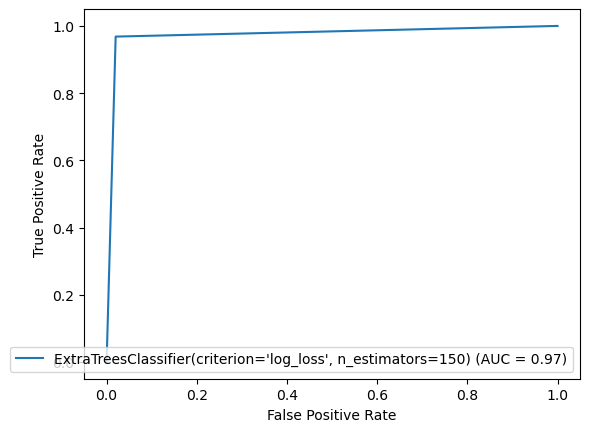

In [110]:
#Ploting roc curve
#Importing necessary libraries
from sklearn.metrics import roc_curve,auc,RocCurveDisplay

fpr,tpr,thresholds=roc_curve(y_test,pr)#Calculating ROC curve values
roc_auc=auc(fpr,tpr)#calculating AUC
display=RocCurveDisplay(fpr=fpr,tpr=tpr,roc_auc=roc_auc,estimator_name=final)#Creating a ROC curve display
display.plot()
plt.show()

**AUC** value is **0.97**, which means the model **performs very well** in **distinguishing between the classes**.

In [111]:
#Conclusion
Predicted_values=final.predict(x_test)#storing predicted values in 'Predicted_values' variable
Original_values=y_test#storing original values in 'Original_values' variable

#creating new data frame with Predicted and Original values
conclusion=pd.DataFrame({'Predicted Values':Predicted_values,'Original Values':Original_values})

In [112]:
conclusion.replace(1,'Yes',inplace=True)
conclusion.replace(0,'No',inplace=True)

In [113]:
conclusion.sample(20)

,Predicted Values,Original Values
330,No,No
1212,No,No
10,No,No
873,No,No
1225,No,No
613,No,No
475,No,Yes
709,No,No
454,No,No
53,No,No


In [114]:
conclusion.sample(20)

,Predicted Values,Original Values
1051,No,No
153,No,No
588,No,No
772,No,No
2274,Yes,Yes
1131,Yes,Yes
1013,No,No
2313,Yes,Yes
2244,Yes,Yes
1010,No,No


Here we can conclude that the model predicted values are almost same with original values, thus , giving excellent performance.

In [115]:
#Saving the model
import joblib
joblib.dump(final,r'D:\Models\HR_Analytics.obj')

['D:\\Models\\HR_Analytics.obj']